In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
from sklearn.metrics import jaccard_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from statsmodels.tsa.stattools import coint
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from itertools import combinations
from sklearn.manifold import TSNE
from itertools import combinations
from sklearn.decomposition import PCA
from sklearn.cluster import AffinityPropagation
from sklearn.metrics import silhouette_score, classification_report


# Import additional libraries
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.base import BaseEstimator, ClassifierMixin
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler


warnings.filterwarnings('ignore')

In [2]:
# Load the Excel file
file_path = 'SPY_cleaned_data.csv'

# Load the data from the specified sheet and set 'Date' column as index
data = pd.read_csv(file_path, parse_dates=['date'], index_col='date')

# Filter the DataFrame to only include data from 1/6/2019 to 31/5/2024
start_date = '2019-06-01'
end_date = '2023-05-31'
data = data.loc[start_date:end_date]

# Define a function to clean ticker symbols
def clean_ticker(ticker):
    return ticker.split()[0]

# Clean the ticker symbols
cleaned_tickers = [clean_ticker(ticker) for ticker in data.columns]

# Replace the column names with cleaned ticker symbols
data.columns = cleaned_tickers

# Display the DataFrame with cleaned ticker symbols
print(data.tail())

# Load sector information from the CSV file
sector_df = pd.read_csv('sector_mapping.csv')

# Create a sector mapping dictionary
sector_mapping = dict(zip(sector_df['Stock'], sector_df['Sector']))

                 A    AAL    AAPL    ABBV    ABNB     ABT   ACGL     ACN  \
date                                                                       
2023-05-24  120.99  13.80  171.84  141.15  105.71  104.04  71.77  286.82   
2023-05-25  119.49  14.38  172.99  138.62  104.42  102.14  72.38  291.76   
2023-05-26  120.42  14.35  175.43  137.56  106.81  102.87  71.00  303.60   
2023-05-30  117.73  14.62  177.30  136.44  107.19  101.71  71.20  308.43   
2023-05-31  115.67  14.78  177.25  137.96  109.77  102.00  69.70  305.92   

              ADBE     ADI  ...     WTW     WY    WYNN    XEL     XOM     XYL  \
date                        ...                                                 
2023-05-24  365.76  173.20  ...  220.62  28.59  101.09  65.13  107.59  101.06   
2023-05-25  392.06  172.39  ...  219.59  28.44  101.02  64.29  105.66   98.89   
2023-05-26  415.39  176.53  ...  221.02  28.25  101.13  64.32  104.97   98.35   
2023-05-30  417.21  177.43  ...  221.29  28.58   99.51  64.15 

# Pair Identification

## Cointegration Test

In [3]:
# Calculate daily returns
returns = data.pct_change().dropna()

# Compute correlation matrix
correlation_matrix = returns.corr()

# Define a function for the Engle-Granger cointegration test
def cointegration_test(pair):
    stock1 = returns[pair[0]]
    stock2 = returns[pair[1]]
    score, p_value, _ = coint(stock1, stock2)
    return p_value

# Find highly correlated pairs
high_correlation_pairs = []
threshold = 0.8
for stock1 in correlation_matrix.columns:
    for stock2 in correlation_matrix.columns:
        if stock1 != stock2 and correlation_matrix.at[stock1, stock2] > threshold:
            high_correlation_pairs.append((stock1, stock2))

# Perform cointegration test on highly correlated pairs
cointegrated_pairs = [pair for pair in high_correlation_pairs if cointegration_test(pair) < 0.05]

# Print the pairs
print(f"Number of cointegrated pairs: {len(cointegrated_pairs)}")
print("Cointegrated pairs:")
for pair in cointegrated_pairs:
    print(f"{pair[0]} and {pair[1]}")

Number of cointegrated pairs: 846
Cointegrated pairs:
AAL and DAL
AAL and UAL
ACGL and WRB
ADI and MCHP
ADI and NXPI
ADI and TXN
ADP and PAYX
AEE and AEP
AEE and ATO
AEE and AWK
AEE and CMS
AEE and DUK
AEE and ED
AEE and ES
AEE and ETR
AEE and EVRG
AEE and LNT
AEE and NI
AEE and SO
AEE and WEC
AEE and XEL
AEP and AEE
AEP and CMS
AEP and DUK
AEP and ES
AEP and ETR
AEP and LNT
AEP and SO
AEP and WEC
AEP and XEL
AFL and PRU
AIG and FITB
AIG and MET
AIG and PFG
AIG and PRU
AJG and BRO
AJG and MMC
AMAT and KLAC
AMAT and LRCX
AMAT and MCHP
AMAT and TER
AMAT and TXN
AME and ETN
AMP and BAC
AMP and BRK-B
AMP and C
AMP and FITB
AMP and GL
AMP and GS
AMP and JPM
AMP and MET
AMP and MS
AMP and NTRS
AMP and PFG
AMP and PNC
AMP and PRU
AMP and RJF
AMP and TFC
AMT and CCI
AMT and SBAC
ANSS and CDNS
ANSS and SNPS
APA and DVN
APA and MRO
APH and TEL
ATO and AEE
ATO and CMS
ATO and DUK
ATO and LNT
ATO and NI
ATO and SO
ATO and WEC
ATO and XEL
AVB and CPT
AVB and EQR
AVB and ESS
AVB and MAA
AVB and UDR


## K-means Clustering

In [4]:
# Define the range of cluster sizes
cluster_range = [50, 100, 150, 200, 250, 300]

for num_clusters in cluster_range:
    # Calculate mean and volatility for each stock
    mean_returns = returns.mean()
    volatility = returns.std()

    # Create a DataFrame with mean and volatility
    features = pd.DataFrame({'Mean': mean_returns, 'Volatility': volatility})

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(features)

    # Calculate silhouette score
    silhouette_avg = silhouette_score(features, kmeans.labels_)

    # Add cluster labels to the DataFrame
    features['Cluster'] = kmeans.labels_

    # Select pairs of stocks from the same cluster
    k_means_pairs = []
    for cluster in range(num_clusters):
        cluster_stocks = features[features['Cluster'] == cluster].index.tolist()
        cluster_pairs = list(combinations(cluster_stocks, 2))
        k_means_pairs.extend(cluster_pairs)

    # Print the number of pairs and silhouette score
    print(f"For {num_clusters} clusters:")
    print(f"Number of pairs: {len(k_means_pairs)}")
    print(f"Silhouette Score: {silhouette_avg}\n")

For 50 clusters:
Number of pairs: 3724
Silhouette Score: 0.3662300126576358

For 100 clusters:
Number of pairs: 1617
Silhouette Score: 0.3573279352449475

For 150 clusters:
Number of pairs: 972
Silhouette Score: 0.3653174898985255

For 200 clusters:
Number of pairs: 595
Silhouette Score: 0.36479036509510376

For 250 clusters:
Number of pairs: 424
Silhouette Score: 0.33816280036604646

For 300 clusters:
Number of pairs: 278
Silhouette Score: 0.3198778020180716



In [5]:
# Calculate mean and volatility for each stock
mean_returns = returns.mean()
volatility = returns.std()

# Create a DataFrame with mean and volatility
features = pd.DataFrame({'Mean': mean_returns, 'Volatility': volatility})

# Apply K-means clustering
num_clusters = 200  # Define the number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(features)

# Calculate silhouette score
silhouette_avg = silhouette_score(features, kmeans.labels_)

# Add cluster labels to the DataFrame
features['Cluster'] = kmeans.labels_

# Select pairs of stocks from the same cluster
k_means_pairs = []
for cluster in range(num_clusters):
    cluster_stocks = features[features['Cluster'] == cluster].index.tolist()
    cluster_pairs = list(combinations(cluster_stocks, 2))
    k_means_pairs.extend(cluster_pairs)

# Print the number of pairs, silhouette score, and pairs
print(f"Number of pairs: {len(k_means_pairs)}")
print(f"Silhouette Score for K-means: {silhouette_avg}")
print("Pairs:")
for pair in k_means_pairs:
    print(f"{pair[0]} and {pair[1]}")


Number of pairs: 595
Silhouette Score for K-means: 0.36479036509510376
Pairs:
DD and FOXA
EPAM and MOS
CPB and MCD
CPB and SJM
MCD and SJM
ADP and CBOE
ADP and CHRW
ADP and MAA
ADP and STZ
ADP and UNP
ADP and VRSN
CBOE and CHRW
CBOE and MAA
CBOE and STZ
CBOE and UNP
CBOE and VRSN
CHRW and MAA
CHRW and STZ
CHRW and UNP
CHRW and VRSN
MAA and STZ
MAA and UNP
MAA and VRSN
STZ and UNP
STZ and VRSN
UNP and VRSN
AXP and BBY
AXP and PFG
AXP and SCHW
BBY and PFG
BBY and SCHW
PFG and SCHW
CAH and PLD
EXPE and WDC
DVN and EQT
DVN and MRO
EQT and MRO
BF-B and BR
BF-B and CLX
BF-B and IEX
BF-B and PM
BF-B and WEC
BR and CLX
BR and IEX
BR and PM
BR and WEC
CLX and IEX
CLX and PM
CLX and WEC
IEX and PM
IEX and WEC
PM and WEC
CVX and HPE
CVX and NTAP
HPE and NTAP
AMAT and URI
AVY and TDY
HRL and KMB
AMP and BX
CNC and VICI
CNC and WAB
VICI and WAB
LEN and MCHP
LEN and NXPI
MCHP and NXPI
UBER and WYNN
BG and CI
BG and ELV
BG and IQV
BG and TECH
BG and VMC
CI and ELV
CI and IQV
CI and TECH
CI and VMC
EL

## Affinity Propagation Clustering

In [6]:
# Define damping values
damping_values = np.linspace(0.5, 0.9, num=5)

for damping in damping_values:
    # Calculate mean and volatility for each stock
    mean_returns = returns.mean()
    volatility = returns.std()

    # Create a DataFrame with mean and volatility
    features = pd.DataFrame({'Mean': mean_returns, 'Volatility': volatility})

    # Apply Affinity Propagation clustering
    affinity_propagation = AffinityPropagation(damping=damping).fit(features)

    # Get cluster labels
    cluster_labels = affinity_propagation.labels_

    # Calculate silhouette score
    silhouette_avg = silhouette_score(features, cluster_labels)

    # Add cluster labels to the DataFrame
    features['Cluster'] = cluster_labels

    # Select pairs of stocks from the same cluster
    aff_prop_pairs = []
    for cluster_id in np.unique(cluster_labels):
        cluster_stocks = features[features['Cluster'] == cluster_id].index.tolist()
        cluster_pairs = list(combinations(cluster_stocks, 2))
        aff_prop_pairs.extend(cluster_pairs)

    # Print the number of pairs and silhouette score
    print(f"For damping={damping}:")
    print(f"Number of pairs: {len(aff_prop_pairs)}")
    print(f"Silhouette Score for Affinity Propagation: {silhouette_avg}\n")

For damping=0.5:
Number of pairs: 9975
Silhouette Score for Affinity Propagation: 0.4263956028067557

For damping=0.6:
Number of pairs: 12048
Silhouette Score for Affinity Propagation: 0.4456344169215218

For damping=0.7:
Number of pairs: 10891
Silhouette Score for Affinity Propagation: 0.4351107141264906

For damping=0.8:
Number of pairs: 10793
Silhouette Score for Affinity Propagation: 0.4360998791687579

For damping=0.9:
Number of pairs: 11050
Silhouette Score for Affinity Propagation: 0.4377365969348574



In [7]:
# Calculate mean and volatility for each stock
mean_returns = returns.mean()
volatility = returns.std()

# Create a DataFrame with mean and volatility
features = pd.DataFrame({'Mean': mean_returns, 'Volatility': volatility})

# Apply Affinity Propagation clustering
affinity_propagation = AffinityPropagation(damping=0.6).fit(features)

# Get cluster labels
cluster_labels = affinity_propagation.labels_

# Calculate silhouette score
silhouette_avg = silhouette_score(features, cluster_labels)

# Add cluster labels to the DataFrame
features['Cluster'] = cluster_labels

# Select pairs of stocks from the same cluster
aff_prop_pairs = []
for cluster_id in np.unique(cluster_labels):
    cluster_stocks = features[features['Cluster'] == cluster_id].index.tolist()
    cluster_pairs = list(combinations(cluster_stocks, 2))
    aff_prop_pairs.extend(cluster_pairs)

# Print the number of pairs, silhouette score, and pairs
print(f"Number of exemplars: {len(np.unique(cluster_labels))}")
print(f"Number of pairs: {len(aff_prop_pairs)}")
print(f"Silhouette Score for Affinity Propagation: {silhouette_avg}")
print("Pairs:")
for pair in aff_prop_pairs:
    print(f"{pair[0]} and {pair[1]}")


Number of exemplars: 15
Number of pairs: 12048
Silhouette Score for Affinity Propagation: 0.4456344169215218
Pairs:
A and ACN
A and ADM
A and ADP
A and AKAM
A and ALL
A and AME
A and APD
A and APH
A and ARE
A and AWK
A and AZO
A and BAX
A and BRO
A and BSX
A and CB
A and CBOE
A and CCI
A and CHRW
A and CMCSA
A and CME
A and CMI
A and COO
A and COR
A and CPT
A and CSCO
A and CVS
A and D
A and DHR
A and DTE
A and EIX
A and ES
A and ETR
A and EVRG
A and EXC
A and EXR
A and FAST
A and GRMN
A and HD
A and HII
A and HON
A and HSIC
A and ITW
A and J
A and JCI
A and JKHY
A and JNPR
A and KHC
A and KR
A and LDOS
A and LHX
A and MAA
A and MCK
A and MSI
A and NDAQ
A and NEE
A and NI
A and NOC
A and ORLY
A and PCAR
A and PNW
A and PPL
A and ROL
A and SRE
A and STE
A and STZ
A and TMO
A and TMUS
A and TRV
A and UNH
A and UNP
A and V
A and VRSN
A and WTW
A and ZTS
ACN and ADM
ACN and ADP
ACN and AKAM
ACN and ALL
ACN and AME
ACN and APD
ACN and APH
ACN and ARE
ACN and AWK
ACN and AZO
ACN and BAX
ACN 

In [8]:
# Convert pairs to sets of tuples
aff_prop_set = set([tuple(sorted(pair)) for pair in aff_prop_pairs])
k_means_set = set([tuple(sorted(pair)) for pair in k_means_pairs])
cointegrated_set = set([tuple(sorted(pair)) for pair in cointegrated_pairs])

# Find pairs common to all sets
common_pairs = aff_prop_set.intersection(k_means_set, cointegrated_set)
# common_pairs = k_means_set.intersection(cointegrated_set)

# Convert the common pairs back to lists
common_pairs = [list(pair) for pair in common_pairs]

# Print number of common pairs
print(f"Number of common pairs: {len(common_pairs)}")

# Print common pairs
print("Pairs common to all methods:")
for pair in common_pairs:
    print(pair)


Number of common pairs: 25
Pairs common to all methods:
['CMS', 'ED']
['CB', 'TRV']
['CMS', 'LNT']
['RSG', 'WM']
['PRU', 'WFC']
['DUK', 'ED']
['CMS', 'XEL']
['ETR', 'EVRG']
['ESS', 'UDR']
['AXP', 'PFG']
['DUK', 'LNT']
['GOOG', 'GOOGL']
['DUK', 'XEL']
['BAC', 'PNC']
['COF', 'FITB']
['LNT', 'XEL']
['MCHP', 'NXPI']
['DVN', 'MRO']
['CMS', 'DUK']
['ED', 'LNT']
['ED', 'XEL']
['EQR', 'UDR']
['EQR', 'ESS']
['AEE', 'ATO']
['AZO', 'ORLY']


In [12]:
# List of pairs to exclude from filtering
exclude_pairs = [
    ('GOOG', 'GOOGL'),
    ('NWS', 'NWSA'),
    ('FOX', 'FOXA')
]

# Convert exclude_pairs to a set for efficient lookup
pairs_to_exclude = set(exclude_pairs)

# Filter pairs from common_pairs based on exclude_pairs
filtered_pairs = [pair for pair in common_pairs if tuple(pair) not in pairs_to_exclude]

pair_list = []
print("Filtered pairs:")
for pair in filtered_pairs:
    pair_list.append([ind_pair.split()[0] for ind_pair in pair])
    print(pair)

Filtered pairs:
['CMS', 'ED']
['CB', 'TRV']
['CMS', 'LNT']
['RSG', 'WM']
['PRU', 'WFC']
['DUK', 'ED']
['CMS', 'XEL']
['ETR', 'EVRG']
['ESS', 'UDR']
['AXP', 'PFG']
['DUK', 'LNT']
['DUK', 'XEL']
['BAC', 'PNC']
['COF', 'FITB']
['LNT', 'XEL']
['MCHP', 'NXPI']
['DVN', 'MRO']
['CMS', 'DUK']
['ED', 'LNT']
['ED', 'XEL']
['EQR', 'UDR']
['EQR', 'ESS']
['AEE', 'ATO']
['AZO', 'ORLY']


In [16]:
pair_df = pd.DataFrame(pair_list, columns=['Stock1', 'Stock2'])
pair_df

,Stock1,Stock2
0,CMS,ED
1,CB,TRV
2,CMS,LNT
3,RSG,WM
4,PRU,WFC
5,DUK,ED
6,CMS,XEL
7,ETR,EVRG
8,ESS,UDR
9,AXP,PFG


[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%*******

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step


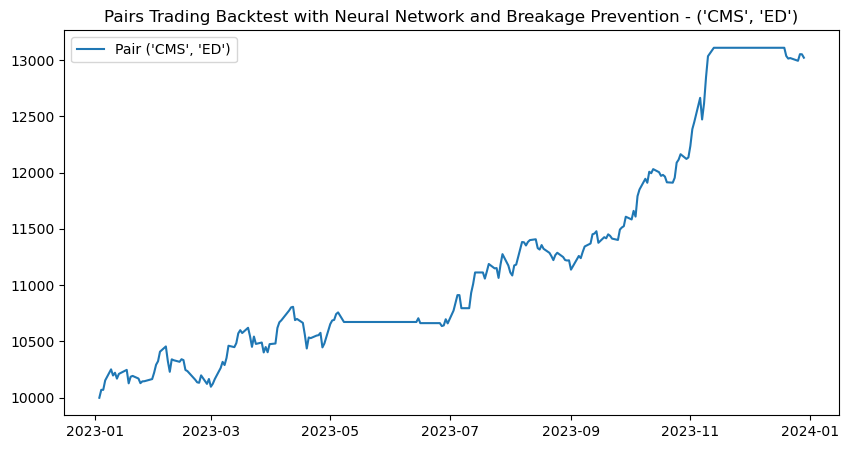

Performance for pair ('CMS', 'ED'):
Cumulative Return: 30.49%
Sharpe Ratio: 3.07
Sortino Ratio: 0.34
Max Drawdown: -3.42%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 516us/step


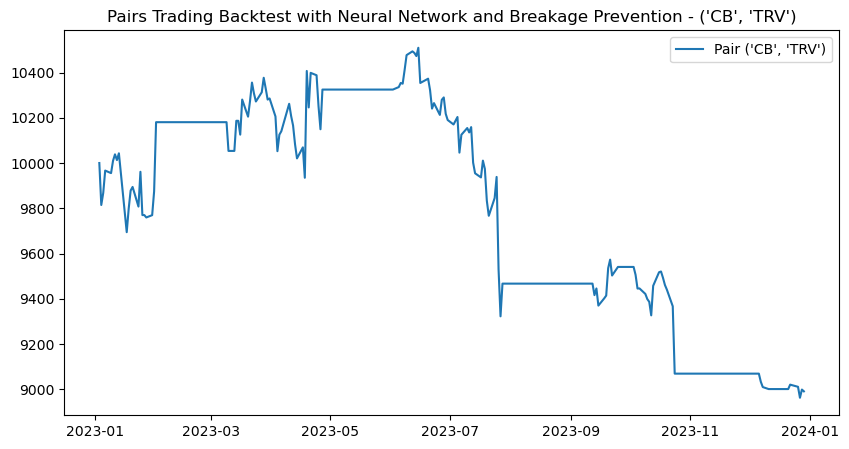

Performance for pair ('CB', 'TRV'):
Cumulative Return: -10.17%
Sharpe Ratio: -0.83
Sortino Ratio: -0.07
Max Drawdown: -14.72%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step


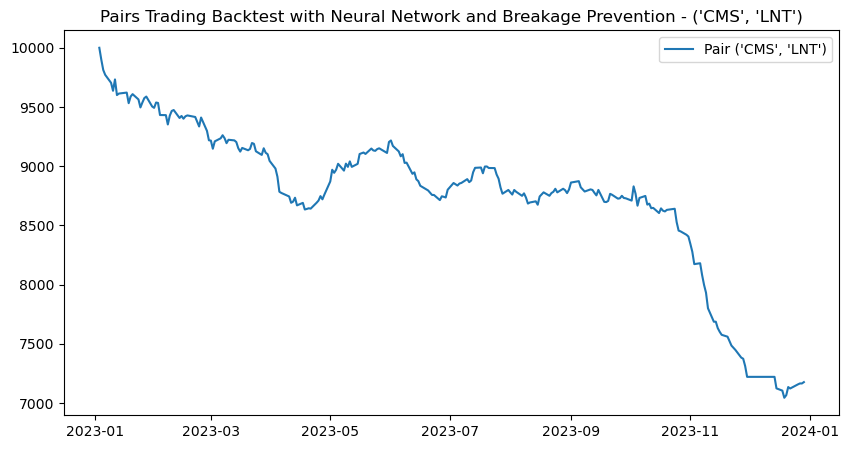

Performance for pair ('CMS', 'LNT'):
Cumulative Return: -28.42%
Sharpe Ratio: -3.93
Sortino Ratio: -0.29
Max Drawdown: -29.31%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step


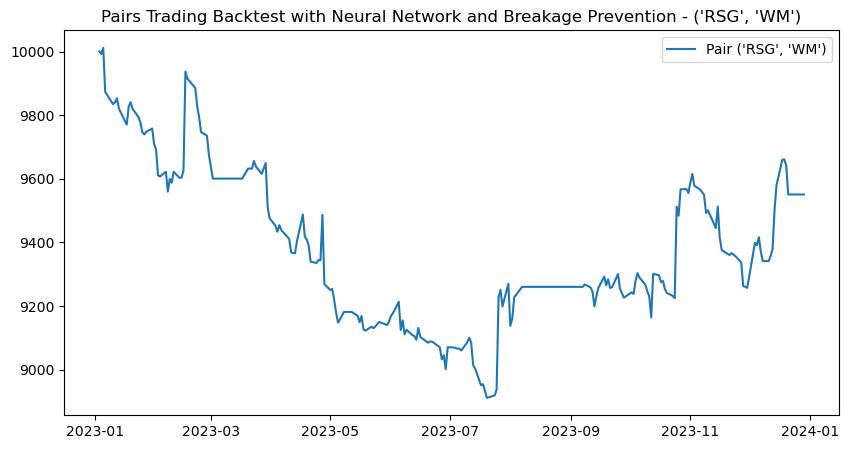

Performance for pair ('RSG', 'WM'):
Cumulative Return: -4.53%
Sharpe Ratio: -0.49
Sortino Ratio: -0.05
Max Drawdown: -10.99%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 547us/step


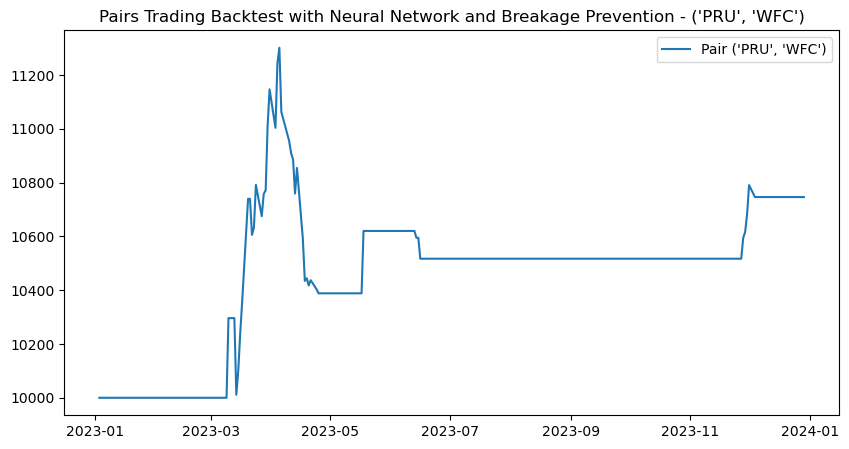

Performance for pair ('PRU', 'WFC'):
Cumulative Return: 7.53%
Sharpe Ratio: 0.87
Sortino Ratio: 0.09
Max Drawdown: -8.08%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 523us/step


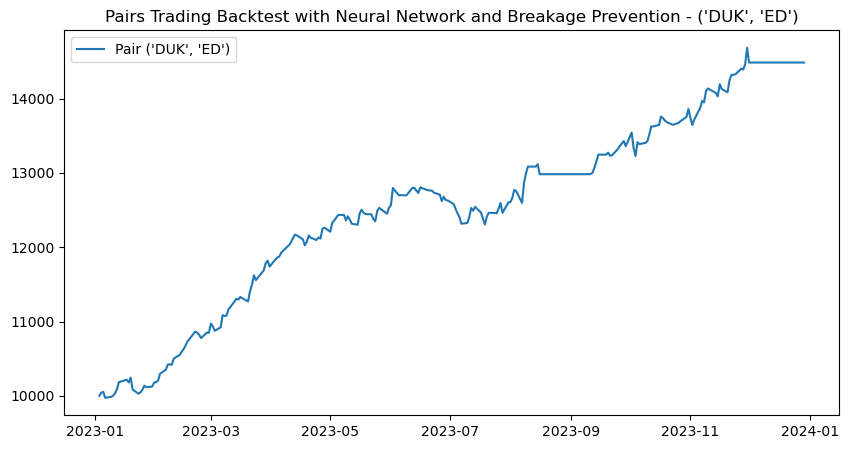

Performance for pair ('DUK', 'ED'):
Cumulative Return: 45.28%
Sharpe Ratio: 4.24
Sortino Ratio: 0.49
Max Drawdown: -3.90%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step


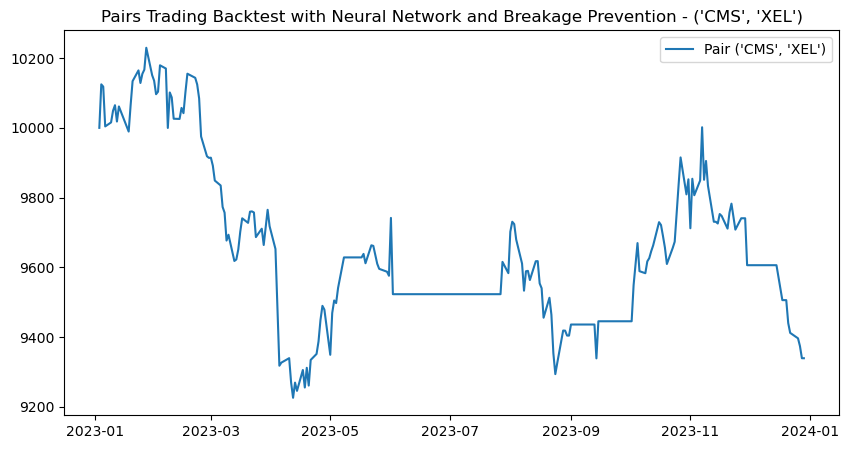

Performance for pair ('CMS', 'XEL'):
Cumulative Return: -6.66%
Sharpe Ratio: -0.74
Sortino Ratio: -0.06
Max Drawdown: -9.82%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step


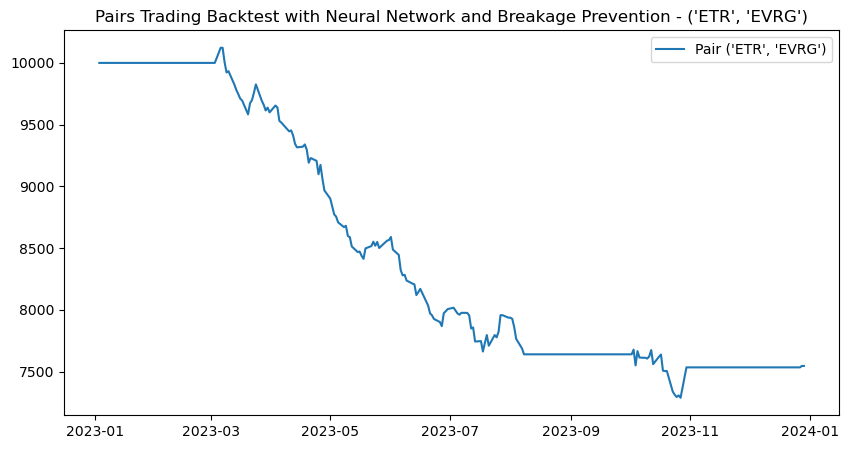

Performance for pair ('ETR', 'EVRG'):
Cumulative Return: -24.71%
Sharpe Ratio: -3.10
Sortino Ratio: -0.24
Max Drawdown: -28.00%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step


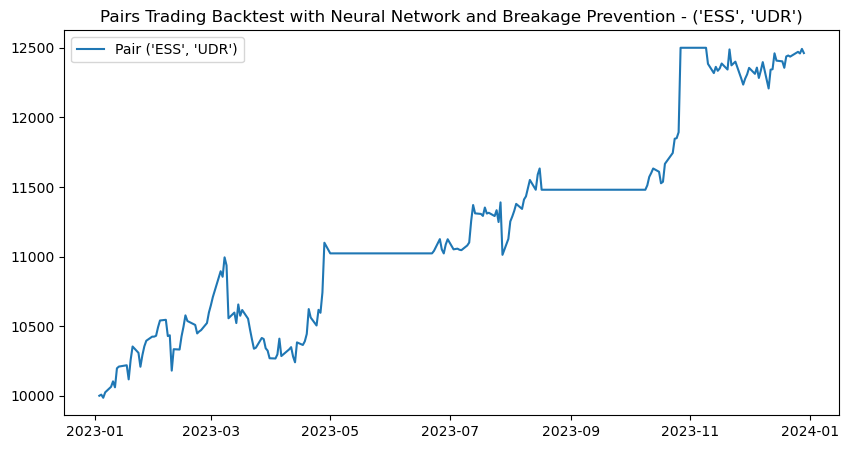

Performance for pair ('ESS', 'UDR'):
Cumulative Return: 24.85%
Sharpe Ratio: 1.97
Sortino Ratio: 0.20
Max Drawdown: -6.86%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 479us/step


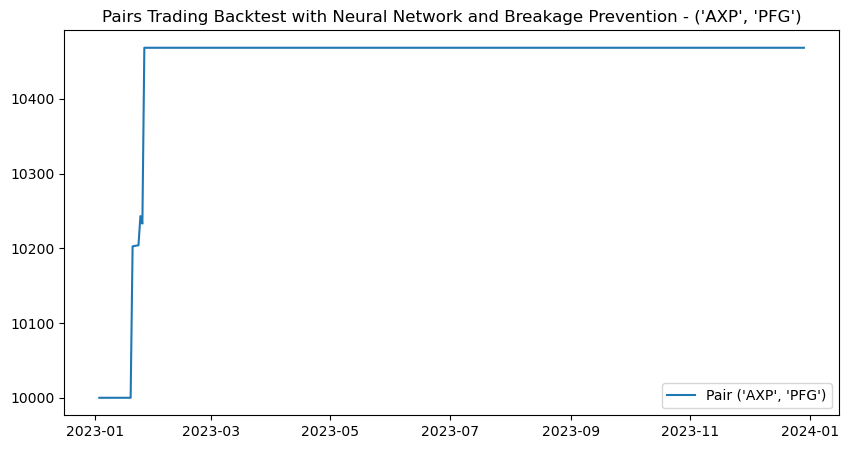

Performance for pair ('AXP', 'PFG'):
Cumulative Return: 4.72%
Sharpe Ratio: 1.51
Sortino Ratio: 2.99
Max Drawdown: -0.10%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 500us/step


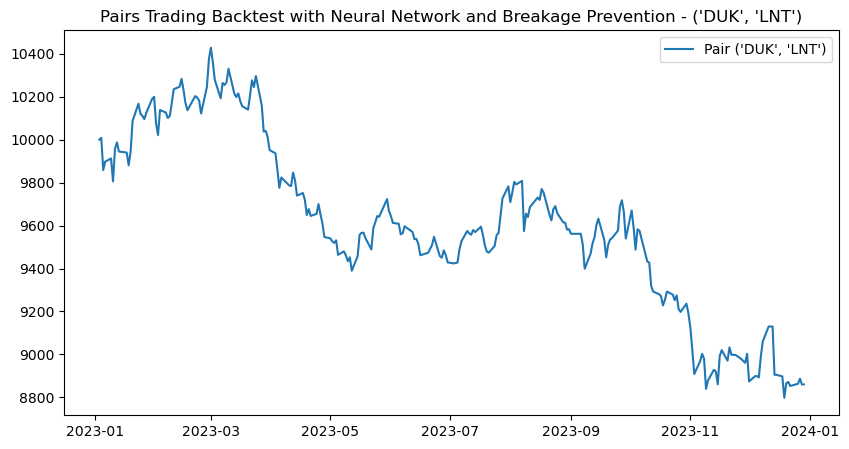

Performance for pair ('DUK', 'LNT'):
Cumulative Return: -11.48%
Sharpe Ratio: -1.19
Sortino Ratio: -0.10
Max Drawdown: -15.63%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 515us/step


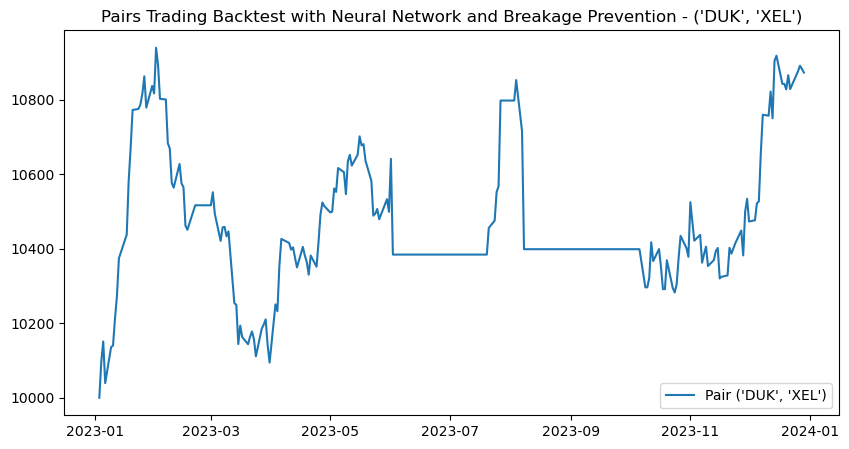

Performance for pair ('DUK', 'XEL'):
Cumulative Return: 8.81%
Sharpe Ratio: 1.01
Sortino Ratio: 0.09
Max Drawdown: -7.73%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step


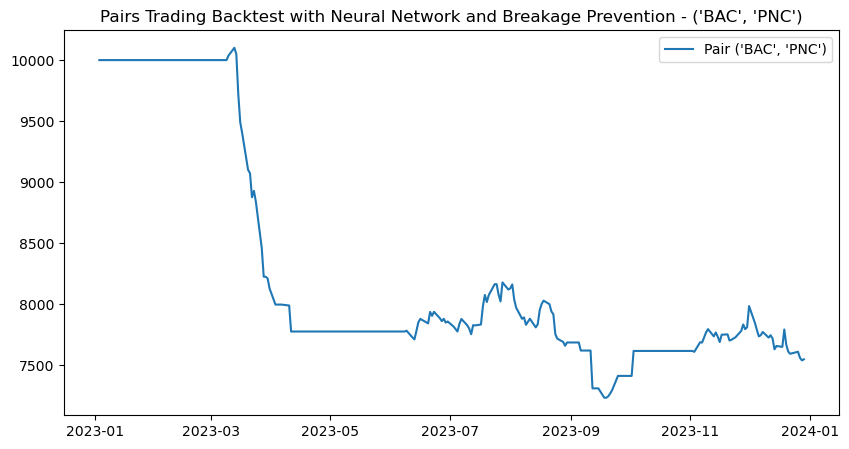

Performance for pair ('BAC', 'PNC'):
Cumulative Return: -24.68%
Sharpe Ratio: -2.19
Sortino Ratio: -0.16
Max Drawdown: -28.39%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step


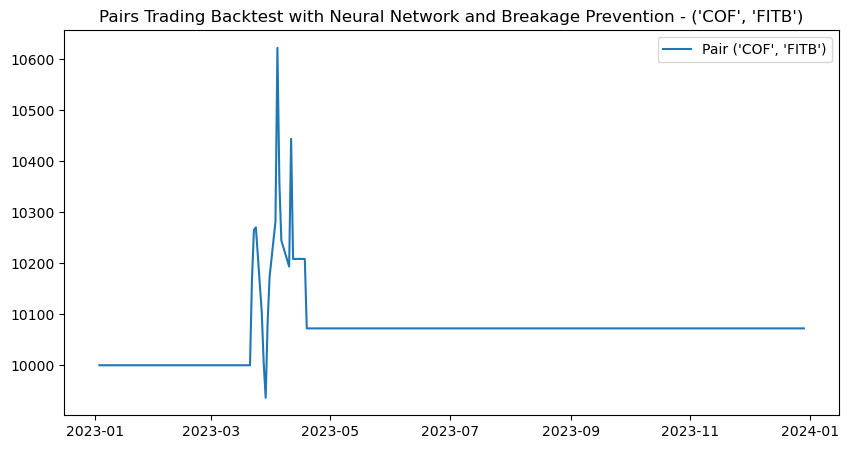

Performance for pair ('COF', 'FITB'):
Cumulative Return: 0.73%
Sharpe Ratio: 0.14
Sortino Ratio: 0.01
Max Drawdown: -5.18%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


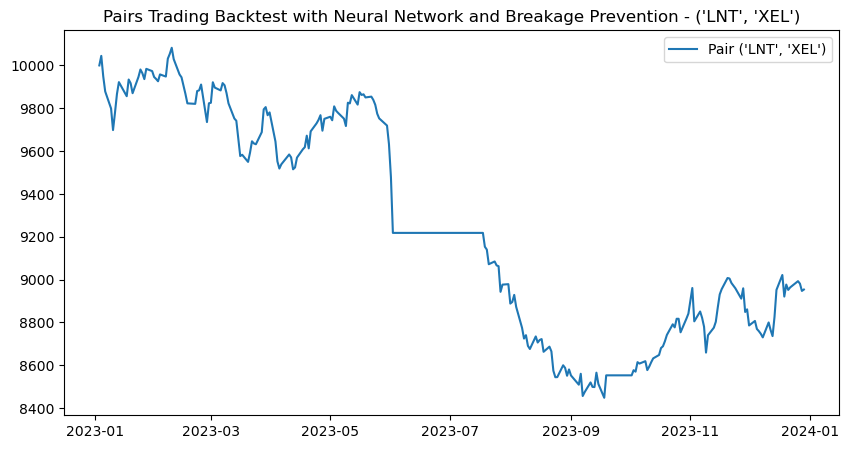

Performance for pair ('LNT', 'XEL'):
Cumulative Return: -10.54%
Sharpe Ratio: -1.22
Sortino Ratio: -0.10
Max Drawdown: -16.21%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step


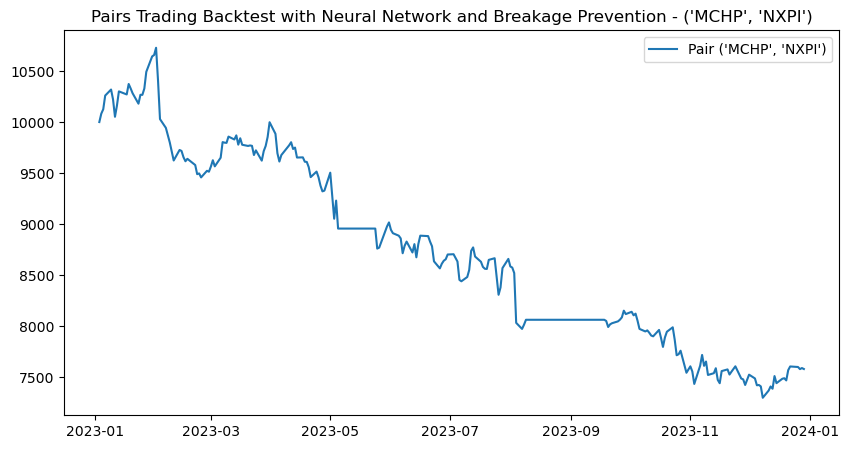

Performance for pair ('MCHP', 'NXPI'):
Cumulative Return: -24.36%
Sharpe Ratio: -1.67
Sortino Ratio: -0.13
Max Drawdown: -31.96%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step


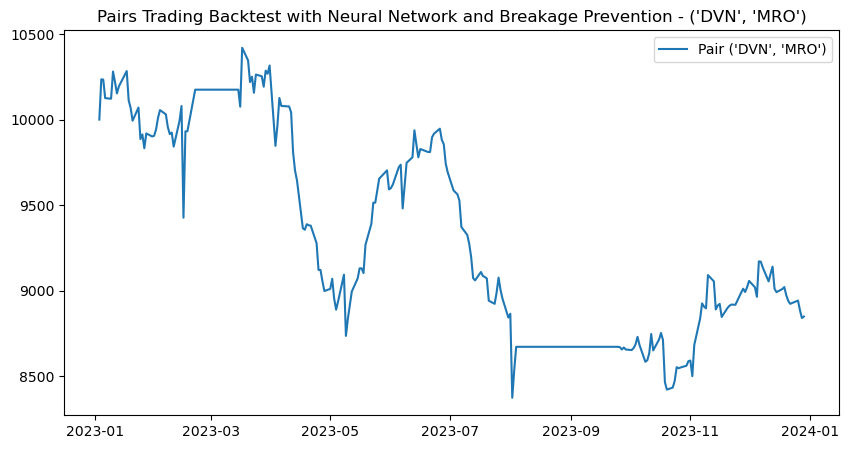

Performance for pair ('DVN', 'MRO'):
Cumulative Return: -11.60%
Sharpe Ratio: -0.60
Sortino Ratio: -0.05
Max Drawdown: -19.65%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step


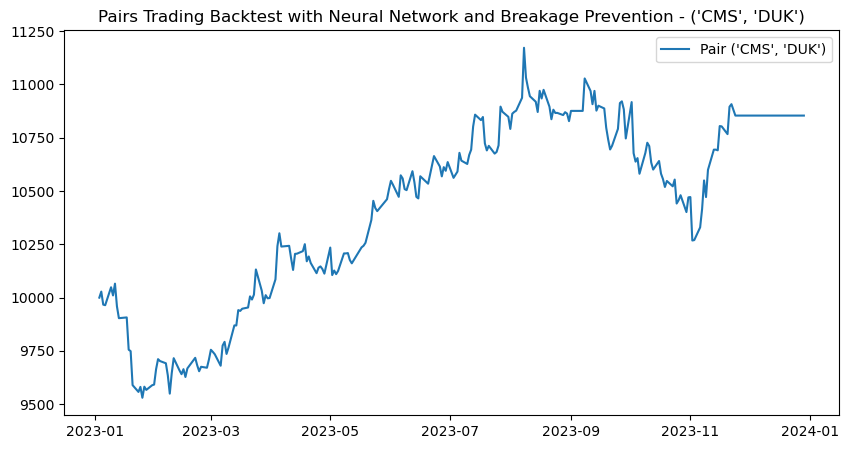

Performance for pair ('CMS', 'DUK'):
Cumulative Return: 8.61%
Sharpe Ratio: 0.91
Sortino Ratio: 0.09
Max Drawdown: -8.09%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step


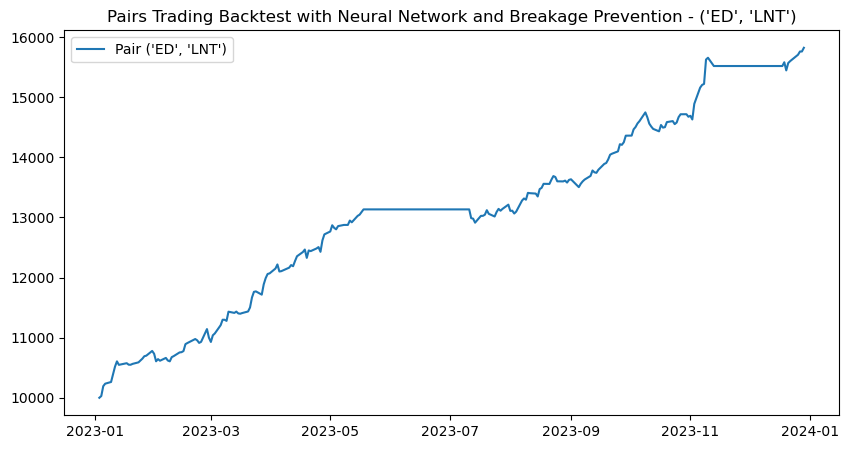

Performance for pair ('ED', 'LNT'):
Cumulative Return: 58.79%
Sharpe Ratio: 5.57
Sortino Ratio: 0.76
Max Drawdown: -2.13%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 487us/step


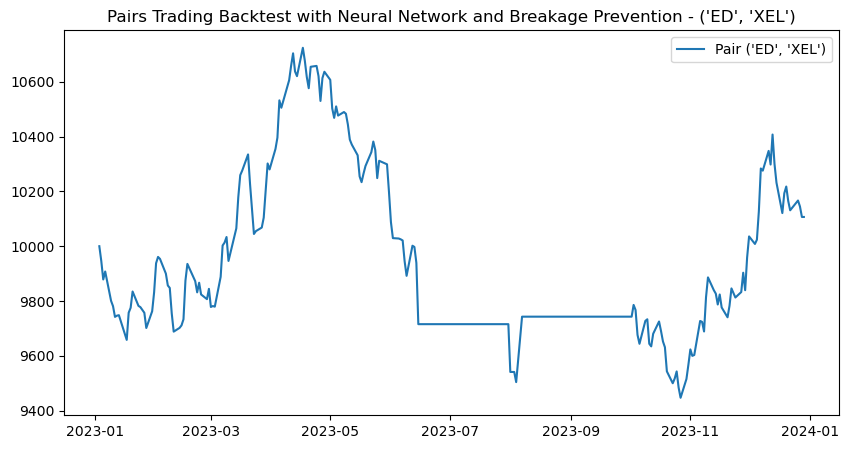

Performance for pair ('ED', 'XEL'):
Cumulative Return: 1.07%
Sharpe Ratio: 0.16
Sortino Ratio: 0.02
Max Drawdown: -11.90%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step


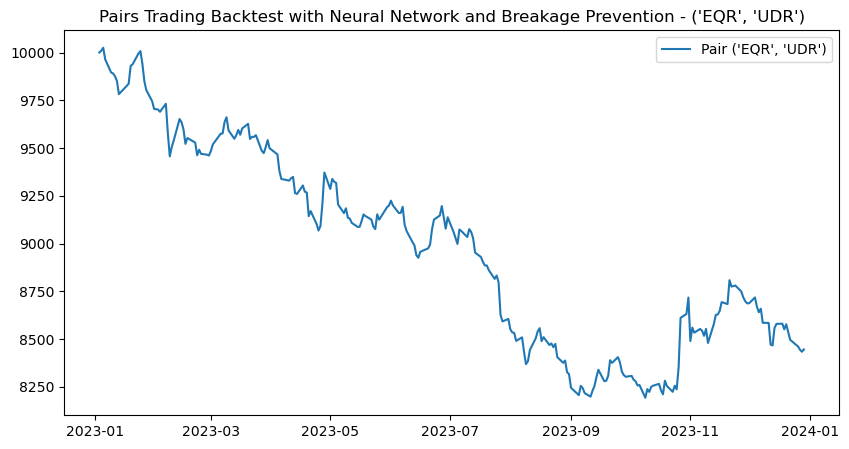

Performance for pair ('EQR', 'UDR'):
Cumulative Return: -15.66%
Sharpe Ratio: -1.76
Sortino Ratio: -0.15
Max Drawdown: -18.27%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 509us/step


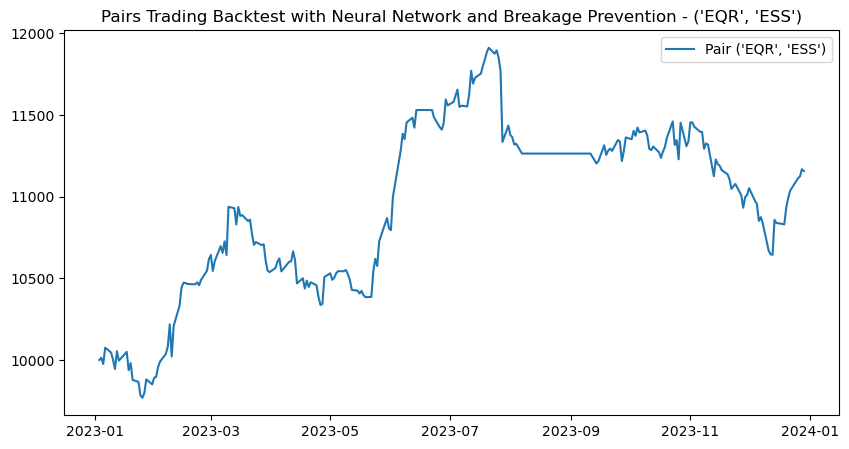

Performance for pair ('EQR', 'ESS'):
Cumulative Return: 11.67%
Sharpe Ratio: 1.07
Sortino Ratio: 0.10
Max Drawdown: -10.64%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step


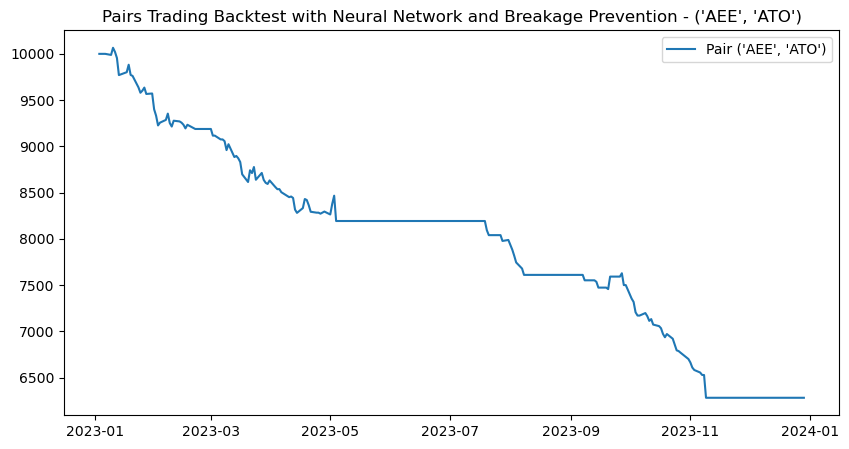

Performance for pair ('AEE', 'ATO'):
Cumulative Return: -37.42%
Sharpe Ratio: -4.93
Sortino Ratio: -0.33
Max Drawdown: -37.59%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step


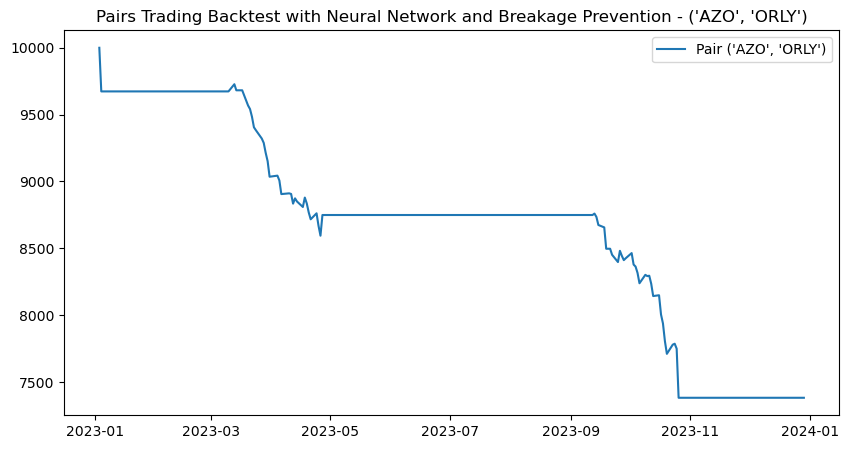

Performance for pair ('AZO', 'ORLY'):
Cumulative Return: -26.36%
Sharpe Ratio: -3.85
Sortino Ratio: -0.25
Max Drawdown: -25.41%


In [14]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import tensorflow as tf

# Function to get stock data
def get_stock_data(tickers, start_date, end_date):
    data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']
    return data

# Function to generate features for neural network
def generate_features(stock1, stock2, window=30):
    spread = stock1 - stock2 
    features = pd.DataFrame(index=spread.index)
    features['spread'] = spread
    features['zscore'] = (spread - spread.rolling(window).mean()) / spread.rolling(window).std()
    features['spread_change'] = spread.diff()
    features = features.dropna()
    return features

# Function to train neural network model
def train_nn_model(features, train_start, train_end):
    scaler = StandardScaler()
    X = scaler.fit_transform(features[['spread', 'zscore', 'spread_change']])
    y = np.sign(features['spread_change'].shift(-1)).dropna()
    X = X[:-1]  # Ensure X and y have the same length

    train_mask = (features.index[:-1] >= train_start) & (features.index[:-1] <= train_end)
    X_train, y_train = X[train_mask], y[train_mask]

    model = Sequential()
    model.add(Dense(64, input_dim=X.shape[1], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))

    model.compile(loss='mse', optimizer='adam')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)
    
    return model, scaler

# Function to generate trading signals using the trained neural network model
def generate_signals(model, scaler, features):
    X = scaler.transform(features[['spread', 'zscore', 'spread_change']])
    predictions = model.predict(X) # TO CHECK IF THIS IS THE AMT TO LONG AND SHORT 
    signals = pd.DataFrame(index=features.index)
    signals['signal'] = predictions
    signals['long'] = (signals['signal'] > 0).astype(int)
    signals['short'] = (signals['signal'] < 0).astype(int)
    return signals

# Function to backtest pairs with breakage prevention
def backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end, correlation_threshold=0.8, window=30, initial_capital=10000):
    positions = pd.DataFrame(index=signals.index).fillna(0.0)
    positions[stock1.name] = signals['long'] - signals['short']
    positions[stock2.name] = -positions[stock1.name]

    stock1_returns = stock1.pct_change().fillna(0)
    stock2_returns = stock2.pct_change().fillna(0)

    portfolio = pd.DataFrame(index=positions.index)
    portfolio['stock1'] = positions[stock1.name] * stock1_returns
    portfolio['stock2'] = positions[stock2.name] * stock2_returns
    portfolio['total'] = portfolio['stock1'] + portfolio['stock2']

    portfolio['returns'] = portfolio['total']

    rolling_corr = stock1_returns.rolling(window=window).corr(stock2_returns)

    portfolio['exit'] = (rolling_corr < correlation_threshold).astype(int).shift(1).fillna(0)
    portfolio.loc[portfolio['exit'] == 1, 'returns'] = 0

    test_mask = (portfolio.index >= test_start) & (portfolio.index <= test_end)
    test_portfolio = portfolio[test_mask].copy()

    # Reset cumulative returns for the test period
    test_portfolio['cumulative'] = (test_portfolio['returns'] + 1).cumprod()
    test_portfolio['cumulative'] = test_portfolio['cumulative'] * initial_capital
    test_portfolio.iloc[0, test_portfolio.columns.get_loc('cumulative')] = initial_capital

    return test_portfolio

# Performance metrics calculation functions
def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = np.prod(returns + 1)
    return cum_ret_final ** (1 / num_years) - 1

def Sharpe(returns, risk_free=0):
    adj_returns = returns - risk_free
    return (np.nanmean(adj_returns) * np.sqrt(252)) / np.nanstd(adj_returns, ddof=1)

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, None, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def max_drawdown(returns):
    wealth_index = 1000 * (1 + returns).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdown = (wealth_index - previous_peaks) / previous_peaks
    return drawdown.min()

# Simplified function to calculate performance metrics
def calculate_performance_metrics(cumulative_pnl, returns):
    cumulative_return = annual_returns(returns) * 100
    sharpe_ratio = Sharpe(returns)
    sortino_ratio = sortino(returns)
    max_drawdown_value = max_drawdown(returns) * 100

    return cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value

start_date = '2018-01-01'
end_date = '2023-12-31'
all_stock_data = {}
for index, row in pair_df.iterrows():
    pair = [row['Stock1'], row['Stock2']]
    data = get_stock_data(pair, start_date, end_date)
    all_stock_data[tuple(pair)] = data

# Define training and testing periods
train_start = '2018-01-01'
train_end = '2022-12-31'
test_start = '2023-01-01'
test_end = '2023-12-31'

# Loop through each pair and backtest using Neural Network with pair breakage prevention
results = {}
performance_metrics = {}

for pair, data in all_stock_data.items():
    stock1, stock2 = data[pair[0]], data[pair[1]]
    features = generate_features(stock1, stock2)
    if features.empty:
        continue
    model, scaler = train_nn_model(features, train_start, train_end)
    signals = generate_signals(model, scaler, features)
    if signals.empty:
        continue
    portfolio = backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end)
    results[pair] = portfolio
    cumulative_pnl = portfolio['cumulative']
    pnl = portfolio['returns']
    performance_metrics[pair] = calculate_performance_metrics(cumulative_pnl, pnl)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(portfolio['cumulative'], label=f"Pair {pair}")
    plt.title(f"Pairs Trading Backtest with Neural Network and Breakage Prevention - {pair}")
    plt.legend()
    plt.show()

    # Print performance metrics
    cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value = performance_metrics[pair]
    print(f"Performance for pair {pair}:")
    print(f"Cumulative Return: {cumulative_return:.2f}%")
    print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Sortino Ratio: {sortino_ratio:.2f}")
    print(f"Max Drawdown: {max_drawdown_value:.2f}%")

[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%*******

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step


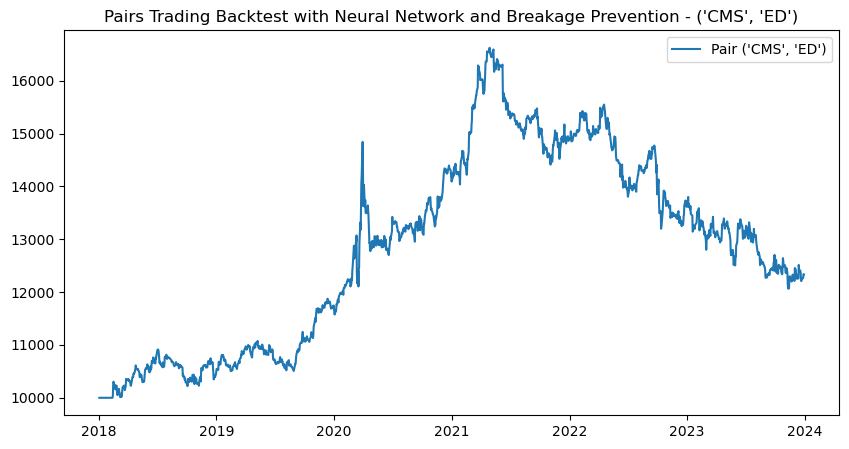

Performance for pair ('CMS', 'ED'):
Cumulative Return: 3.57%
Sharpe Ratio: 0.37
Sortino Ratio: 0.03
Max Drawdown: -27.41%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 548us/step


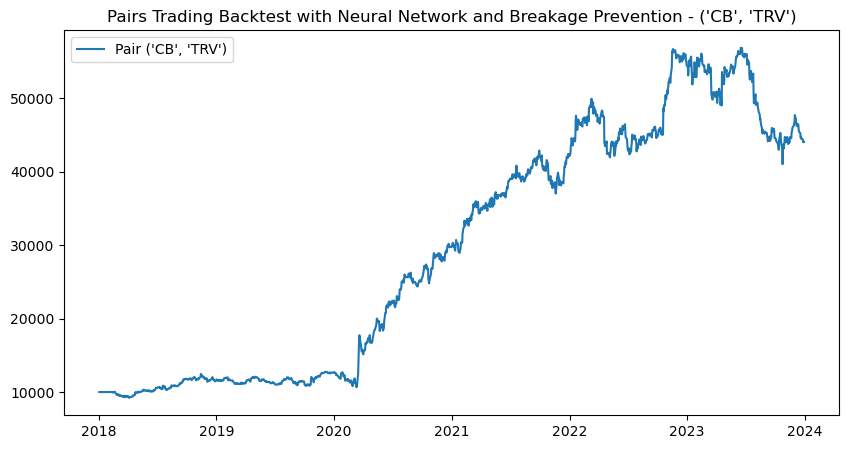

Performance for pair ('CB', 'TRV'):
Cumulative Return: 28.12%
Sharpe Ratio: 1.19
Sortino Ratio: 0.12
Max Drawdown: -27.85%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step


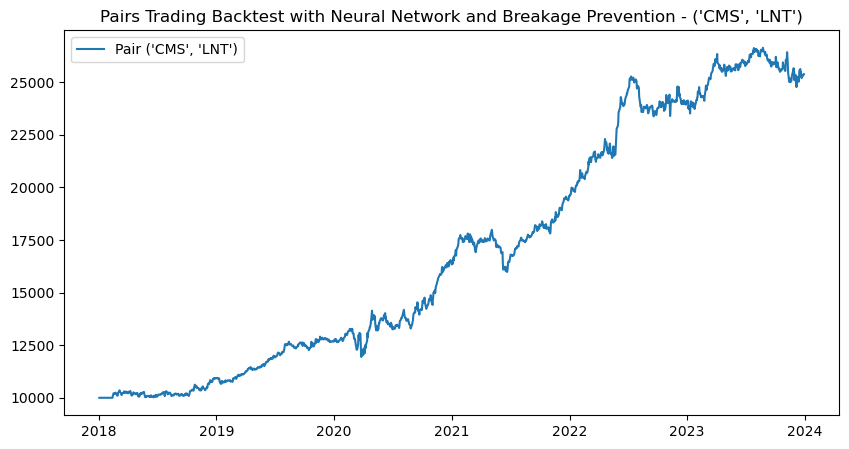

Performance for pair ('CMS', 'LNT'):
Cumulative Return: 16.84%
Sharpe Ratio: 1.55
Sortino Ratio: 0.15
Max Drawdown: -11.16%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step


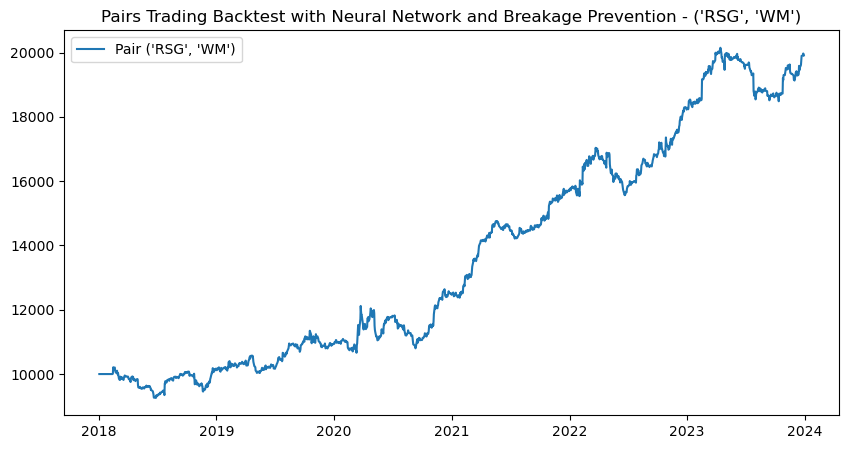

Performance for pair ('RSG', 'WM'):
Cumulative Return: 12.20%
Sharpe Ratio: 1.27
Sortino Ratio: 0.13
Max Drawdown: -10.88%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 463us/step


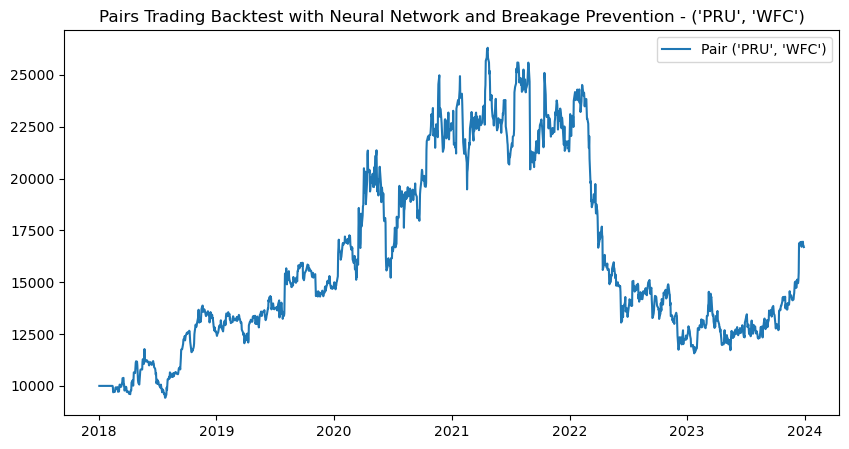

Performance for pair ('PRU', 'WFC'):
Cumulative Return: 8.94%
Sharpe Ratio: 0.42
Sortino Ratio: 0.04
Max Drawdown: -56.02%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 468us/step


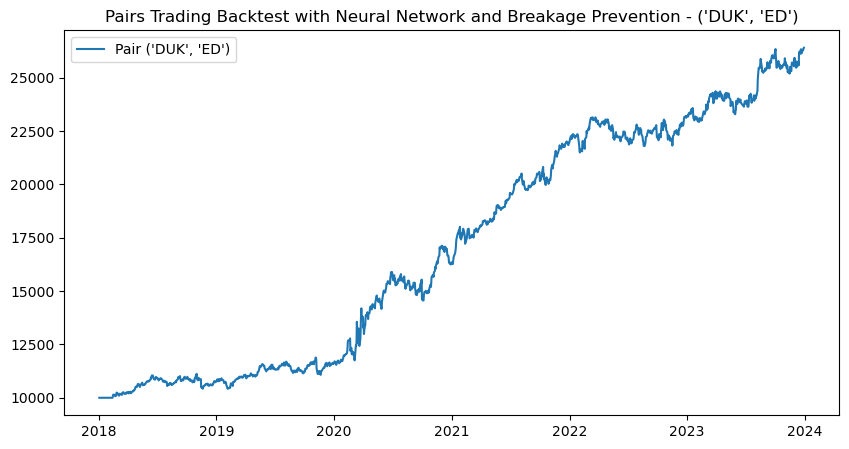

Performance for pair ('DUK', 'ED'):
Cumulative Return: 17.62%
Sharpe Ratio: 1.39
Sortino Ratio: 0.13
Max Drawdown: -8.49%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 511us/step


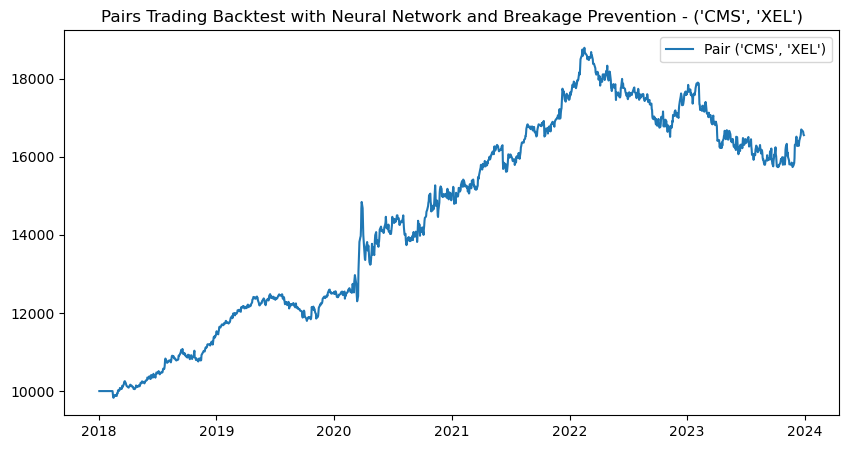

Performance for pair ('CMS', 'XEL'):
Cumulative Return: 8.79%
Sharpe Ratio: 0.95
Sortino Ratio: 0.09
Max Drawdown: -16.26%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 505us/step


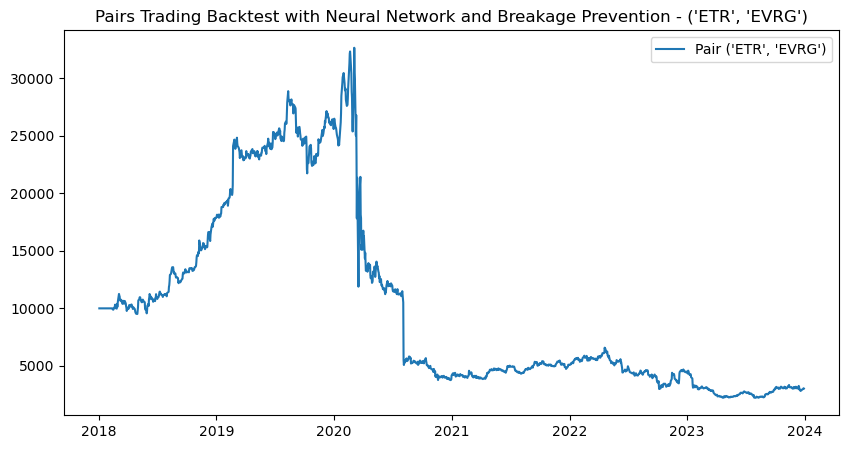

Performance for pair ('ETR', 'EVRG'):
Cumulative Return: -18.09%
Sharpe Ratio: -0.11
Sortino Ratio: -0.01
Max Drawdown: -93.18%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step


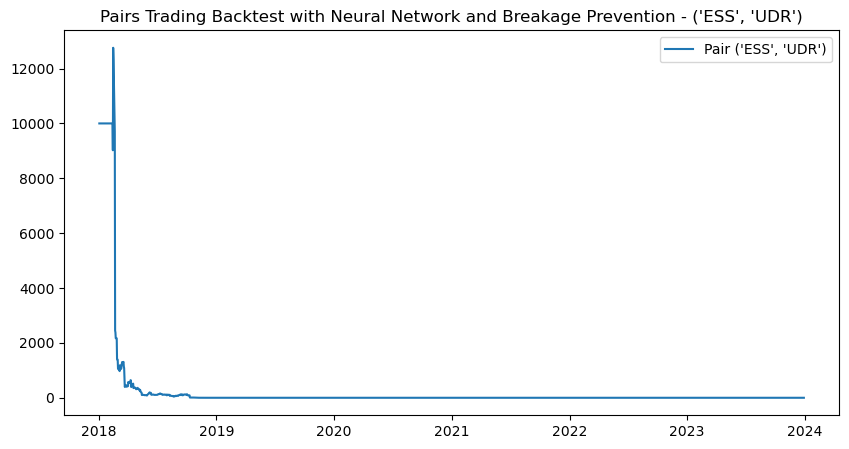

Performance for pair ('ESS', 'UDR'):
Cumulative Return: -99.99%
Sharpe Ratio: -1.19
Sortino Ratio: -0.09
Max Drawdown: -100.00%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step


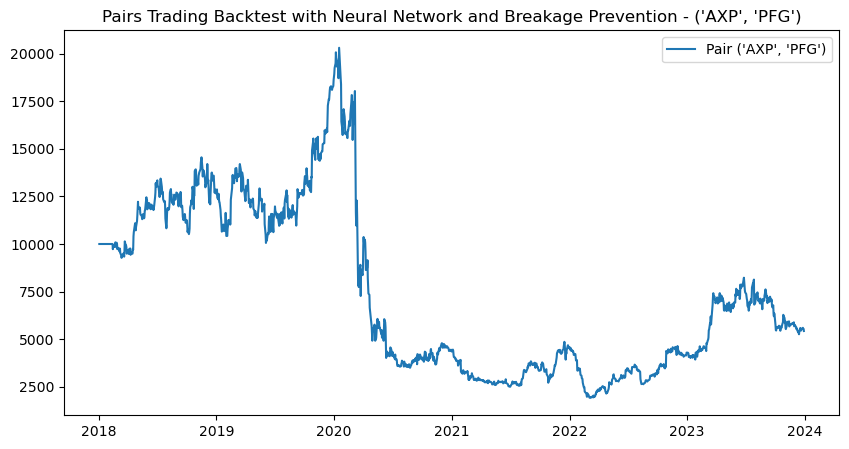

Performance for pair ('AXP', 'PFG'):
Cumulative Return: -9.70%
Sharpe Ratio: 0.12
Sortino Ratio: 0.01
Max Drawdown: -90.52%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step


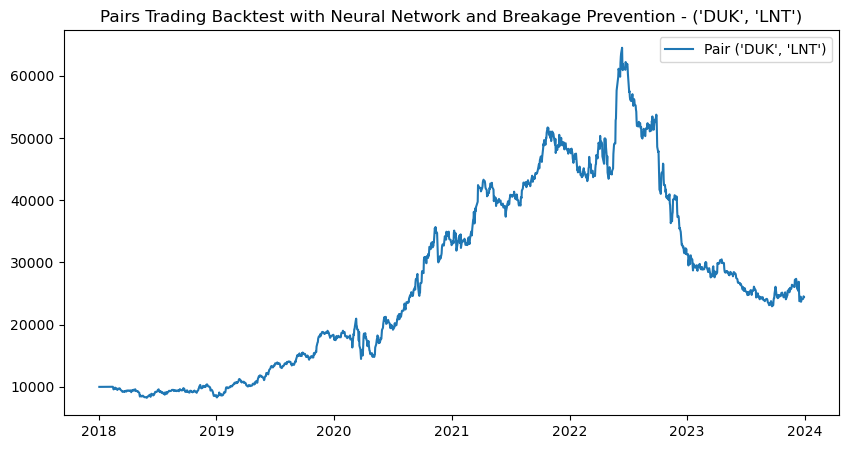

Performance for pair ('DUK', 'LNT'):
Cumulative Return: 16.14%
Sharpe Ratio: 0.65
Sortino Ratio: 0.06
Max Drawdown: -64.42%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step


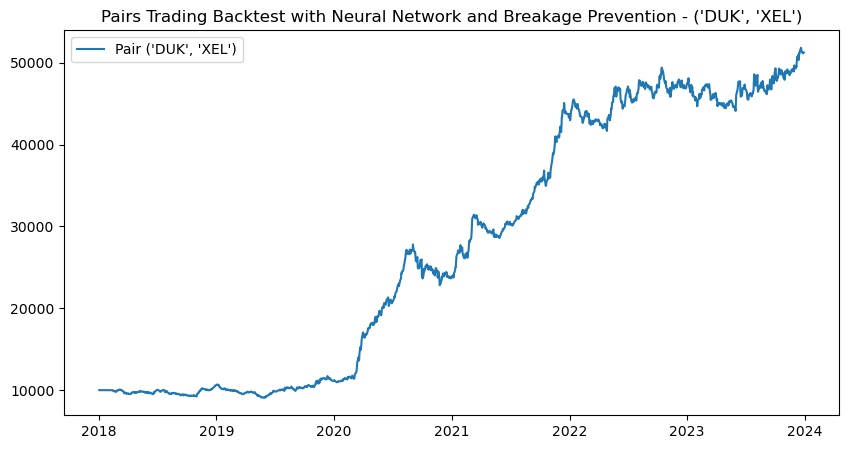

Performance for pair ('DUK', 'XEL'):
Cumulative Return: 31.40%
Sharpe Ratio: 1.85
Sortino Ratio: 0.18
Max Drawdown: -17.92%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step


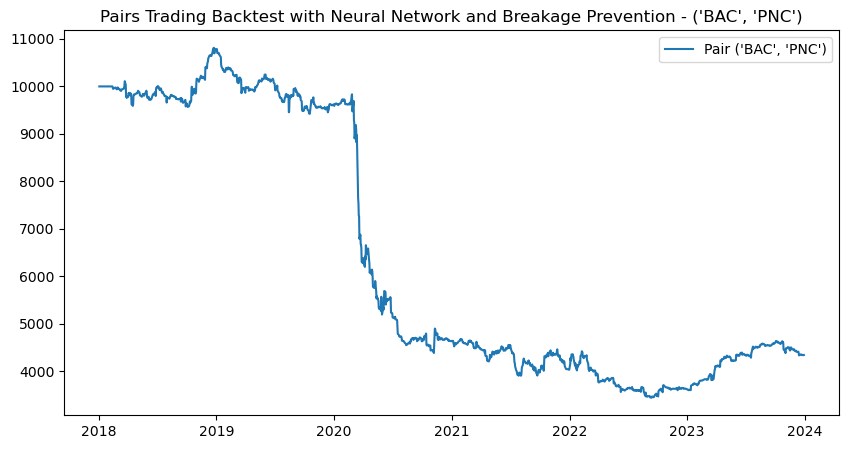

Performance for pair ('BAC', 'PNC'):
Cumulative Return: -13.00%
Sharpe Ratio: -0.81
Sortino Ratio: -0.07
Max Drawdown: -68.14%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step


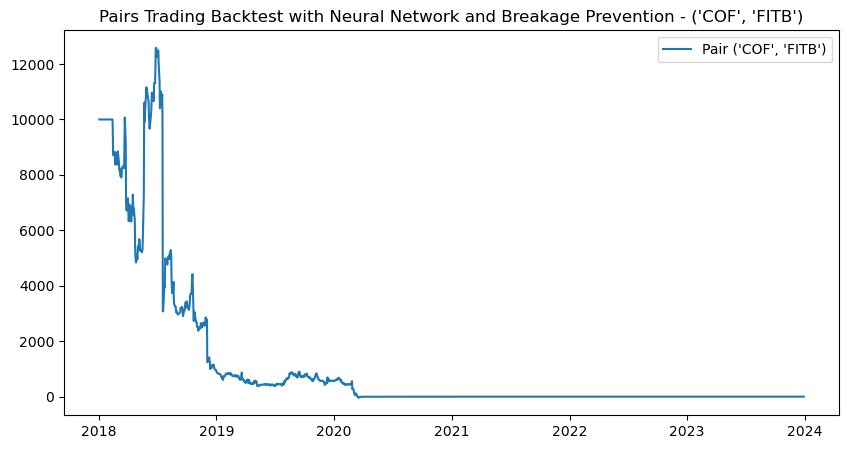

Performance for pair ('COF', 'FITB'):
Cumulative Return: -96.48%
Sharpe Ratio: -0.70
Sortino Ratio: -0.06
Max Drawdown: -100.32%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step


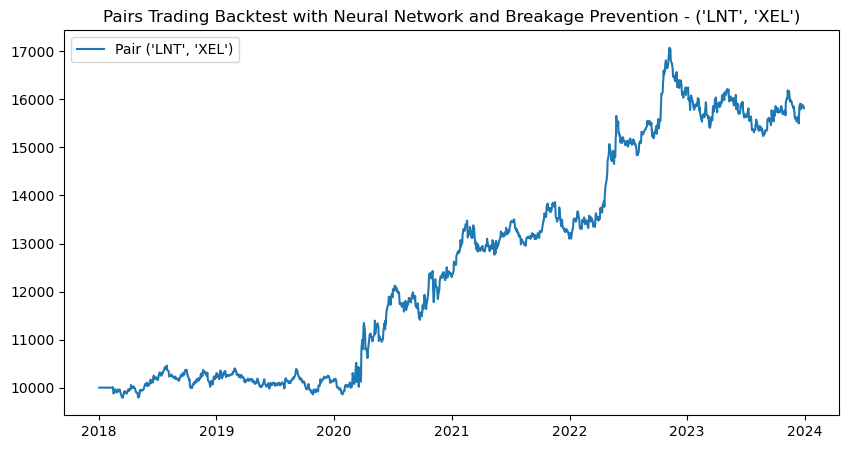

Performance for pair ('LNT', 'XEL'):
Cumulative Return: 7.97%
Sharpe Ratio: 0.85
Sortino Ratio: 0.08
Max Drawdown: -10.77%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step


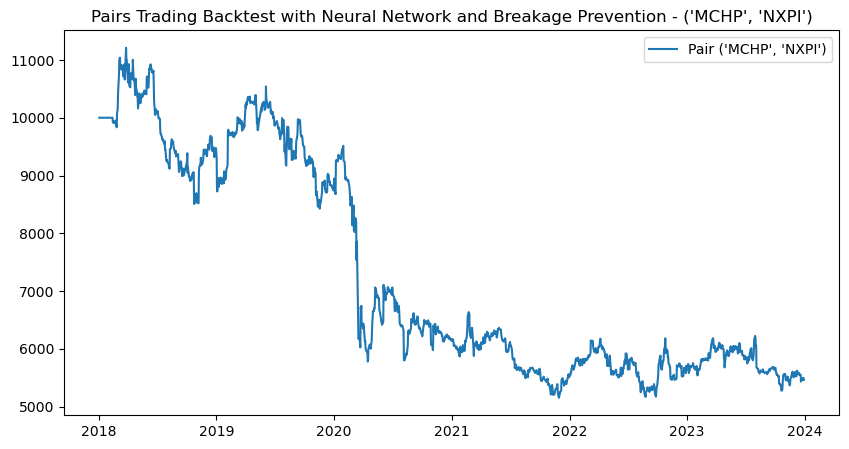

Performance for pair ('MCHP', 'NXPI'):
Cumulative Return: -9.61%
Sharpe Ratio: -0.38
Sortino Ratio: -0.03
Max Drawdown: -54.05%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 449us/step


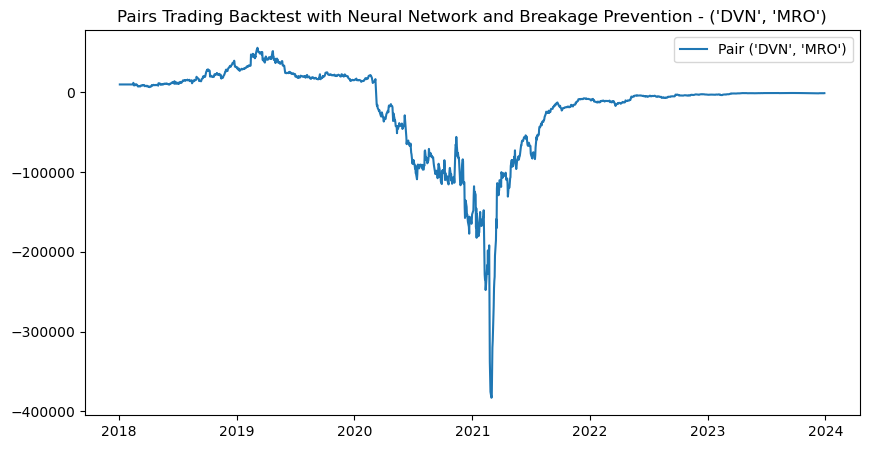

Performance for pair ('DVN', 'MRO'):
Cumulative Return: nan%
Sharpe Ratio: 0.18
Sortino Ratio: 0.02
Max Drawdown: -783.86%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 615us/step


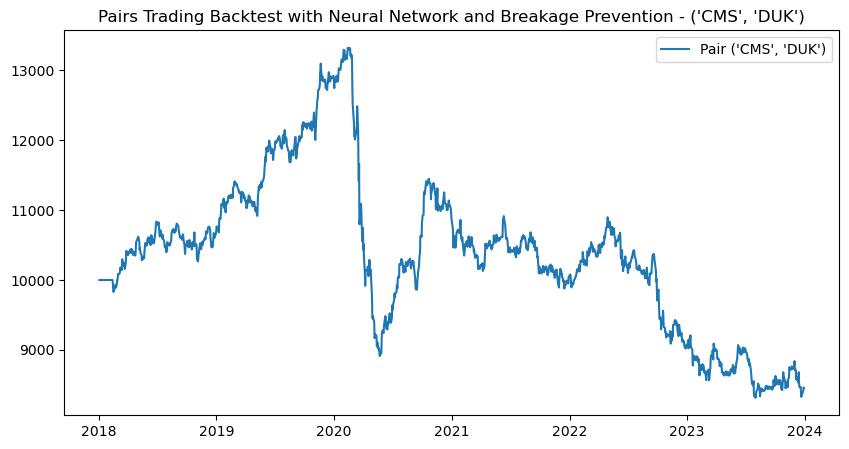

Performance for pair ('CMS', 'DUK'):
Cumulative Return: -2.76%
Sharpe Ratio: -0.20
Sortino Ratio: -0.02
Max Drawdown: -37.57%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step


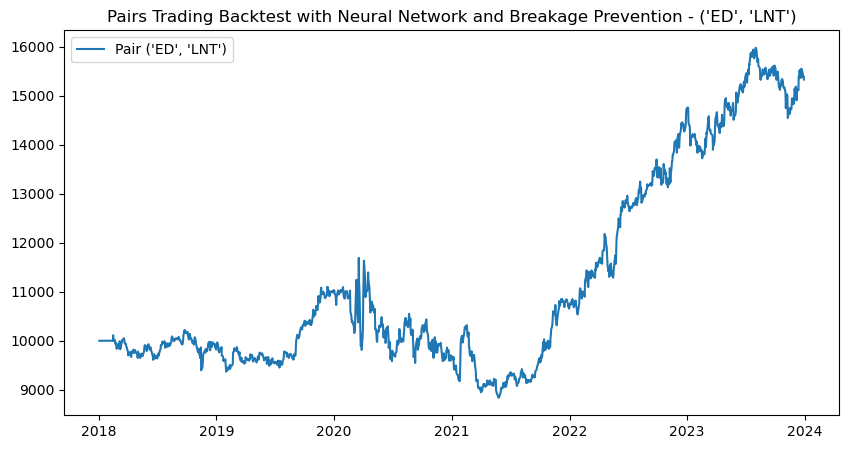

Performance for pair ('ED', 'LNT'):
Cumulative Return: 7.40%
Sharpe Ratio: 0.56
Sortino Ratio: 0.05
Max Drawdown: -24.42%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step


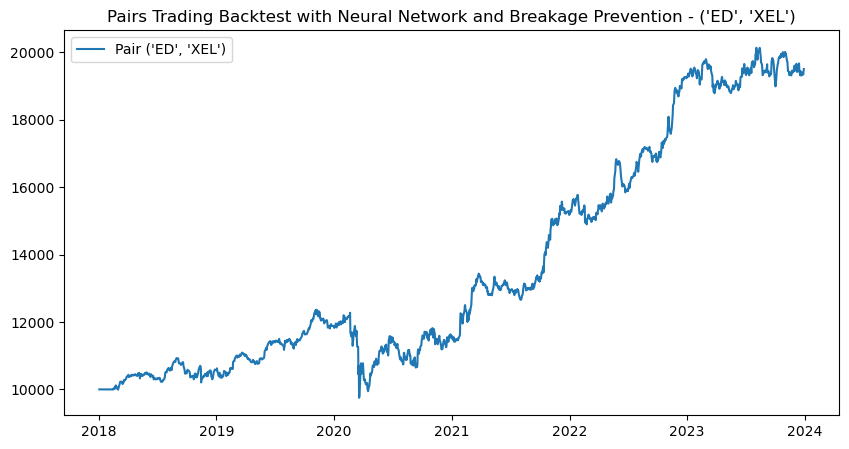

Performance for pair ('ED', 'XEL'):
Cumulative Return: 11.81%
Sharpe Ratio: 1.01
Sortino Ratio: 0.09
Max Drawdown: -21.13%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step


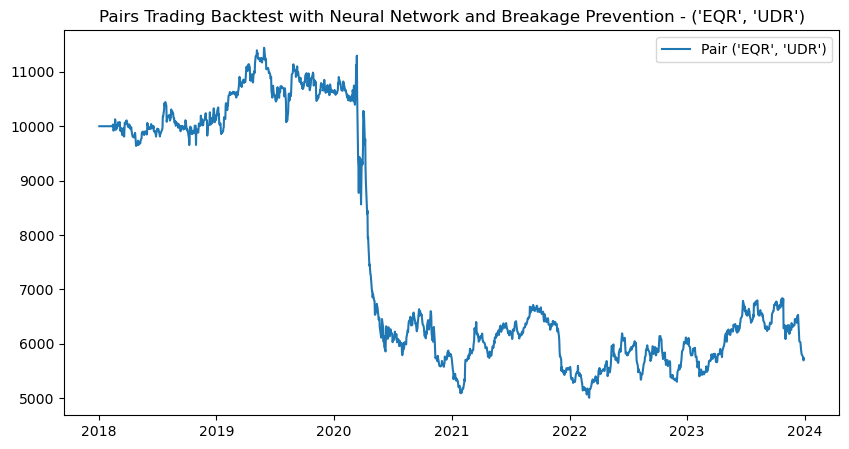

Performance for pair ('EQR', 'UDR'):
Cumulative Return: -8.88%
Sharpe Ratio: -0.37
Sortino Ratio: -0.03
Max Drawdown: -56.26%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step


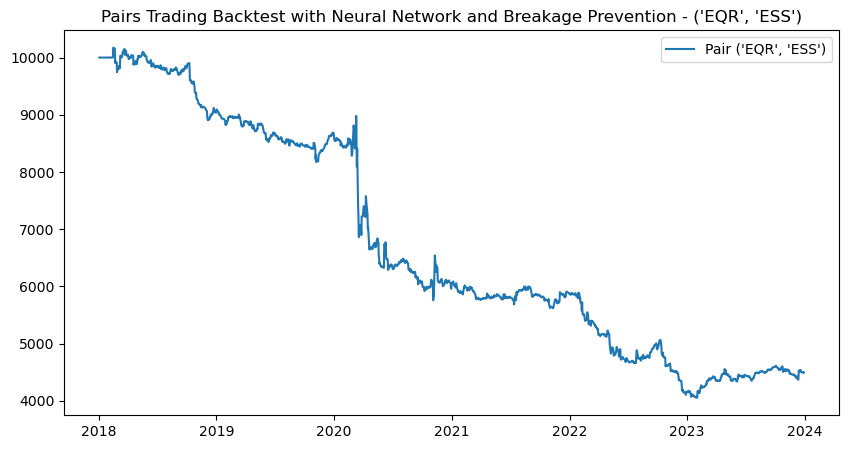

Performance for pair ('EQR', 'ESS'):
Cumulative Return: -12.51%
Sharpe Ratio: -0.90
Sortino Ratio: -0.08
Max Drawdown: -60.15%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step


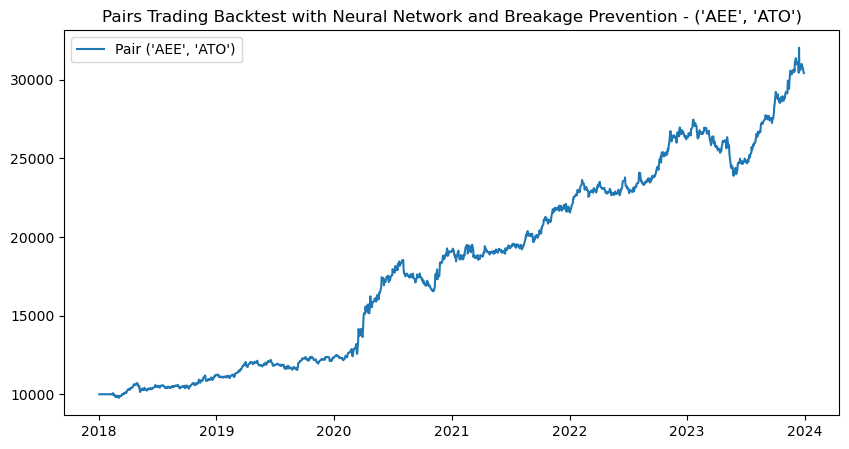

Performance for pair ('AEE', 'ATO'):
Cumulative Return: 20.43%
Sharpe Ratio: 1.54
Sortino Ratio: 0.16
Max Drawdown: -13.02%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 453us/step


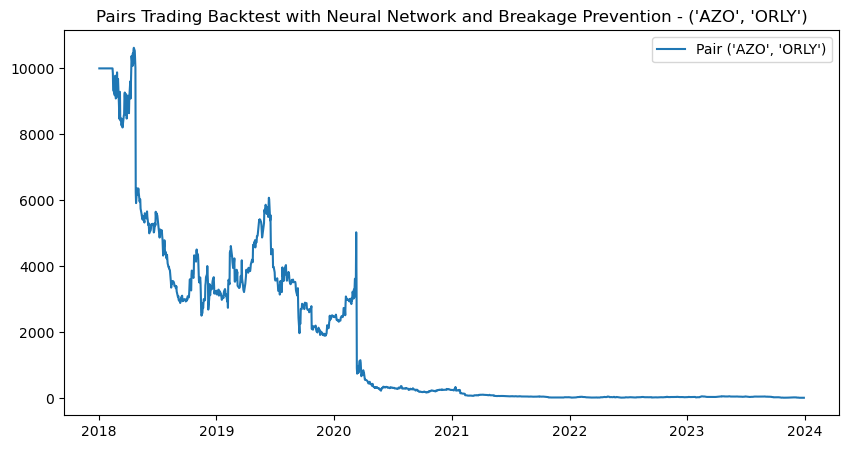

Performance for pair ('AZO', 'ORLY'):
Cumulative Return: -65.50%
Sharpe Ratio: -0.44
Sortino Ratio: -0.04
Max Drawdown: -99.84%


In [24]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import tensorflow as tf

# Function to get stock data
def get_stock_data(tickers, start_date, end_date):
    data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']
    return data

# Function to generate features for neural network
def generate_features(stock1, stock2, window=30):
    spread = stock1 - stock2 
    features = pd.DataFrame(index=spread.index)
    features['spread'] = spread
    features['zscore'] = (spread - spread.rolling(window).mean()) / spread.rolling(window).std()
    features['spread_change'] = spread.diff()
    features = features.dropna()
    return features

# Function to calculate hedge ratio using linear regression
def calculate_hedge_ratio(stock1, stock2):
    model = LinearRegression()
    model.fit(stock2.values.reshape(-1, 1), stock1.values)
    hedge_ratio = model.coef_[0]
    return hedge_ratio

# Function to train neural network model
def train_nn_model(features, train_start, train_end):
    scaler = StandardScaler()
    X = scaler.fit_transform(features[['spread', 'zscore', 'spread_change']])
    y = np.sign(features['spread_change'].shift(-1)).dropna()
    X = X[:-1]  # Ensure X and y have the same length

    train_mask = (features.index[:-1] >= train_start) & (features.index[:-1] <= train_end)
    X_train, y_train = X[train_mask], y[train_mask]

    model = Sequential()
    model.add(Dense(64, input_dim=X.shape[1], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))

    model.compile(loss='mse', optimizer='adam')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)
    
    return model, scaler

# Function to generate trading signals using the trained neural network model
def generate_signals(model, scaler, features):
    X = scaler.transform(features[['spread', 'zscore', 'spread_change']])
    predictions = model.predict(X)
    signals = pd.DataFrame(index=features.index)
    signals['signal'] = predictions
    signals['long'] = (signals['signal'] > 0).astype(int)
    signals['short'] = (signals['signal'] < 0).astype(int)
    return signals

# Function to calculate PnL and cumulative PnL using signals and hedge ratio
def calculate_pnl(data, signals, hedge_ratio):
    returns = data.pct_change().dropna()
    positions = pd.DataFrame(index=signals.index).fillna(0.0)

    # Apply the signals to calculate the long and short positions
    positions[data.columns[0]] = signals['long'] - signals['short'] * hedge_ratio
    positions[data.columns[1]] = -positions[data.columns[0]] * hedge_ratio

    # Calculate the returns based on the positions
    pnl = positions.shift(1) * returns
    pnl['total'] = pnl.sum(axis=1)

    # Calculate the cumulative PnL
    cumulative_pnl = (1 + pnl['total']).cumprod()

    return pnl['total'], cumulative_pnl

# Performance metrics calculation functions
def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = np.prod(returns + 1)
    return cum_ret_final ** (1 / num_years) - 1

def Sharpe(returns, risk_free=0):
    adj_returns = returns - risk_free
    return (np.nanmean(adj_returns) * np.sqrt(252)) / np.nanstd(adj_returns, ddof=1)

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, None, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def max_drawdown(returns):
    wealth_index = 1000 * (1 + returns).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdown = (wealth_index - previous_peaks) / previous_peaks
    return drawdown.min()

# Simplified function to calculate performance metrics
def calculate_performance_metrics(cumulative_pnl, returns):
    cumulative_return = annual_returns(returns) * 100
    sharpe_ratio = Sharpe(returns)
    sortino_ratio = sortino(returns)
    max_drawdown_value = max_drawdown(returns) * 100

    return cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value

# Fetch stock data for all pairs
# pair_df = pd.DataFrame([['ETR', 'NI'], ['DUK', 'ED']], columns=['Stock1', 'Stock2'])

start_date = '2018-01-01'
end_date = '2023-12-31'
all_stock_data = {}
for index, row in pair_df.iterrows():
    pair = [row['Stock1'], row['Stock2']]
    data = get_stock_data(pair, start_date, end_date)
    all_stock_data[tuple(pair)] = data

# Define training and testing periods
train_start = '2018-01-01'
train_end = '2022-12-31'
test_start = '2023-01-01'
test_end = '2023-12-31'

# Loop through each pair and backtest using Neural Network with pair breakage prevention
results = {}
performance_metrics = {}

for pair, data in all_stock_data.items():
    stock1, stock2 = data[pair[0]], data[pair[1]]
    features = generate_features(stock1, stock2)
    if features.empty:
        continue
    hedge_ratio = calculate_hedge_ratio(stock1, stock2)
    model, scaler = train_nn_model(features, train_start, train_end)
    signals = generate_signals(model, scaler, features)
    if signals.empty:
        continue
    total_pnl, cumulative_pnl = calculate_pnl(data, signals, hedge_ratio)
    results[pair] = cumulative_pnl
    performance_metrics[pair] = calculate_performance_metrics(cumulative_pnl, total_pnl)

    # Plot the results
    initial_capital = 10000  # Set the initial capital
    cumulative_pnl_dollars = cumulative_pnl * initial_capital

    plt.figure(figsize=(10, 5))
    plt.plot(cumulative_pnl_dollars, label=f"Pair {pair}")
    plt.title(f"Pairs Trading Backtest with Neural Network and Breakage Prevention - {pair}")
    plt.legend()
    plt.show()

    # Print performance metrics
    cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value = performance_metrics[pair]
    print(f"Performance for pair {pair}:")
    print(f"Cumulative Return: {cumulative_return:.2f}%")
    print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Sortino Ratio: {sortino_ratio:.2f}")
    print(f"Max Drawdown: {max_drawdown_value:.2f}%")

[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%*******

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step


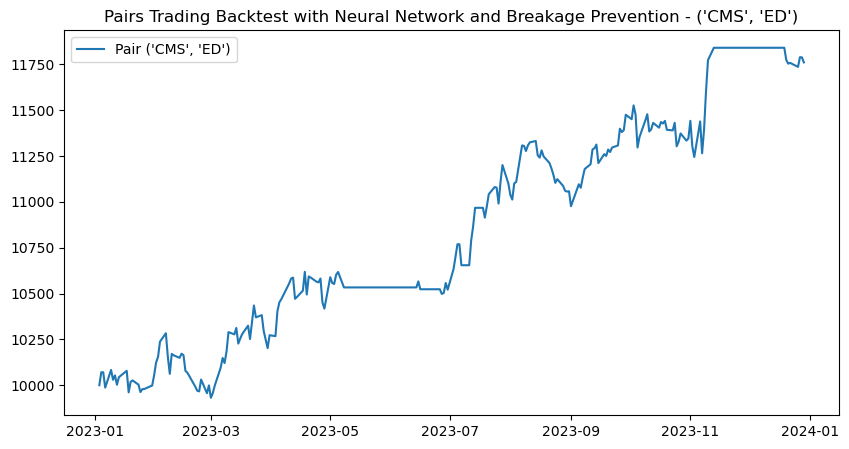

Performance for pair ('CMS', 'ED'):
Cumulative Return: 17.76%
Sharpe Ratio: 1.88
Sortino Ratio: 0.19
Max Drawdown: -3.42%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step


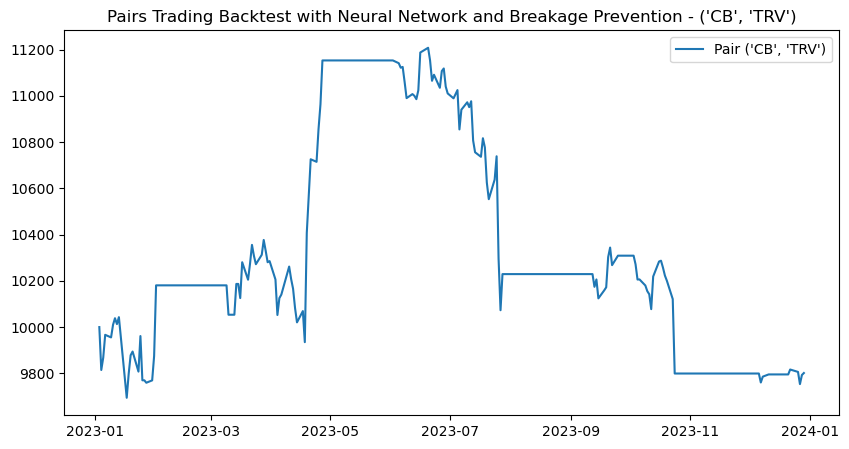

Performance for pair ('CB', 'TRV'):
Cumulative Return: -2.00%
Sharpe Ratio: -0.11
Sortino Ratio: -0.01
Max Drawdown: -12.98%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step


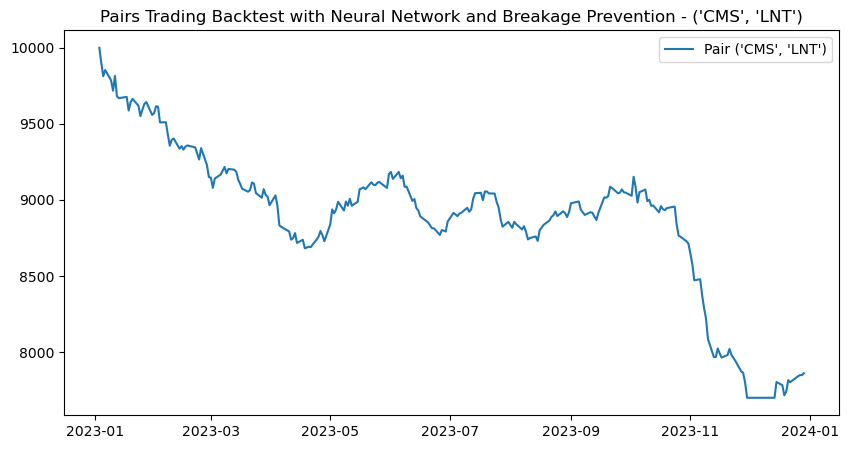

Performance for pair ('CMS', 'LNT'):
Cumulative Return: -21.54%
Sharpe Ratio: -2.80
Sortino Ratio: -0.22
Max Drawdown: -22.74%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 530us/step


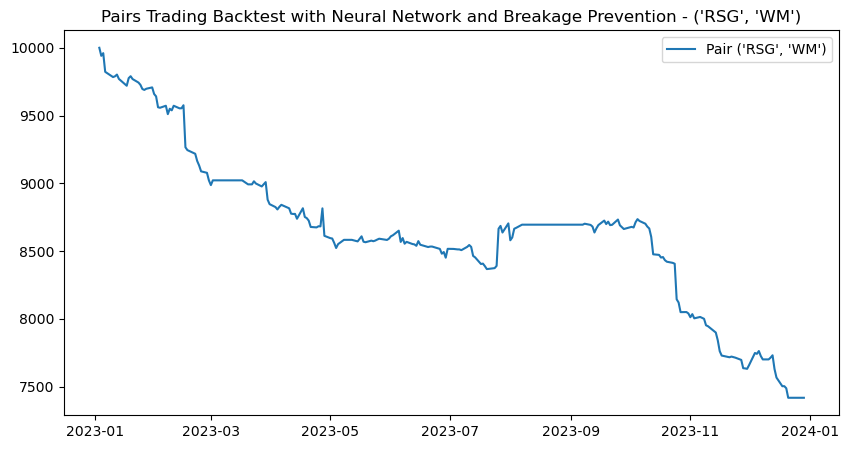

Performance for pair ('RSG', 'WM'):
Cumulative Return: -25.99%
Sharpe Ratio: -3.52
Sortino Ratio: -0.26
Max Drawdown: -25.57%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step


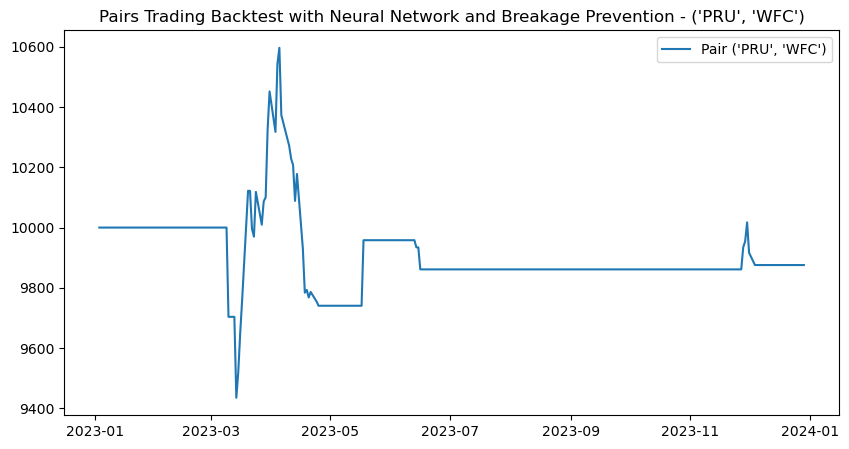

Performance for pair ('PRU', 'WFC'):
Cumulative Return: -1.25%
Sharpe Ratio: -0.10
Sortino Ratio: -0.01
Max Drawdown: -8.08%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 612us/step


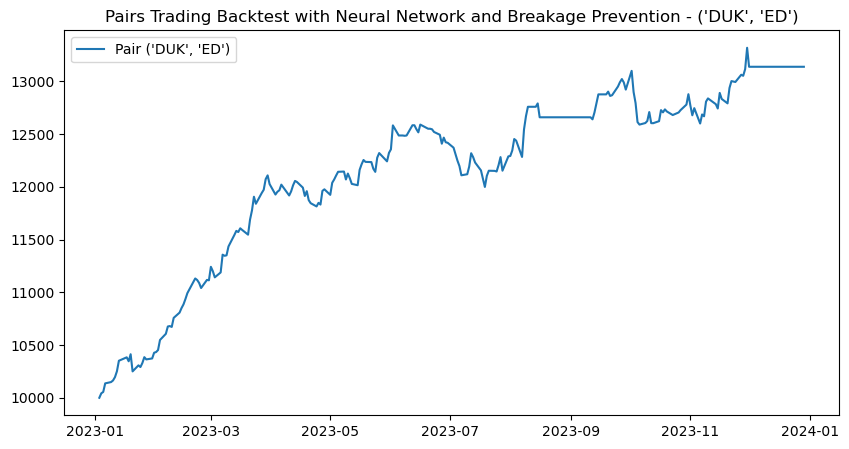

Performance for pair ('DUK', 'ED'):
Cumulative Return: 31.67%
Sharpe Ratio: 3.08
Sortino Ratio: 0.33
Max Drawdown: -4.70%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step


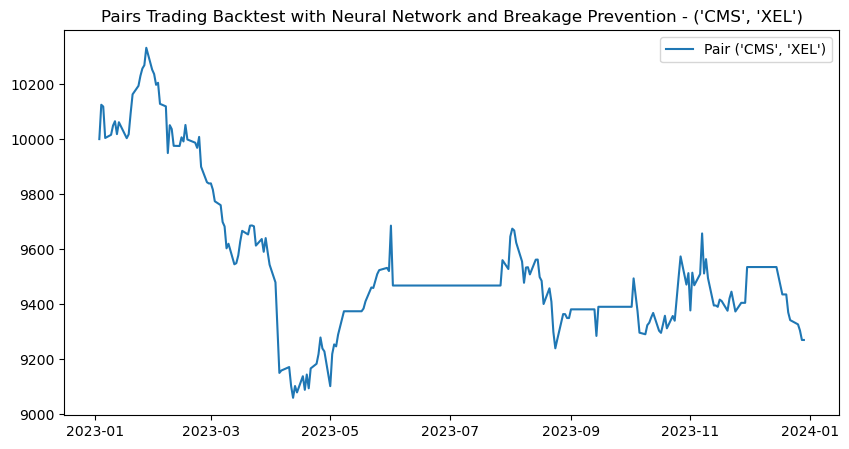

Performance for pair ('CMS', 'XEL'):
Cumulative Return: -7.35%
Sharpe Ratio: -0.83
Sortino Ratio: -0.07
Max Drawdown: -12.31%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 520us/step


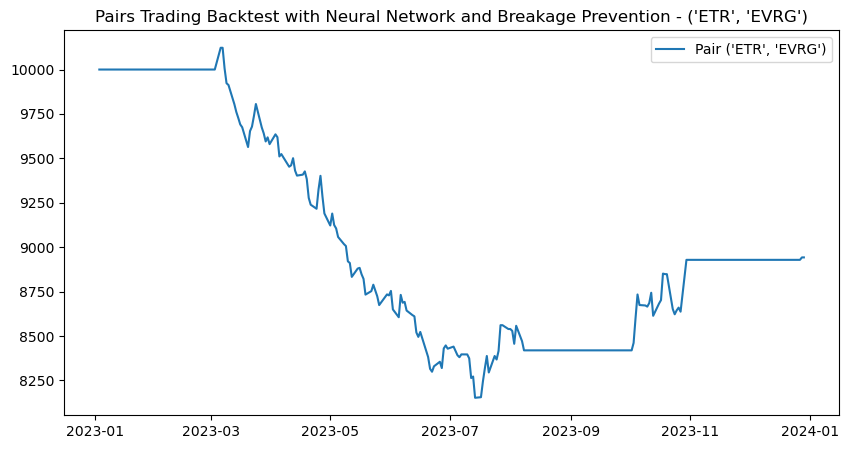

Performance for pair ('ETR', 'EVRG'):
Cumulative Return: -10.66%
Sharpe Ratio: -1.18
Sortino Ratio: -0.11
Max Drawdown: -19.47%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 498us/step


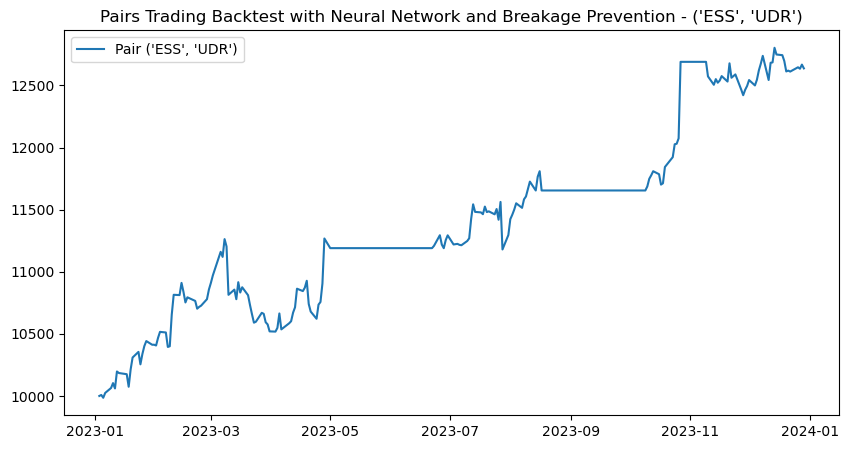

Performance for pair ('ESS', 'UDR'):
Cumulative Return: 26.61%
Sharpe Ratio: 2.09
Sortino Ratio: 0.22
Max Drawdown: -6.61%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step


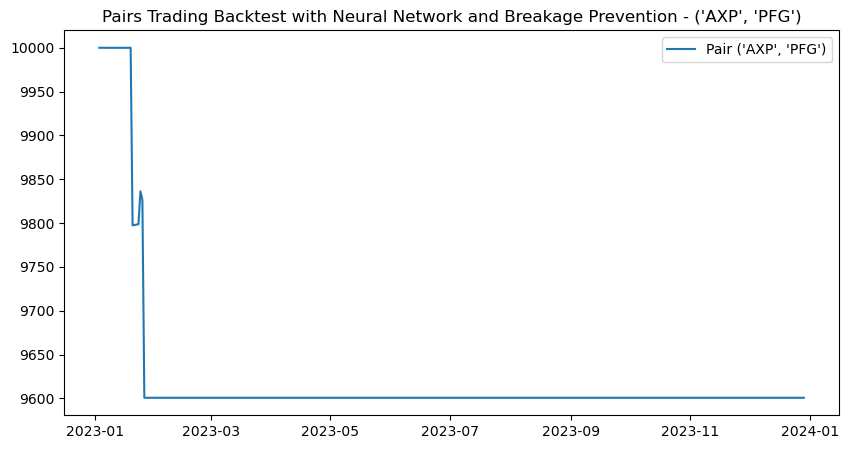

Performance for pair ('AXP', 'PFG'):
Cumulative Return: -4.02%
Sharpe Ratio: -1.31
Sortino Ratio: -0.08
Max Drawdown: -3.99%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 575us/step


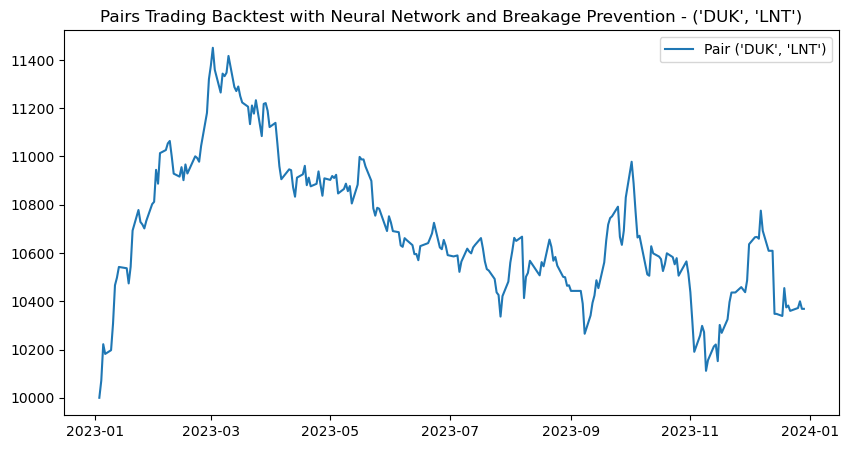

Performance for pair ('DUK', 'LNT'):
Cumulative Return: 3.72%
Sharpe Ratio: 0.42
Sortino Ratio: 0.04
Max Drawdown: -11.69%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 506us/step


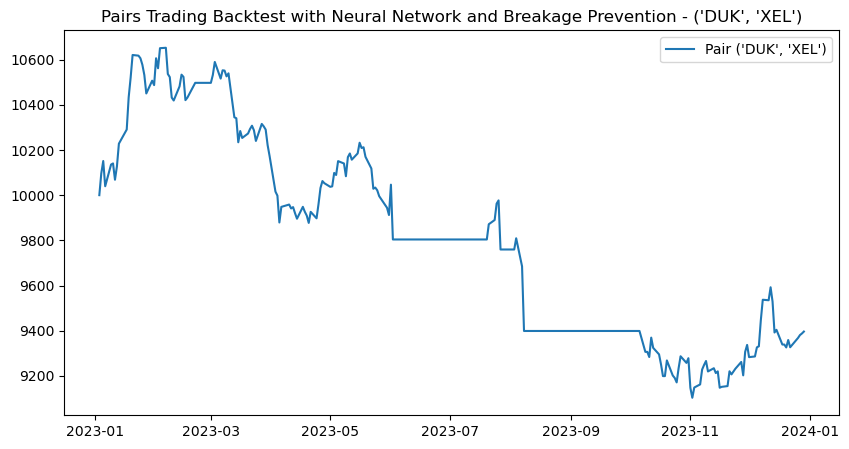

Performance for pair ('DUK', 'XEL'):
Cumulative Return: -6.09%
Sharpe Ratio: -0.67
Sortino Ratio: -0.05
Max Drawdown: -14.55%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 558us/step


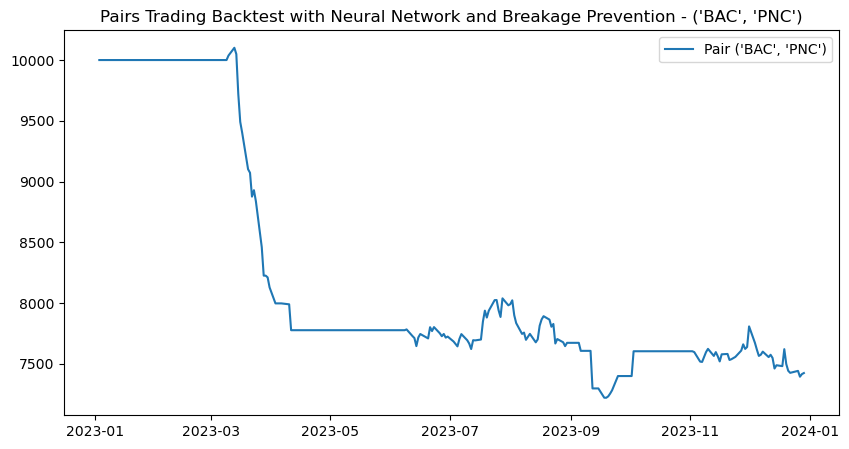

Performance for pair ('BAC', 'PNC'):
Cumulative Return: -25.94%
Sharpe Ratio: -2.33
Sortino Ratio: -0.17
Max Drawdown: -28.52%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step


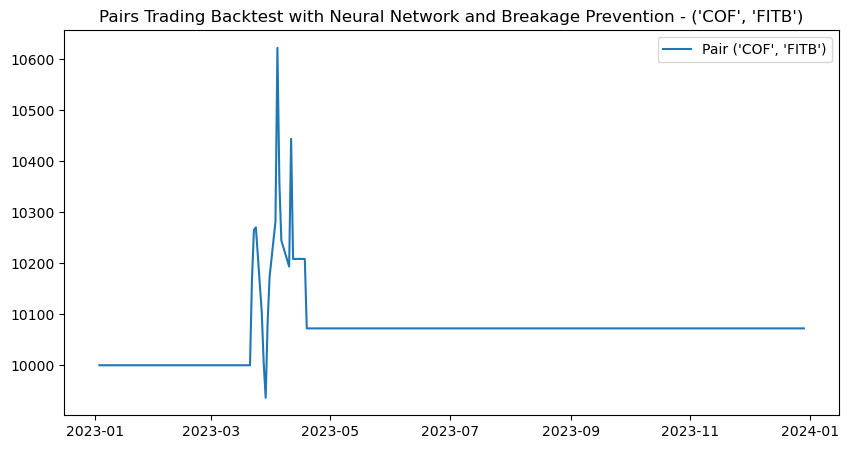

Performance for pair ('COF', 'FITB'):
Cumulative Return: 0.73%
Sharpe Ratio: 0.14
Sortino Ratio: 0.01
Max Drawdown: -5.18%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 461us/step


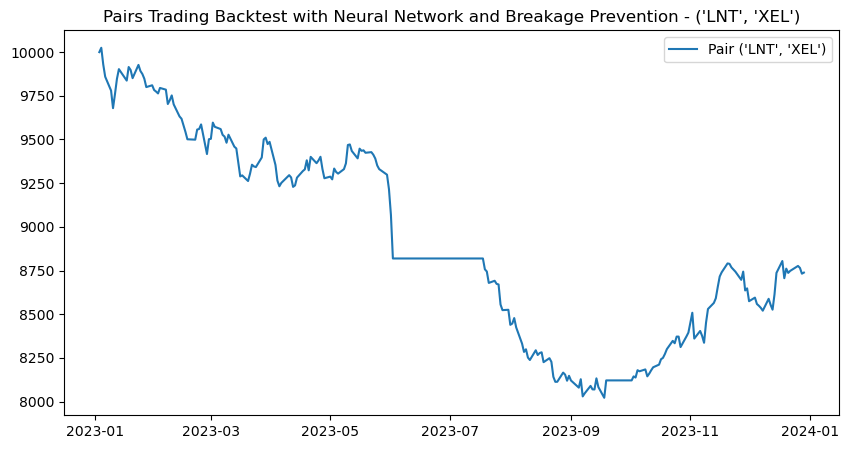

Performance for pair ('LNT', 'XEL'):
Cumulative Return: -12.71%
Sharpe Ratio: -1.50
Sortino Ratio: -0.12
Max Drawdown: -20.06%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step


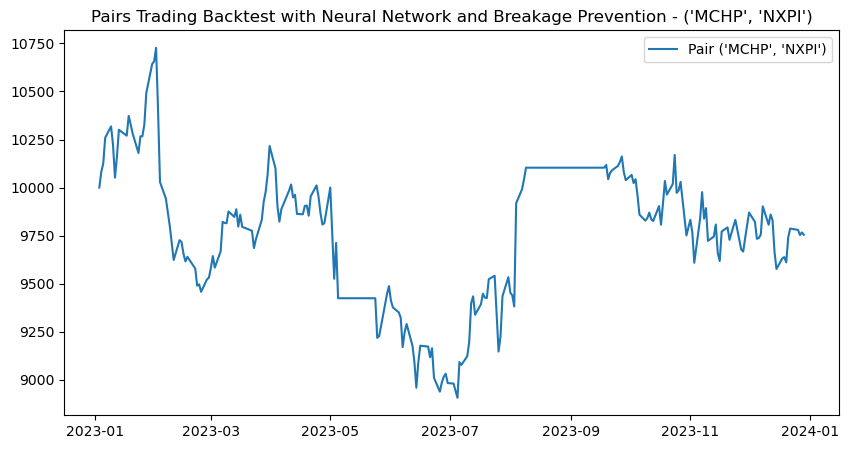

Performance for pair ('MCHP', 'NXPI'):
Cumulative Return: -2.48%
Sharpe Ratio: -0.08
Sortino Ratio: -0.01
Max Drawdown: -16.98%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step


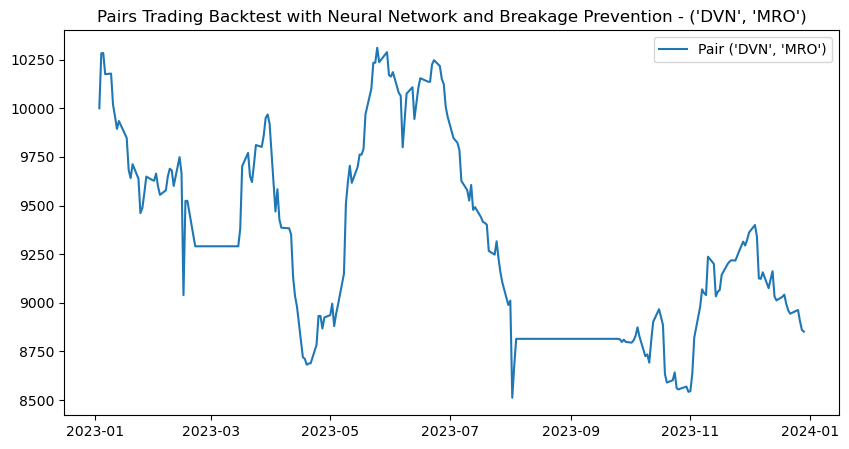

Performance for pair ('DVN', 'MRO'):
Cumulative Return: -11.58%
Sharpe Ratio: -0.60
Sortino Ratio: -0.05
Max Drawdown: -17.45%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 541us/step


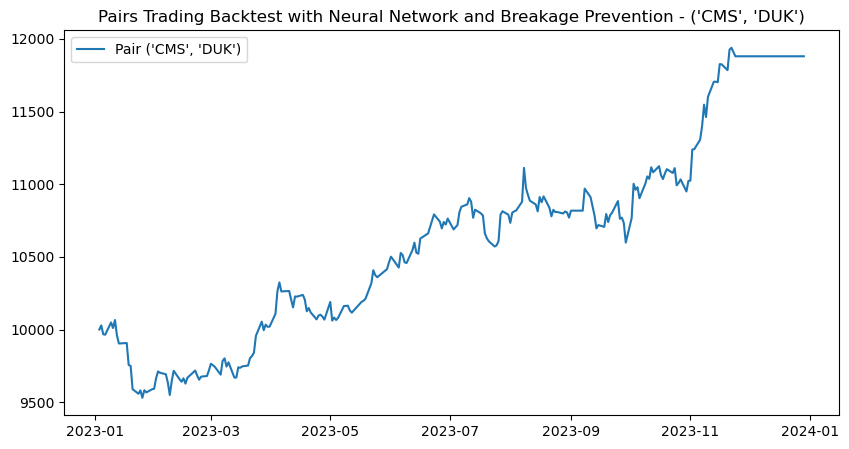

Performance for pair ('CMS', 'DUK'):
Cumulative Return: 18.97%
Sharpe Ratio: 1.88
Sortino Ratio: 0.20
Max Drawdown: -5.32%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 495us/step


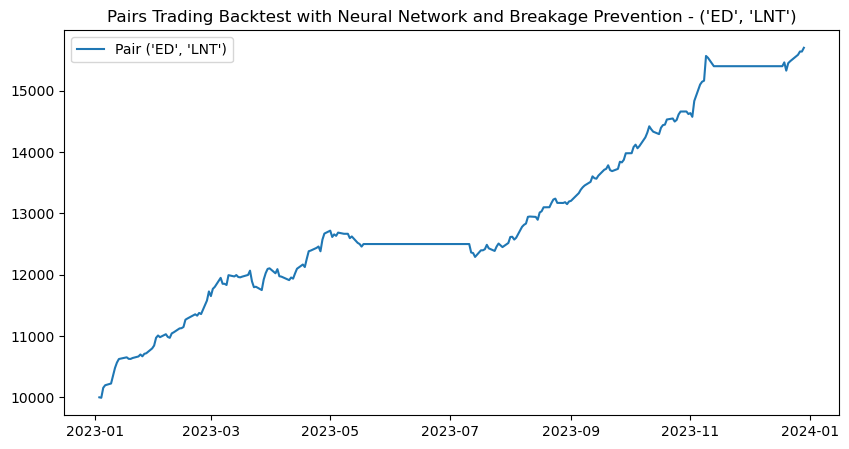

Performance for pair ('ED', 'LNT'):
Cumulative Return: 57.57%
Sharpe Ratio: 5.47
Sortino Ratio: 0.77
Max Drawdown: -3.37%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step


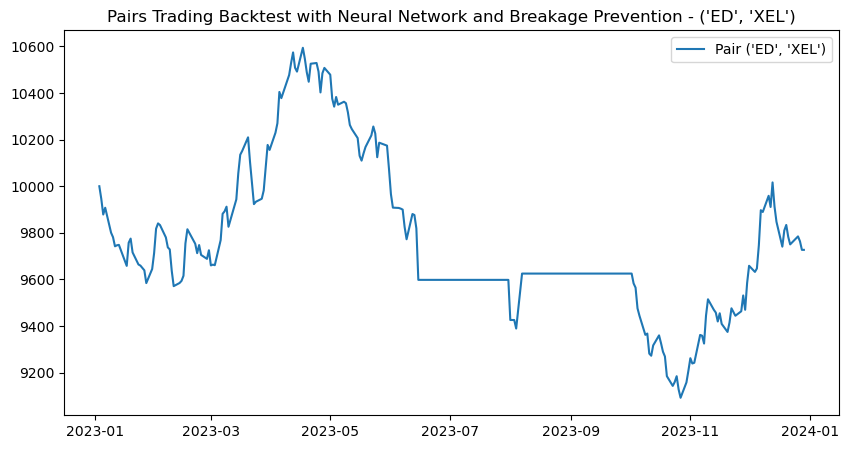

Performance for pair ('ED', 'XEL'):
Cumulative Return: -2.75%
Sharpe Ratio: -0.26
Sortino Ratio: -0.02
Max Drawdown: -14.17%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step


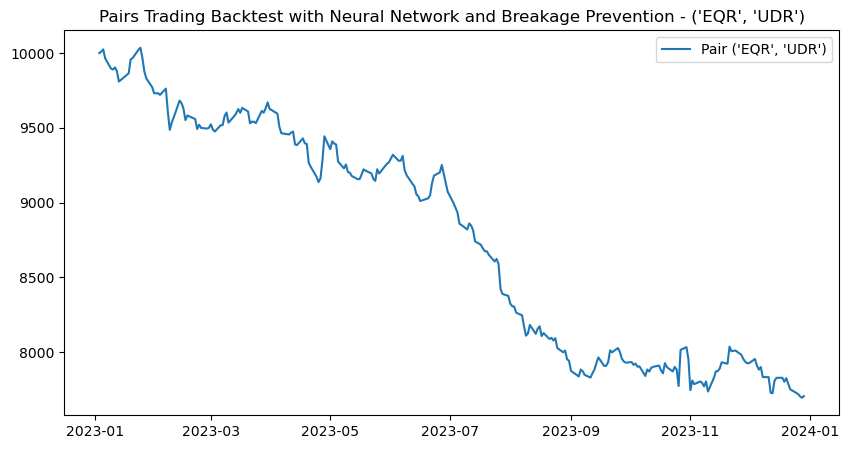

Performance for pair ('EQR', 'UDR'):
Cumulative Return: -23.10%
Sharpe Ratio: -2.77
Sortino Ratio: -0.22
Max Drawdown: -23.32%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 445us/step


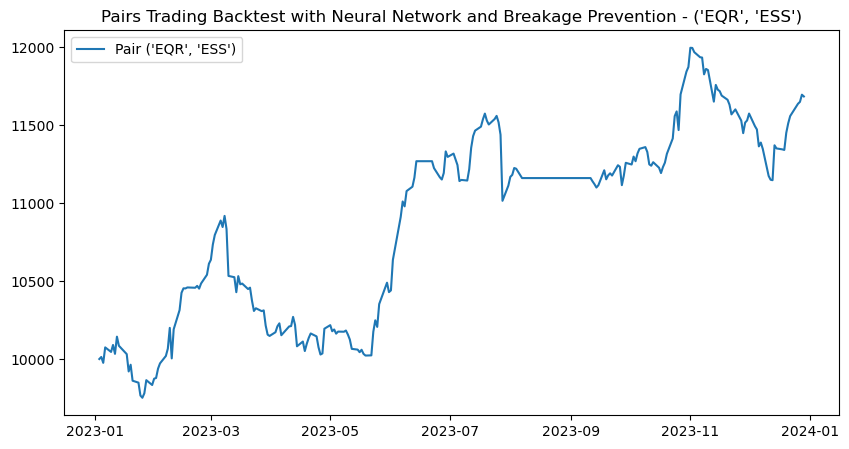

Performance for pair ('EQR', 'ESS'):
Cumulative Return: 17.00%
Sharpe Ratio: 1.50
Sortino Ratio: 0.14
Max Drawdown: -8.21%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 470us/step


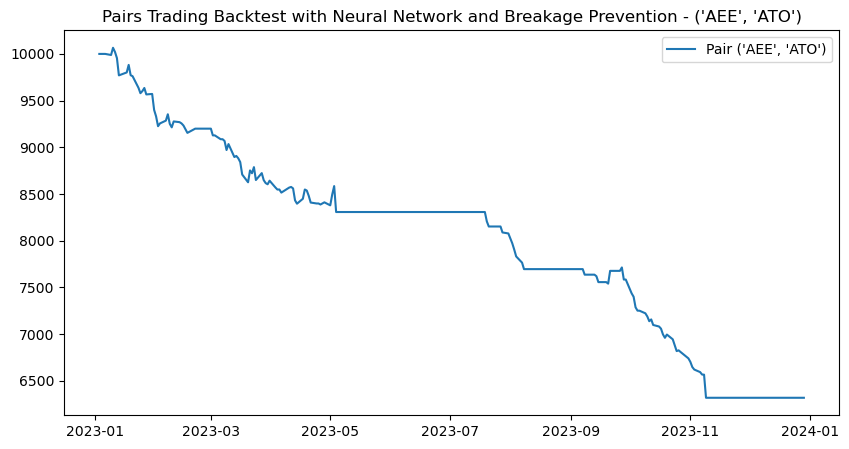

Performance for pair ('AEE', 'ATO'):
Cumulative Return: -37.04%
Sharpe Ratio: -4.86
Sortino Ratio: -0.32
Max Drawdown: -37.22%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step


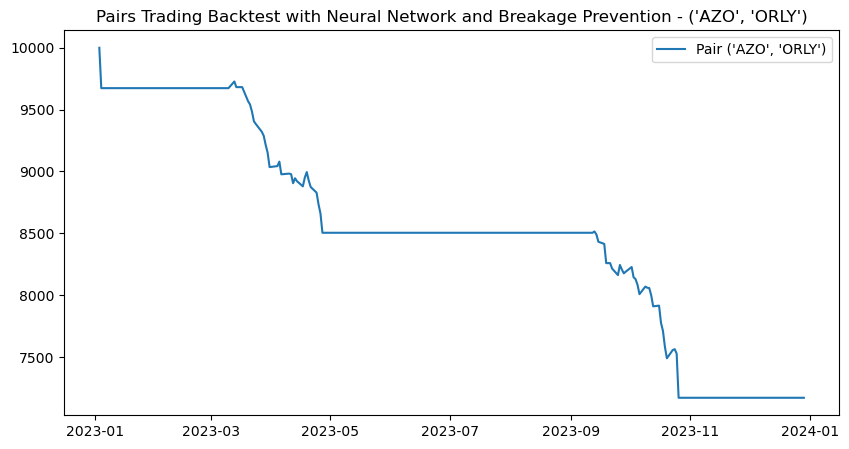

Performance for pair ('AZO', 'ORLY'):
Cumulative Return: -28.48%
Sharpe Ratio: -4.24
Sortino Ratio: -0.27
Max Drawdown: -27.55%


In [18]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import tensorflow as tf

# Function to get stock data
def get_stock_data(tickers, start_date, end_date):
    data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']
    return data

# Function to generate features for neural network
def generate_features(stock1, stock2, window=30):
    spread = stock1 - stock2 
    features = pd.DataFrame(index=spread.index)
    features['spread'] = spread
    features['zscore'] = (spread - spread.rolling(window).mean()) / spread.rolling(window).std()
    features['spread_change'] = spread.diff()
    features = features.dropna()
    return features

# Function to train neural network model
def train_nn_model(features, train_start, train_end):
    scaler = StandardScaler()
    X = scaler.fit_transform(features[['spread', 'zscore', 'spread_change']])
    y = np.sign(features['spread_change'].shift(-1)).dropna()
    X = X[:-1]  # Ensure X and y have the same length

    train_mask = (features.index[:-1] >= train_start) & (features.index[:-1] <= train_end)
    X_train, y_train = X[train_mask], y[train_mask]

    model = Sequential()
    model.add(Dense(64, input_dim=X.shape[1], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))

    model.compile(loss='mse', optimizer='adam')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)
    
    return model, scaler

# Function to generate trading signals using the trained neural network model
def generate_signals(model, scaler, features):
    X = scaler.transform(features[['spread', 'zscore', 'spread_change']])
    predictions = model.predict(X) 
    signals = pd.DataFrame(index=features.index)
    signals['signal'] = predictions
    signals['long'] = (signals['signal'] > 0).astype(int)
    signals['short'] = (signals['signal'] < 0).astype(int)
    return signals

# Function to backtest pairs with breakage prevention
def backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end, correlation_threshold=0.8, window=30, initial_capital=10000):
    positions = pd.DataFrame(index=signals.index).fillna(0.0)
    positions[stock1.name] = signals['long'] - signals['short']
    positions[stock2.name] = -positions[stock1.name]

    stock1_returns = stock1.pct_change().fillna(0)
    stock2_returns = stock2.pct_change().fillna(0)

    portfolio = pd.DataFrame(index=positions.index)
    portfolio['stock1'] = positions[stock1.name] * stock1_returns
    portfolio['stock2'] = positions[stock2.name] * stock2_returns
    portfolio['total'] = portfolio['stock1'] + portfolio['stock2']

    portfolio['returns'] = portfolio['total']

    rolling_corr = stock1_returns.rolling(window=window).corr(stock2_returns)

    portfolio['exit'] = (rolling_corr < correlation_threshold).astype(int).shift(1).fillna(0)
    portfolio.loc[portfolio['exit'] == 1, 'returns'] = 0

    test_mask = (portfolio.index >= test_start) & (portfolio.index <= test_end)
    test_portfolio = portfolio[test_mask].copy()

    # Reset cumulative returns for the test period
    test_portfolio['cumulative'] = (test_portfolio['returns'] + 1).cumprod()
    test_portfolio['cumulative'] = test_portfolio['cumulative'] * initial_capital
    test_portfolio.iloc[0, test_portfolio.columns.get_loc('cumulative')] = initial_capital

    return test_portfolio

# Performance metrics calculation functions
def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = np.prod(returns + 1)
    return cum_ret_final ** (1 / num_years) - 1

def Sharpe(returns, risk_free=0):
    adj_returns = returns - risk_free
    return (np.nanmean(adj_returns) * np.sqrt(252)) / np.nanstd(adj_returns, ddof=1)

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, None, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def max_drawdown(returns):
    wealth_index = 1000 * (1 + returns).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdown = (wealth_index - previous_peaks) / previous_peaks
    return drawdown.min()

# Simplified function to calculate performance metrics
def calculate_performance_metrics(cumulative_pnl, returns):
    cumulative_return = annual_returns(returns) * 100
    sharpe_ratio = Sharpe(returns)
    sortino_ratio = sortino(returns)
    max_drawdown_value = max_drawdown(returns) * 100

    return cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value

start_date = '2018-01-01'
end_date = '2023-12-31'
all_stock_data = {}
for index, row in pair_df.iterrows():
    pair = [row['Stock1'], row['Stock2']]
    data = get_stock_data(pair, start_date, end_date)
    all_stock_data[tuple(pair)] = data

# Define training and testing periods
train_start = '2018-01-01'
train_end = '2022-12-31'
test_start = '2023-01-01'
test_end = '2023-12-31'

# Loop through each pair and backtest using Neural Network with pair breakage prevention
results = {}
performance_metrics = {}

for pair, data in all_stock_data.items():
    stock1, stock2 = data[pair[0]], data[pair[1]]
    features = generate_features(stock1, stock2)
    if features.empty:
        continue
    model, scaler = train_nn_model(features, train_start, train_end)
    signals = generate_signals(model, scaler, features)
    if signals.empty:
        continue
    portfolio = backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end)
    results[pair] = portfolio
    cumulative_pnl = portfolio['cumulative']
    pnl = portfolio['returns']
    performance_metrics[pair] = calculate_performance_metrics(cumulative_pnl, pnl)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(cumulative_pnl, label=f"Pair {pair}")
    plt.title(f"Pairs Trading Backtest with Neural Network and Breakage Prevention - {pair}")
    plt.legend()
    plt.show()

    # Print performance metrics
    cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value = performance_metrics[pair]
    print(f"Performance for pair {pair}:")
    print(f"Cumulative Return: {cumulative_return:.2f}%")
    print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Sortino Ratio: {sortino_ratio:.2f}")
    print(f"Max Drawdown: {max_drawdown_value:.2f}%")

[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%*******

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step


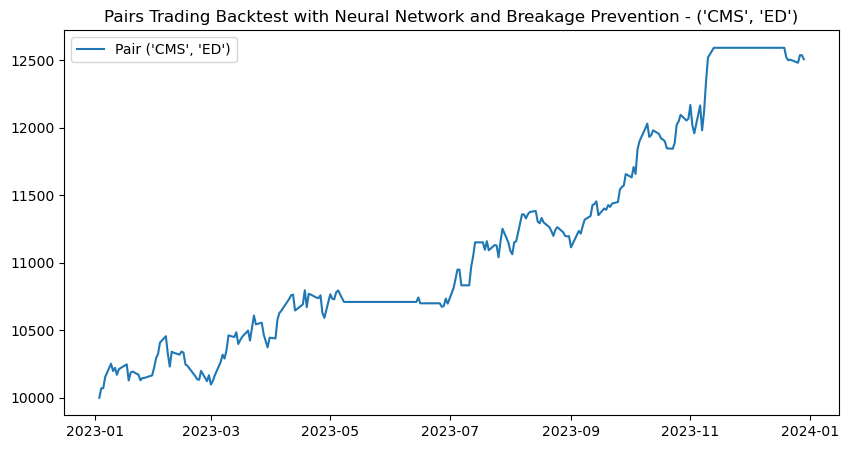

Performance for pair ('CMS', 'ED'):
Cumulative Return: 25.31%
Sharpe Ratio: 2.60
Sortino Ratio: 0.28
Max Drawdown: -3.42%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 460us/step


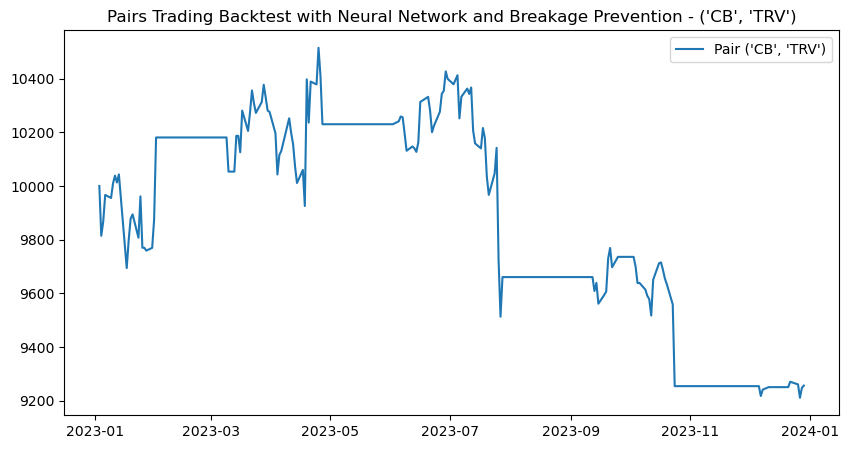

Performance for pair ('CB', 'TRV'):
Cumulative Return: -7.49%
Sharpe Ratio: -0.58
Sortino Ratio: -0.05
Max Drawdown: -12.39%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 497us/step


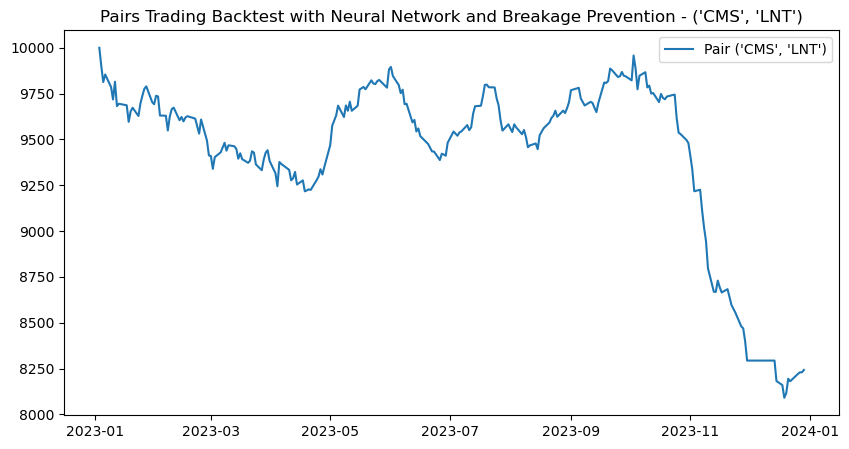

Performance for pair ('CMS', 'LNT'):
Cumulative Return: -17.70%
Sharpe Ratio: -2.22
Sortino Ratio: -0.17
Max Drawdown: -18.81%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step


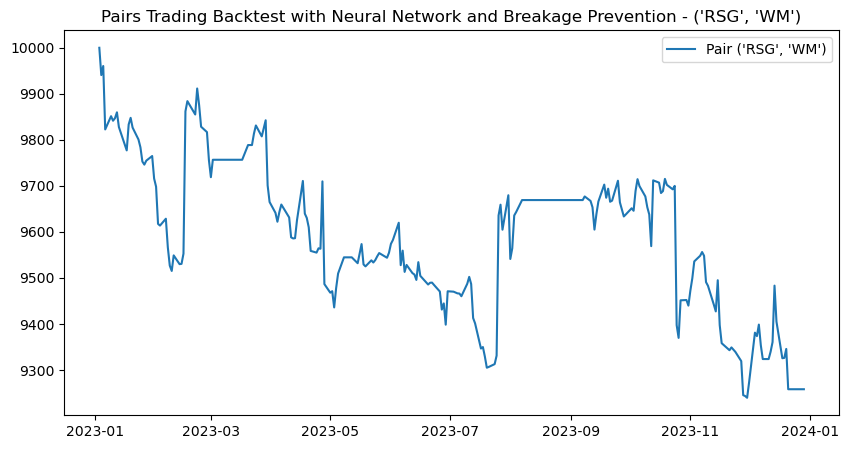

Performance for pair ('RSG', 'WM'):
Cumulative Return: -7.48%
Sharpe Ratio: -0.86
Sortino Ratio: -0.08
Max Drawdown: -7.29%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step


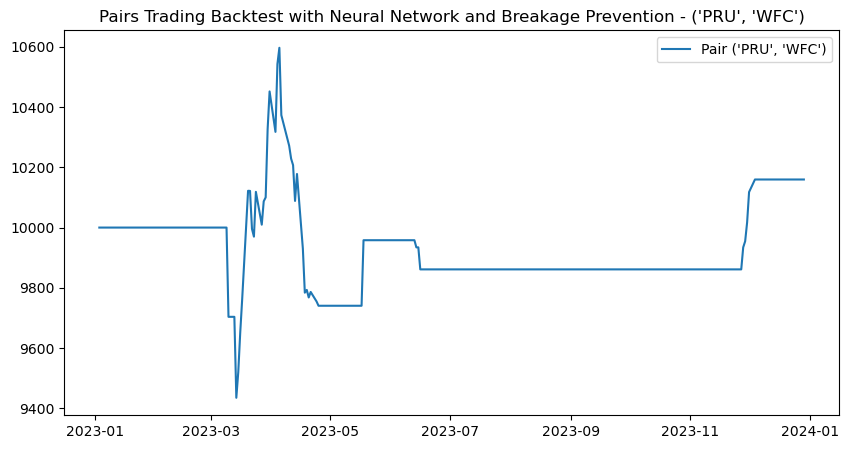

Performance for pair ('PRU', 'WFC'):
Cumulative Return: 1.61%
Sharpe Ratio: 0.23
Sortino Ratio: 0.02
Max Drawdown: -8.08%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step


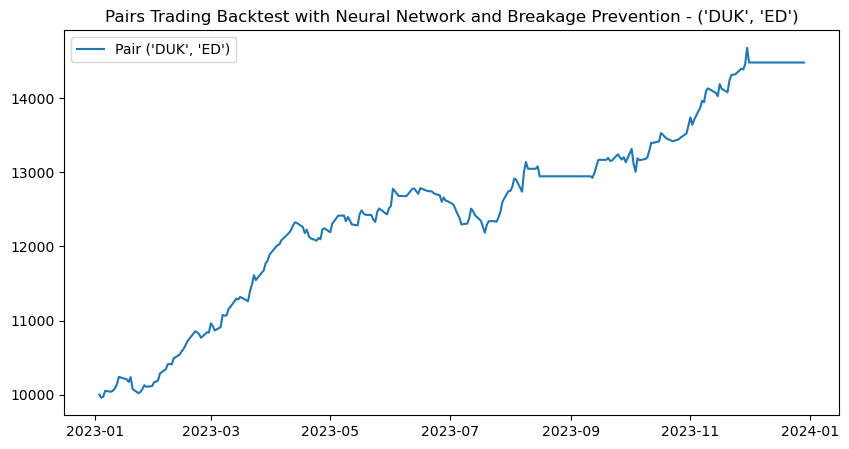

Performance for pair ('DUK', 'ED'):
Cumulative Return: 45.22%
Sharpe Ratio: 4.23
Sortino Ratio: 0.51
Max Drawdown: -4.70%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step


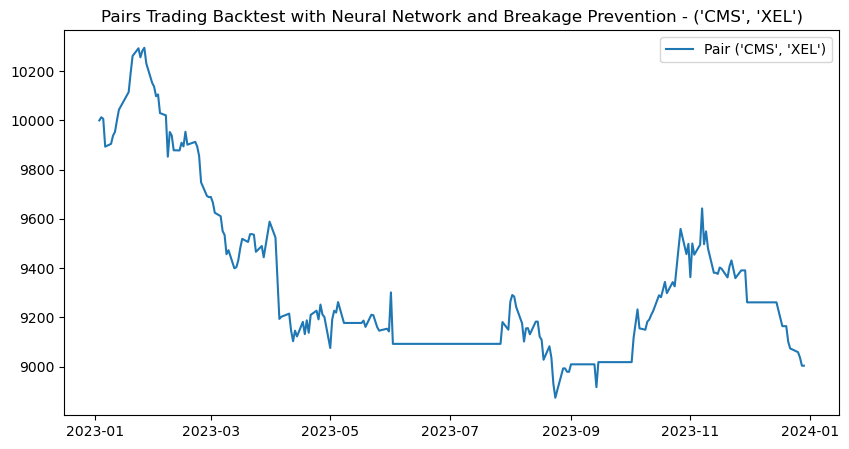

Performance for pair ('CMS', 'XEL'):
Cumulative Return: -10.04%
Sharpe Ratio: -1.16
Sortino Ratio: -0.09
Max Drawdown: -13.81%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 568us/step


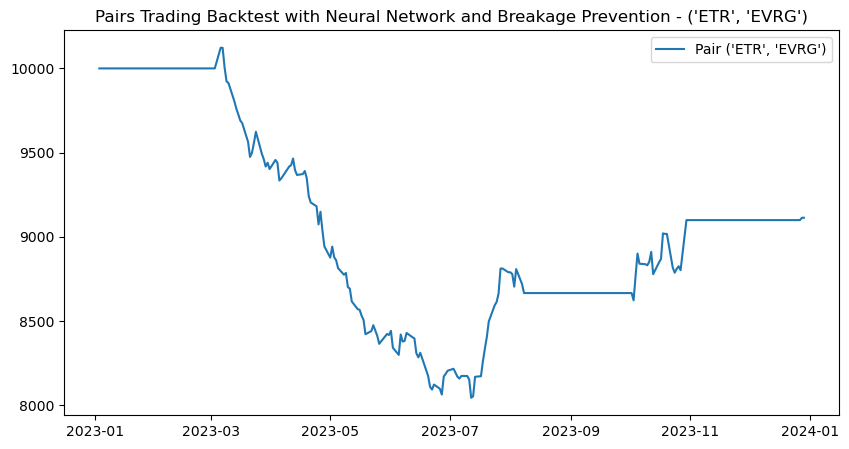

Performance for pair ('ETR', 'EVRG'):
Cumulative Return: -8.94%
Sharpe Ratio: -0.97
Sortino Ratio: -0.09
Max Drawdown: -20.54%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 571us/step


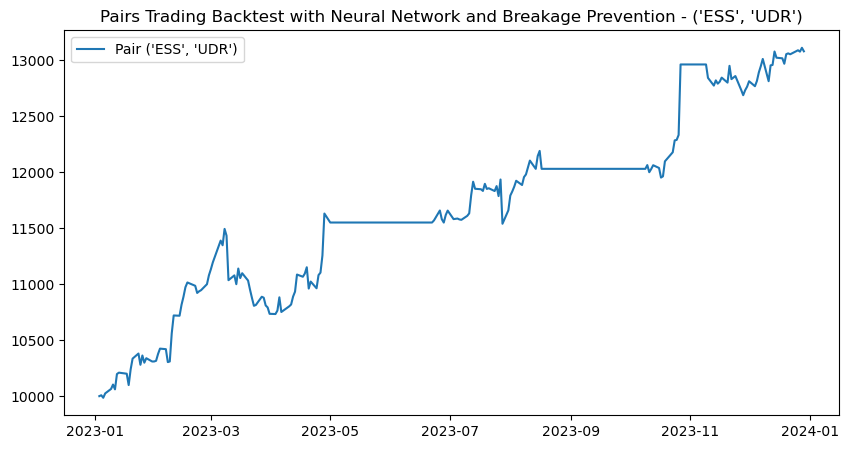

Performance for pair ('ESS', 'UDR'):
Cumulative Return: 31.06%
Sharpe Ratio: 2.39
Sortino Ratio: 0.25
Max Drawdown: -6.61%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step


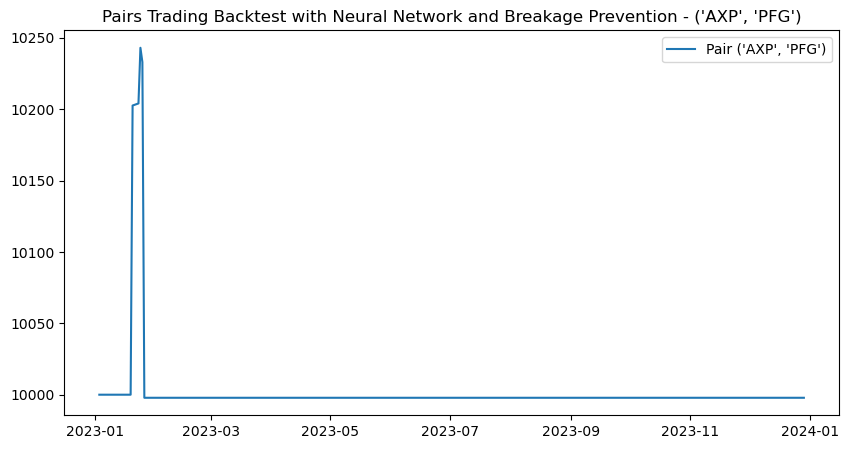

Performance for pair ('AXP', 'PFG'):
Cumulative Return: -0.02%
Sharpe Ratio: 0.01
Sortino Ratio: 0.00
Max Drawdown: -2.39%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step


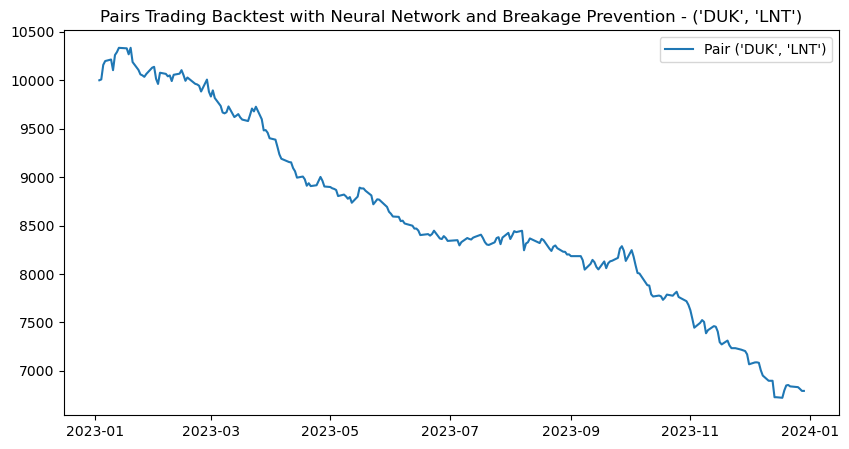

Performance for pair ('DUK', 'LNT'):
Cumulative Return: -32.28%
Sharpe Ratio: -4.01
Sortino Ratio: -0.29
Max Drawdown: -34.96%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step


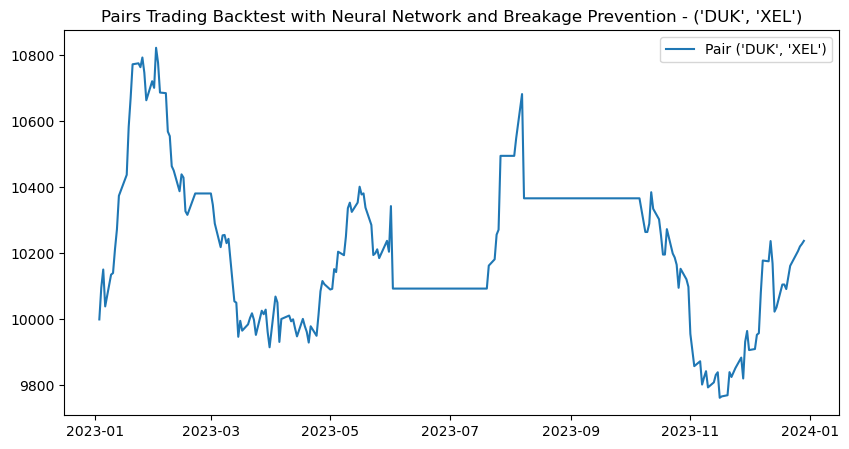

Performance for pair ('DUK', 'XEL'):
Cumulative Return: 2.40%
Sharpe Ratio: 0.31
Sortino Ratio: 0.03
Max Drawdown: -9.79%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step


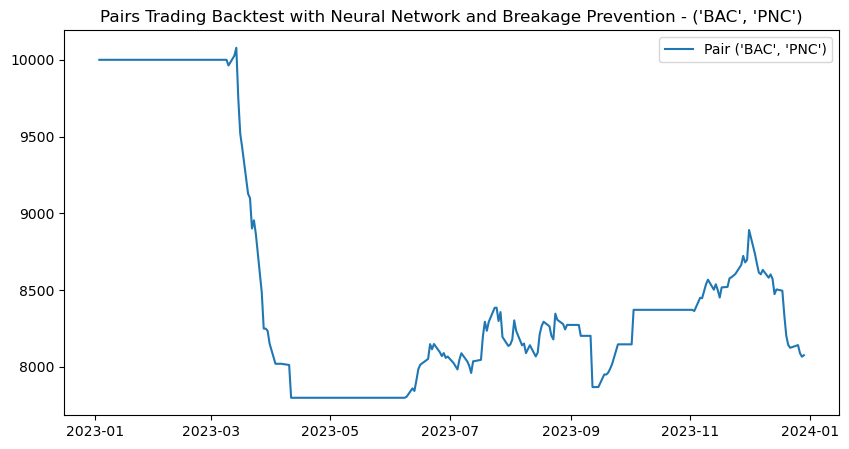

Performance for pair ('BAC', 'PNC'):
Cumulative Return: -19.38%
Sharpe Ratio: -1.64
Sortino Ratio: -0.12
Max Drawdown: -22.62%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step


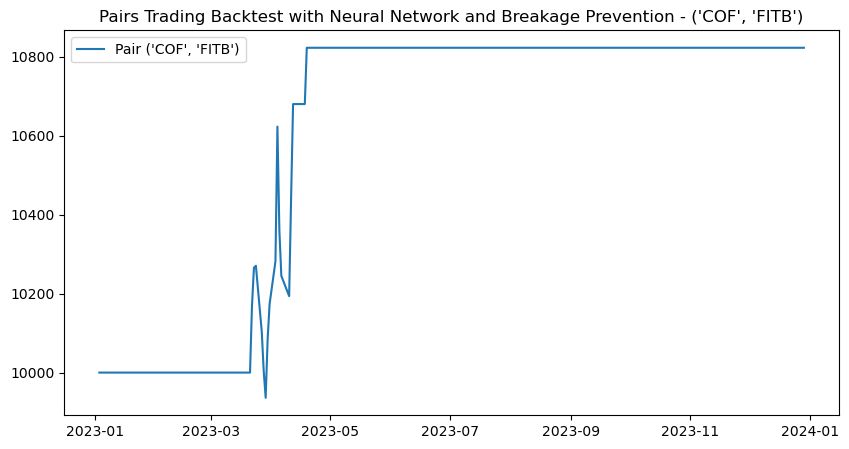

Performance for pair ('COF', 'FITB'):
Cumulative Return: 8.29%
Sharpe Ratio: 1.24
Sortino Ratio: 0.15
Max Drawdown: -4.04%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step


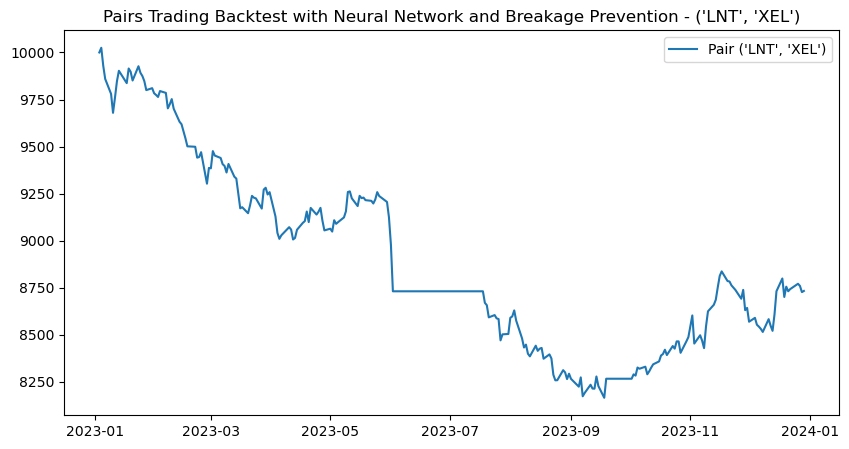

Performance for pair ('LNT', 'XEL'):
Cumulative Return: -12.77%
Sharpe Ratio: -1.50
Sortino Ratio: -0.12
Max Drawdown: -18.63%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 457us/step


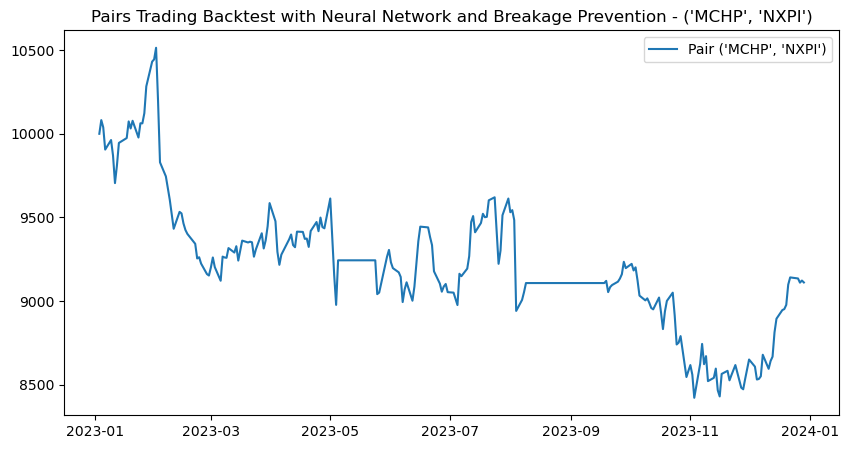

Performance for pair ('MCHP', 'NXPI'):
Cumulative Return: -8.96%
Sharpe Ratio: -0.51
Sortino Ratio: -0.04
Max Drawdown: -19.90%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step


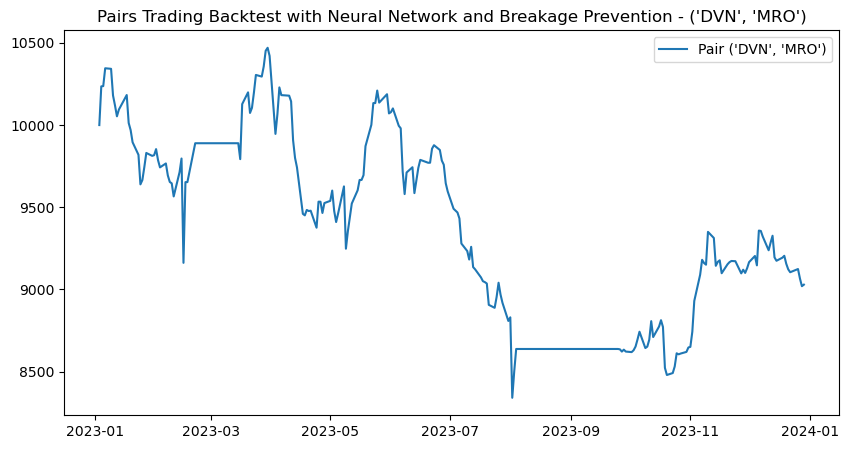

Performance for pair ('DVN', 'MRO'):
Cumulative Return: -9.79%
Sharpe Ratio: -0.48
Sortino Ratio: -0.04
Max Drawdown: -20.34%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step


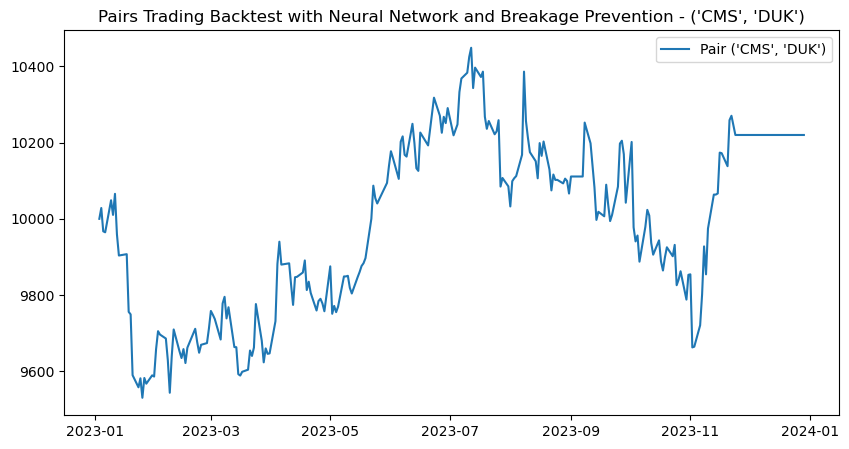

Performance for pair ('CMS', 'DUK'):
Cumulative Return: 2.22%
Sharpe Ratio: 0.28
Sortino Ratio: 0.02
Max Drawdown: -7.53%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step


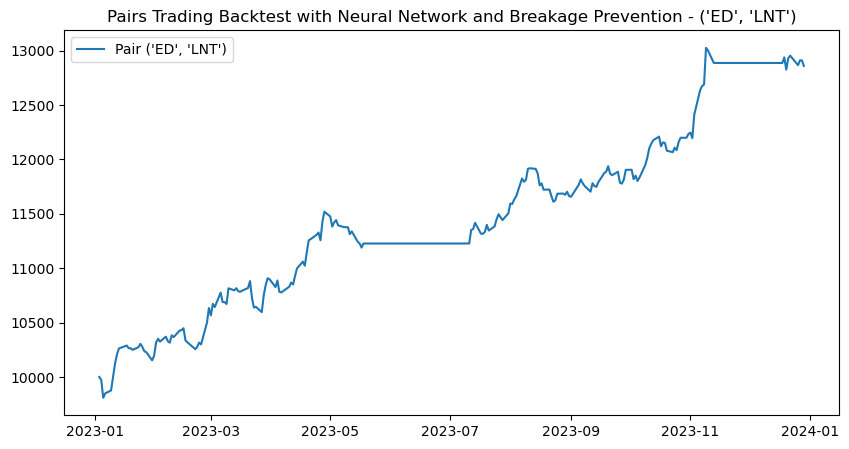

Performance for pair ('ED', 'LNT'):
Cumulative Return: 28.85%
Sharpe Ratio: 2.95
Sortino Ratio: 0.34
Max Drawdown: -2.86%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step


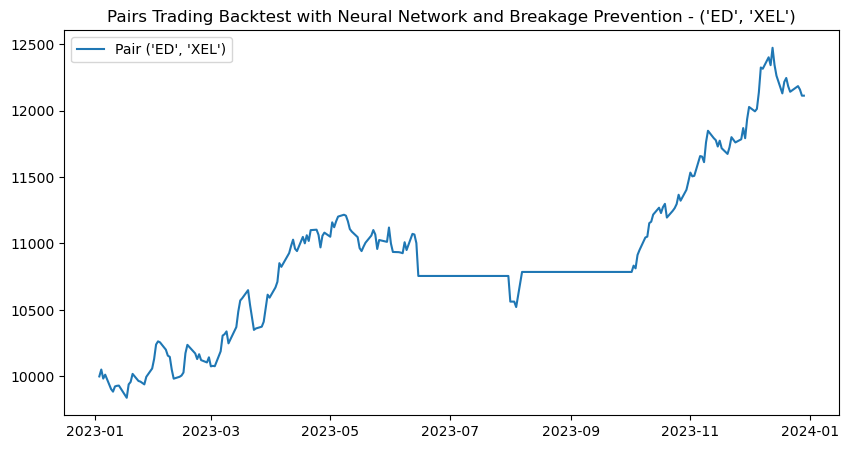

Performance for pair ('ED', 'XEL'):
Cumulative Return: 21.31%
Sharpe Ratio: 2.20
Sortino Ratio: 0.22
Max Drawdown: -6.19%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 482us/step


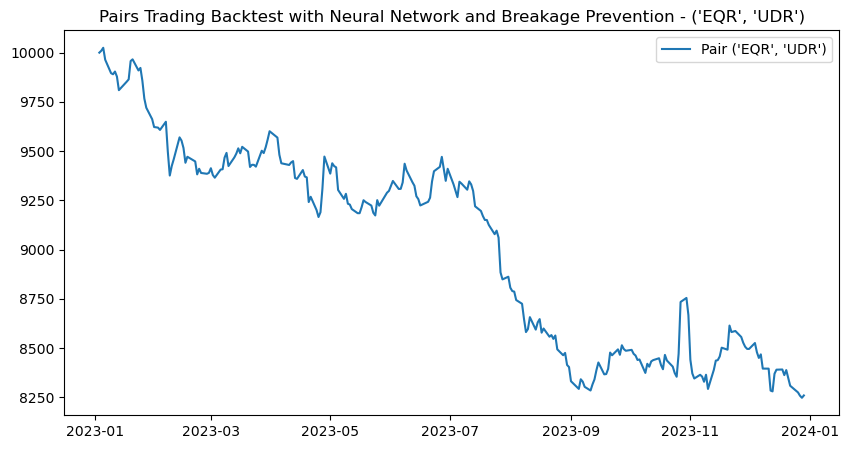

Performance for pair ('EQR', 'UDR'):
Cumulative Return: -17.52%
Sharpe Ratio: -2.01
Sortino Ratio: -0.17
Max Drawdown: -17.72%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 524us/step


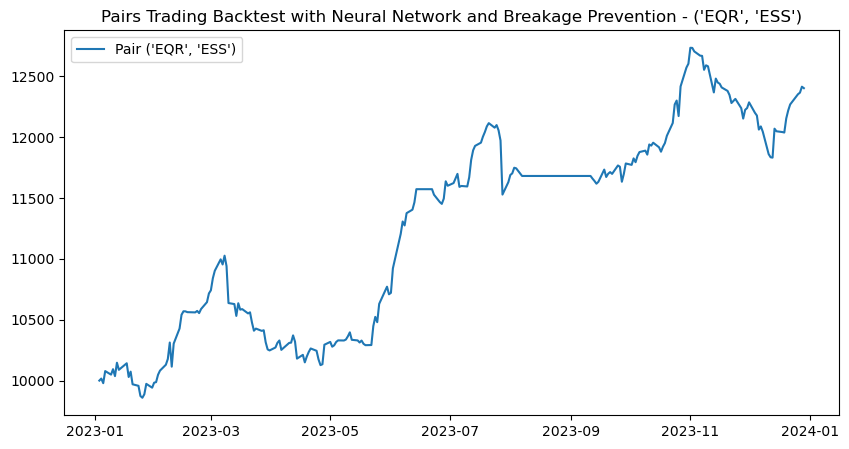

Performance for pair ('EQR', 'ESS'):
Cumulative Return: 24.23%
Sharpe Ratio: 2.06
Sortino Ratio: 0.19
Max Drawdown: -8.15%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step


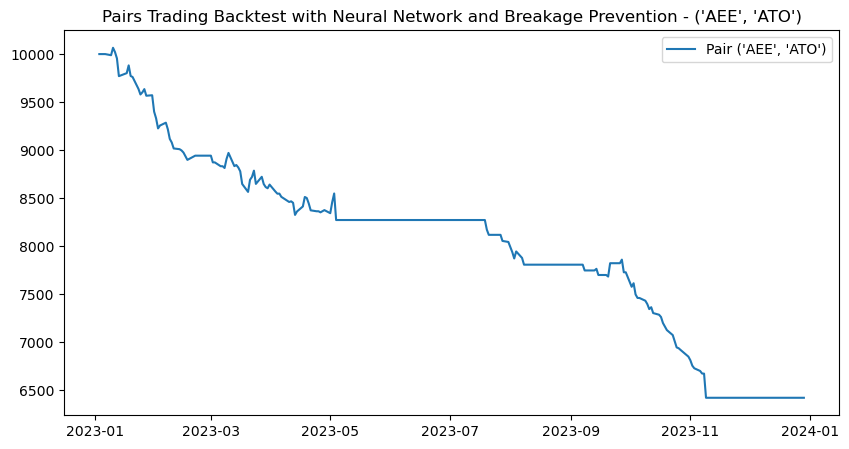

Performance for pair ('AEE', 'ATO'):
Cumulative Return: -36.01%
Sharpe Ratio: -4.67
Sortino Ratio: -0.31
Max Drawdown: -36.20%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step


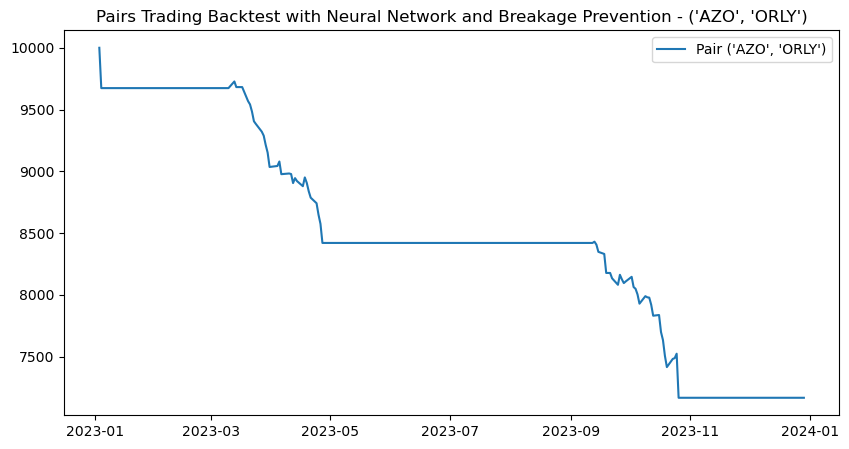

Performance for pair ('AZO', 'ORLY'):
Cumulative Return: -28.51%
Sharpe Ratio: -4.25
Sortino Ratio: -0.27
Max Drawdown: -27.57%


In [29]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import tensorflow as tf

# Function to get stock data
def get_stock_data(tickers, start_date, end_date):
    data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']
    return data

# Function to generate features for neural network
def generate_features(stock1, stock2, window=30):
    spread = stock1 - stock2
    features = pd.DataFrame(index=spread.index)
    features['spread'] = spread
    features['zscore'] = (spread - spread.rolling(window).mean()) / spread.rolling(window).std()
    features['spread_change'] = spread.diff()
    features = features.dropna()
    return features

# Function to calculate hedge ratio using linear regression
def calculate_hedge_ratio(stock1, stock2):
    model = LinearRegression()
    model.fit(stock2.values.reshape(-1, 1), stock1.values)
    hedge_ratio = model.coef_[0]
    return hedge_ratio

# Function to train neural network model
def train_nn_model(features, train_start, train_end):
    scaler = StandardScaler()
    X = scaler.fit_transform(features[['spread', 'zscore', 'spread_change']])
    y = np.sign(features['spread_change'].shift(-1)).dropna()
    X = X[:-1]  # Ensure X and y have the same length

    train_mask = (features.index[:-1] >= train_start) & (features.index[:-1] <= train_end)
    X_train, y_train = X[train_mask], y[train_mask]

    model = Sequential()
    model.add(Dense(64, input_dim=X.shape[1], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))

    model.compile(loss='mse', optimizer='adam')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)
    
    return model, scaler

# Function to generate trading signals using the trained neural network model
def generate_signals(model, scaler, features):
    X = scaler.transform(features[['spread', 'zscore', 'spread_change']])
    predictions = model.predict(X)
    signals = pd.DataFrame(index=features.index)
    signals['signal'] = predictions
    signals['long'] = (signals['signal'] > 0).astype(int)
    signals['short'] = (signals['signal'] < 0).astype(int)
    return signals

# Function to calculate PnL and cumulative PnL using signals and hedge ratio
def calculate_pnl(data, signals, hedge_ratio, initial_capital=10000):
    returns = data.pct_change().dropna()
    positions = pd.DataFrame(index=signals.index).fillna(0.0)

    # Apply the signals to calculate the long and short positions
    positions[data.columns[0]] = signals['long'] - signals['short'] * hedge_ratio
    positions[data.columns[1]] = -positions[data.columns[0]] * hedge_ratio

    # Calculate the returns based on the positions
    pnl = positions.shift(1) * returns
    pnl['total'] = pnl.sum(axis=1)

    # Calculate the cumulative PnL
    cumulative_pnl = (1 + pnl['total']).cumprod() * initial_capital
    cumulative_pnl.iloc[0] = initial_capital  # Ensure the starting value is the initial capital

    return pnl['total'], cumulative_pnl

# Performance metrics calculation functions
def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = np.prod(returns + 1)
    return cum_ret_final ** (1 / num_years) - 1

def Sharpe(returns, risk_free=0):
    adj_returns = returns - risk_free
    return (np.nanmean(adj_returns) * np.sqrt(252)) / np.nanstd(adj_returns, ddof=1)

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, None, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def max_drawdown(returns):
    wealth_index = 10000 * (1 + returns).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdown = (wealth_index - previous_peaks) / previous_peaks
    return drawdown.min()

# Simplified function to calculate performance metrics
def calculate_performance_metrics(cumulative_pnl, returns):
    cumulative_return = annual_returns(returns) * 100
    sharpe_ratio = Sharpe(returns)
    sortino_ratio = sortino(returns)
    max_drawdown_value = max_drawdown(returns) * 100

    return cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value

# Fetch stock data for all pairs
# pair_df = pd.DataFrame([['ETR', 'NI'], ['DUK', 'ED']], columns=['Stock1', 'Stock2'])

start_date = '2018-01-01'
end_date = '2023-12-31'
all_stock_data = {}
for index, row in pair_df.iterrows():
    pair = [row['Stock1'], row['Stock2']]
    data = get_stock_data(pair, start_date, end_date)
    all_stock_data[tuple(pair)] = data

# Define training and testing periods
train_start = '2018-01-01'
train_end = '2022-12-31'
test_start = '2023-01-01'
test_end = '2023-12-31'

# Loop through each pair and backtest using Neural Network with pair breakage prevention
results = {}
performance_metrics = {}

for pair, data in all_stock_data.items():
    stock1, stock2 = data[pair[0]], data[pair[1]]
    features = generate_features(stock1, stock2)
    if features.empty:
        continue
    model, scaler = train_nn_model(features, train_start, train_end)
    signals = generate_signals(model, scaler, features)
    if signals.empty:
        continue
    portfolio = backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end)
    results[pair] = portfolio
    cumulative_pnl = portfolio['cumulative']
    pnl = portfolio['returns']
    performance_metrics[pair] = calculate_performance_metrics(cumulative_pnl, pnl)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(portfolio['cumulative'], label=f"Pair {pair}")
    plt.title(f"Pairs Trading Backtest with Neural Network and Breakage Prevention - {pair}")
    plt.legend()
    plt.show()

    # Print performance metrics
    cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value = performance_metrics[pair]
    print(f"Performance for pair {pair}:")
    print(f"Cumulative Return: {cumulative_return:.2f}%")
    print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Sortino Ratio: {sortino_ratio:.2f}")
    print(f"Max Drawdown: {max_drawdown_value:.2f}%")

[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%*******

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step


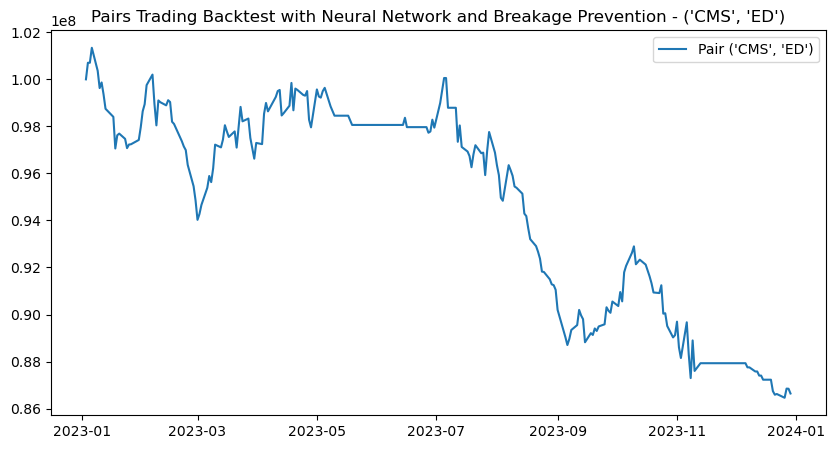

Performance for pair ('CMS', 'ED'):
Cumulative Return: -13.46%
Sharpe Ratio: -1.55
Sortino Ratio: -0.13
Max Drawdown: -14.69%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step


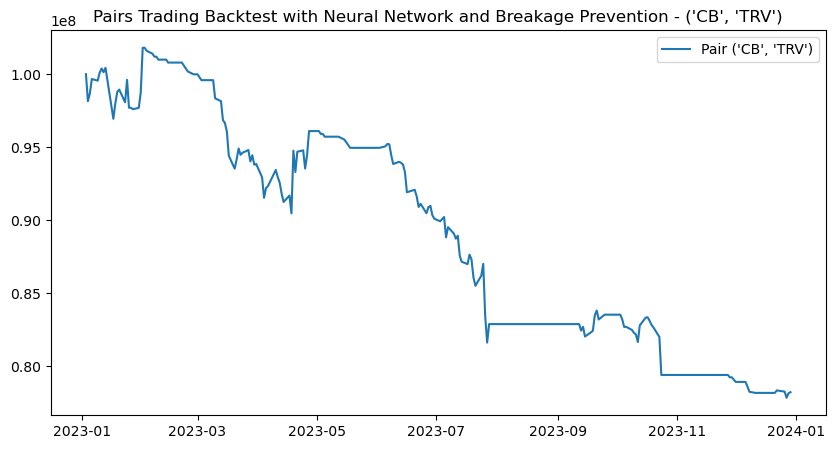

Performance for pair ('CB', 'TRV'):
Cumulative Return: -21.94%
Sharpe Ratio: -1.97
Sortino Ratio: -0.16
Max Drawdown: -23.55%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step


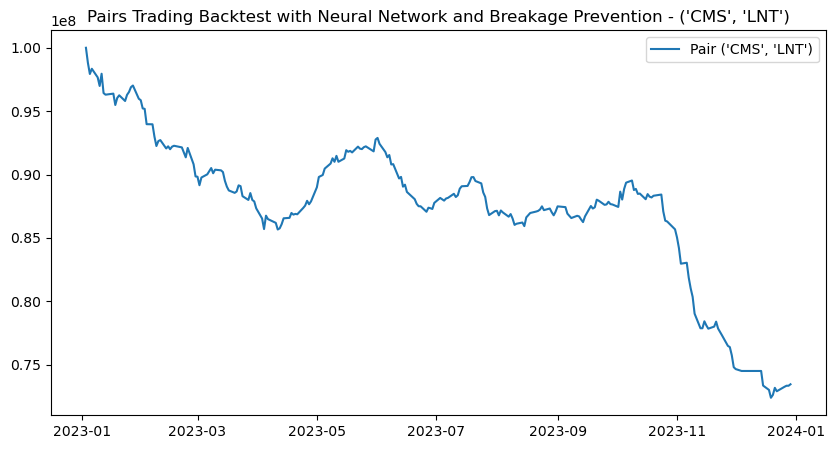

Performance for pair ('CMS', 'LNT'):
Cumulative Return: -26.73%
Sharpe Ratio: -3.50
Sortino Ratio: -0.26
Max Drawdown: -27.22%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 491us/step


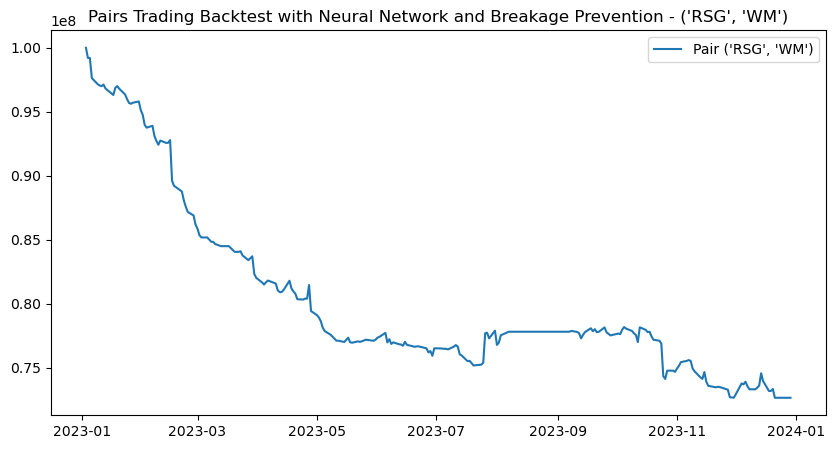

Performance for pair ('RSG', 'WM'):
Cumulative Return: -27.52%
Sharpe Ratio: -3.57
Sortino Ratio: -0.26
Max Drawdown: -26.95%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 567us/step


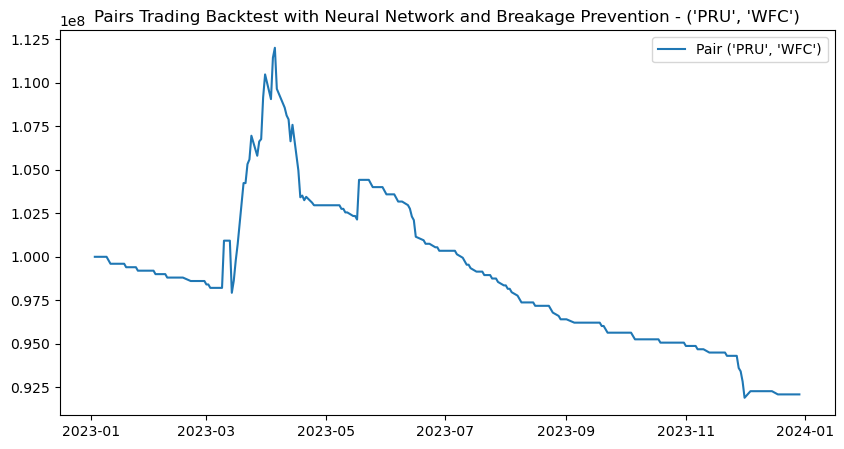

Performance for pair ('PRU', 'WFC'):
Cumulative Return: -7.97%
Sharpe Ratio: -0.91
Sortino Ratio: -0.09
Max Drawdown: -17.96%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 512us/step


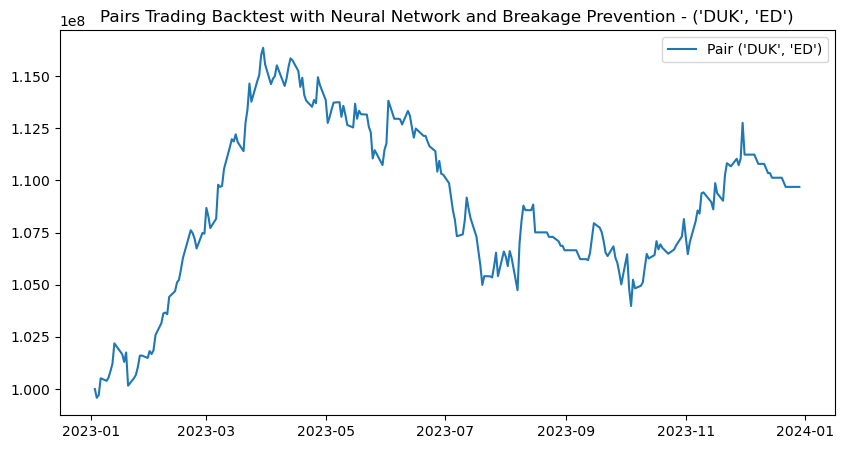

Performance for pair ('DUK', 'ED'):
Cumulative Return: 9.77%
Sharpe Ratio: 1.06
Sortino Ratio: 0.11
Max Drawdown: -10.64%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 583us/step


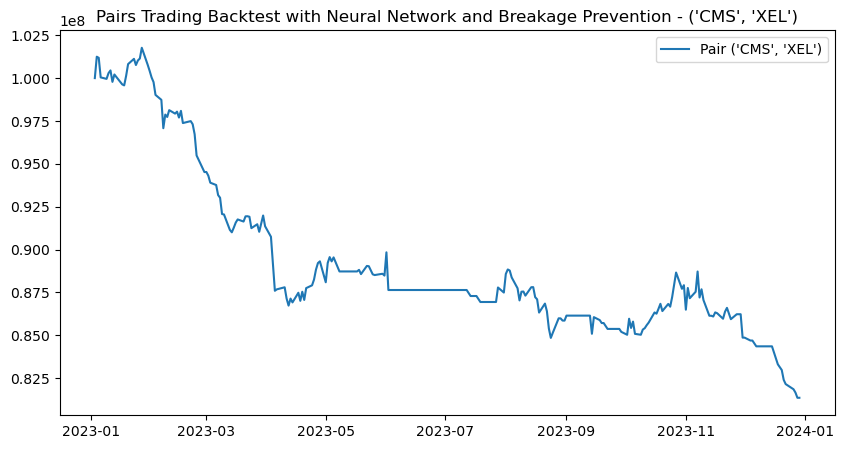

Performance for pair ('CMS', 'XEL'):
Cumulative Return: -18.78%
Sharpe Ratio: -2.28
Sortino Ratio: -0.17
Max Drawdown: -20.06%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 480us/step


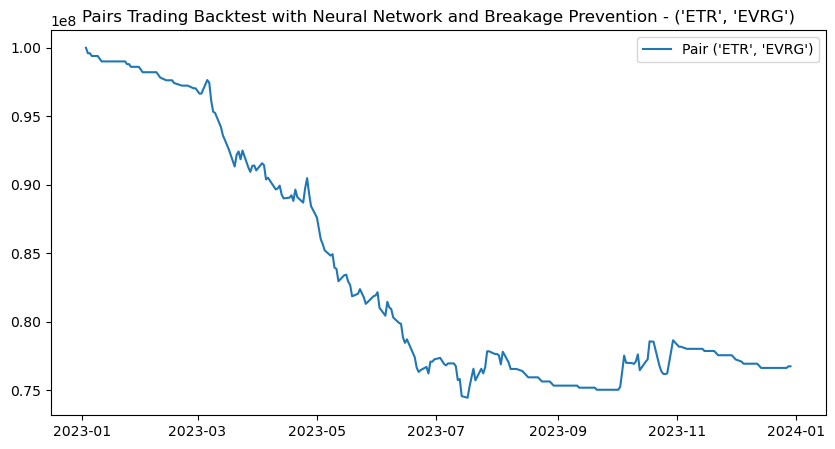

Performance for pair ('ETR', 'EVRG'):
Cumulative Return: -23.42%
Sharpe Ratio: -2.83
Sortino Ratio: -0.23
Max Drawdown: -25.41%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step


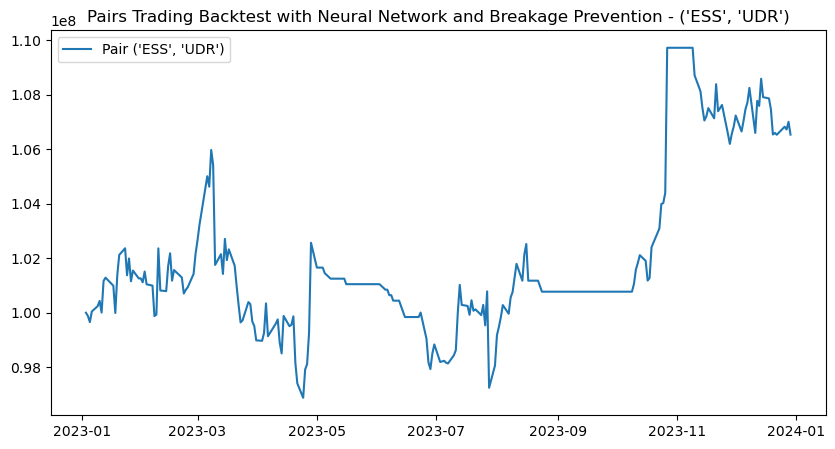

Performance for pair ('ESS', 'UDR'):
Cumulative Return: 6.59%
Sharpe Ratio: 0.60
Sortino Ratio: 0.06
Max Drawdown: -8.59%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 529us/step


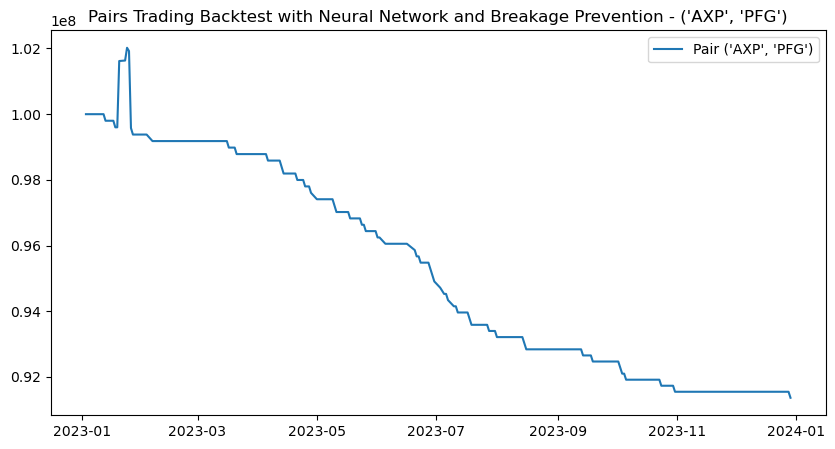

Performance for pair ('AXP', 'PFG'):
Cumulative Return: -8.70%
Sharpe Ratio: -2.71
Sortino Ratio: -0.21
Max Drawdown: -10.45%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 489us/step


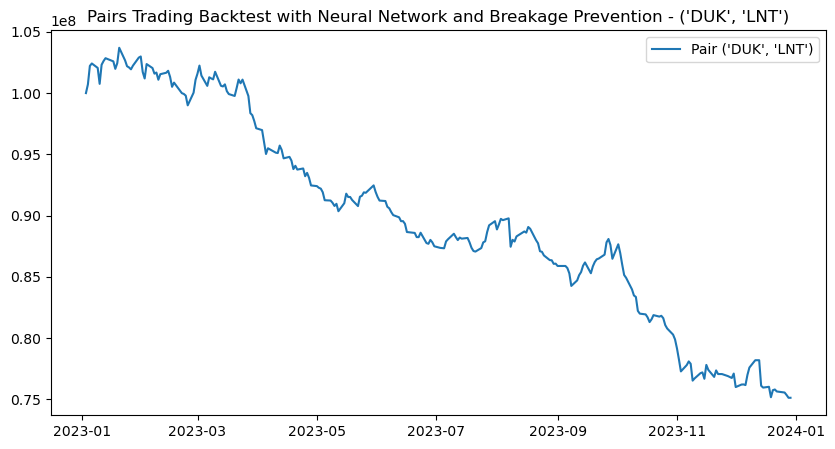

Performance for pair ('DUK', 'LNT'):
Cumulative Return: -25.04%
Sharpe Ratio: -2.85
Sortino Ratio: -0.22
Max Drawdown: -27.55%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 469us/step


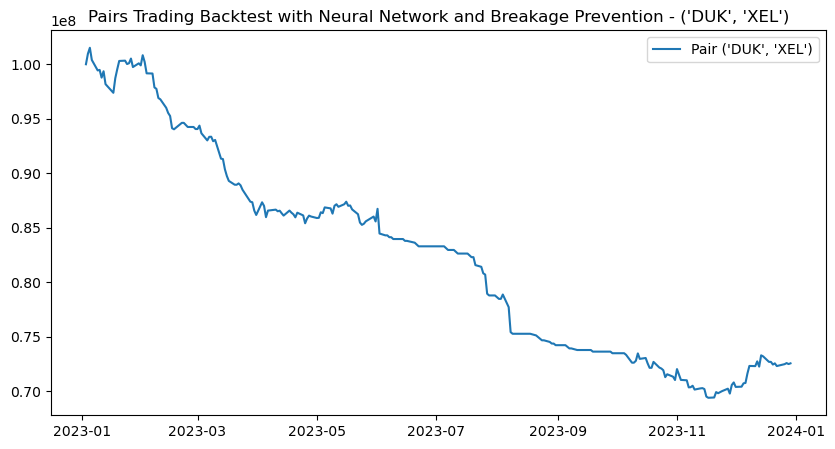

Performance for pair ('DUK', 'XEL'):
Cumulative Return: -27.65%
Sharpe Ratio: -3.55
Sortino Ratio: -0.26
Max Drawdown: -31.66%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step


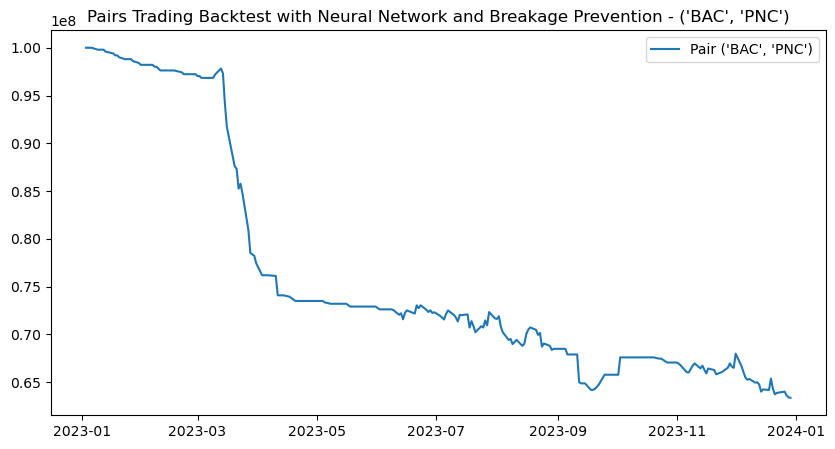

Performance for pair ('BAC', 'PNC'):
Cumulative Return: -36.87%
Sharpe Ratio: -3.51
Sortino Ratio: -0.24
Max Drawdown: -36.64%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 564us/step


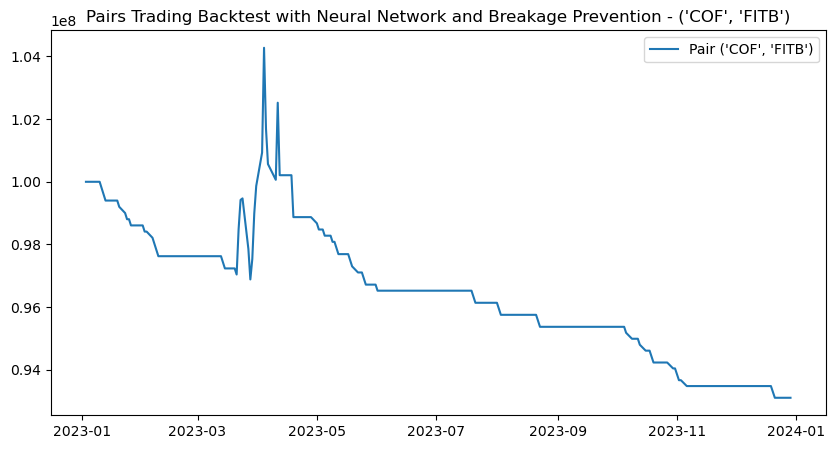

Performance for pair ('COF', 'FITB'):
Cumulative Return: -6.94%
Sharpe Ratio: -1.04
Sortino Ratio: -0.10
Max Drawdown: -10.71%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step


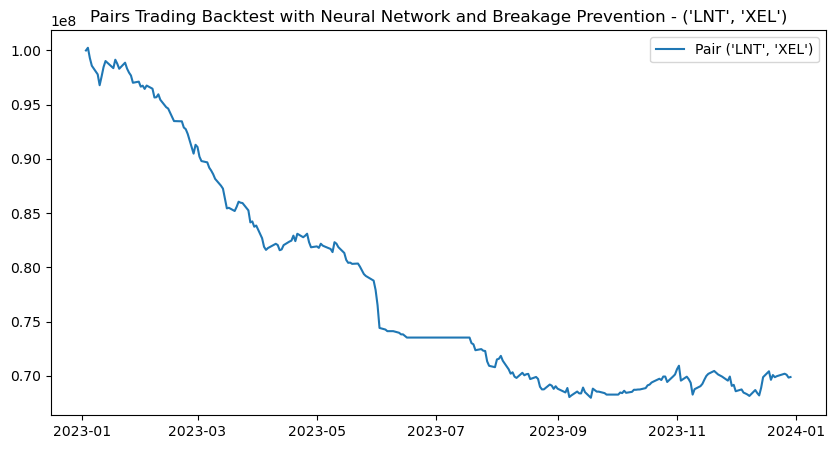

Performance for pair ('LNT', 'XEL'):
Cumulative Return: -30.32%
Sharpe Ratio: -4.00
Sortino Ratio: -0.29
Max Drawdown: -32.27%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step


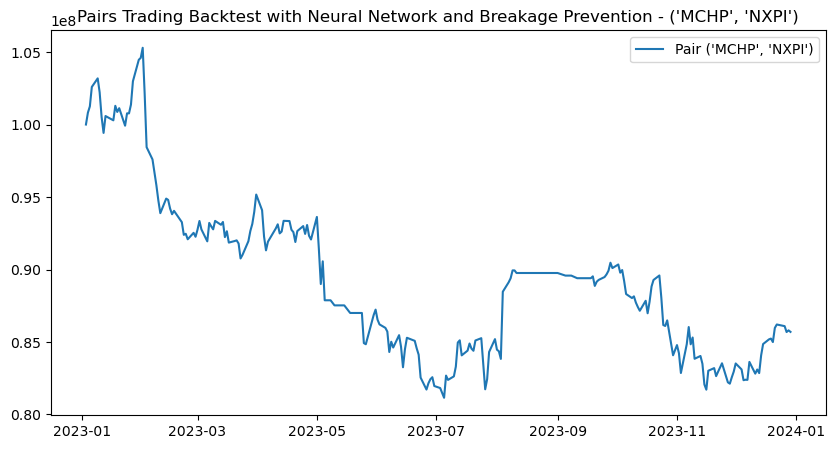

Performance for pair ('MCHP', 'NXPI'):
Cumulative Return: -14.41%
Sharpe Ratio: -0.90
Sortino Ratio: -0.08
Max Drawdown: -22.93%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step


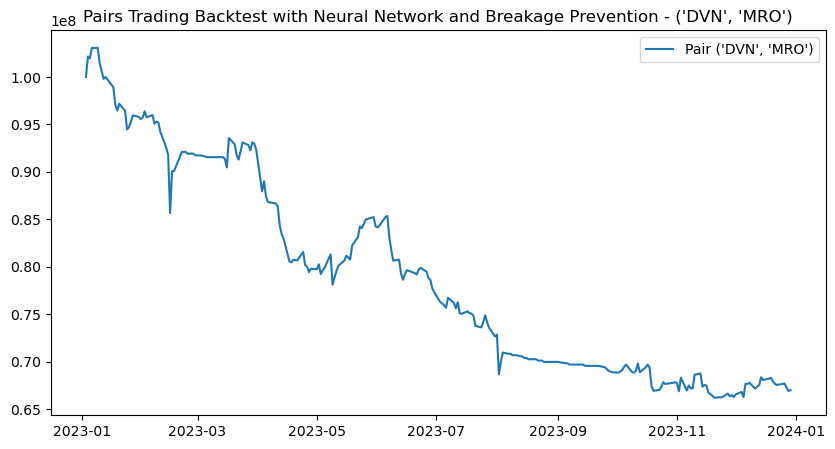

Performance for pair ('DVN', 'MRO'):
Cumulative Return: -33.22%
Sharpe Ratio: -2.14
Sortino Ratio: -0.16
Max Drawdown: -35.77%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 544us/step


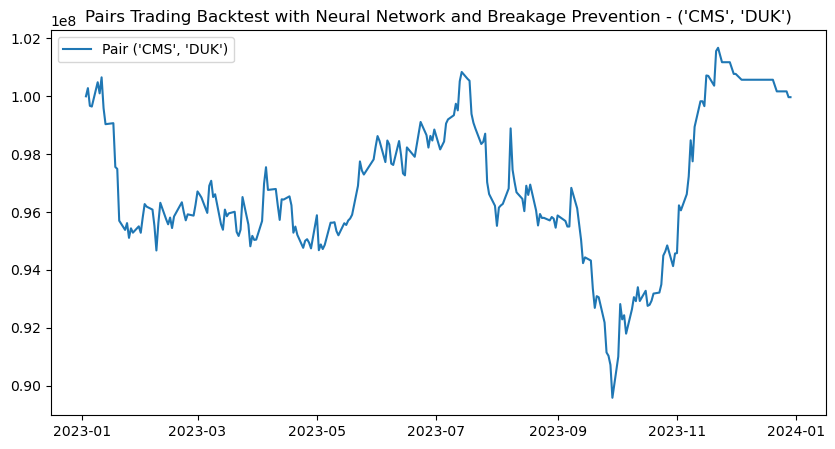

Performance for pair ('CMS', 'DUK'):
Cumulative Return: -0.03%
Sharpe Ratio: 0.04
Sortino Ratio: 0.00
Max Drawdown: -11.17%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 542us/step


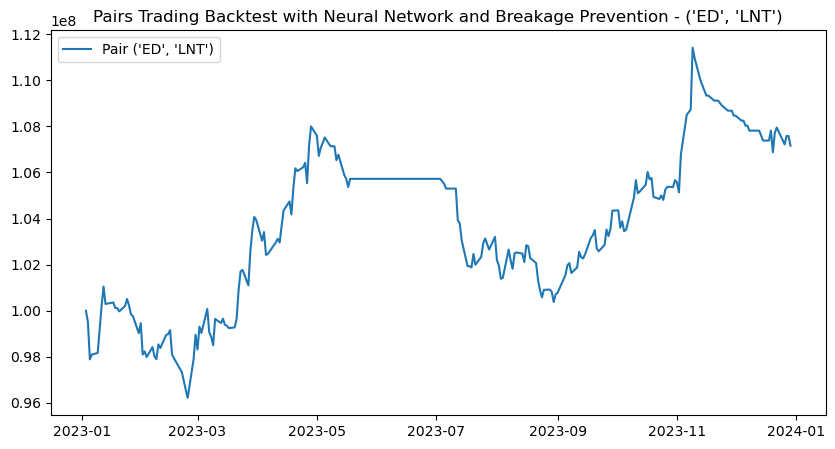

Performance for pair ('ED', 'LNT'):
Cumulative Return: 7.22%
Sharpe Ratio: 0.85
Sortino Ratio: 0.09
Max Drawdown: -7.06%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step


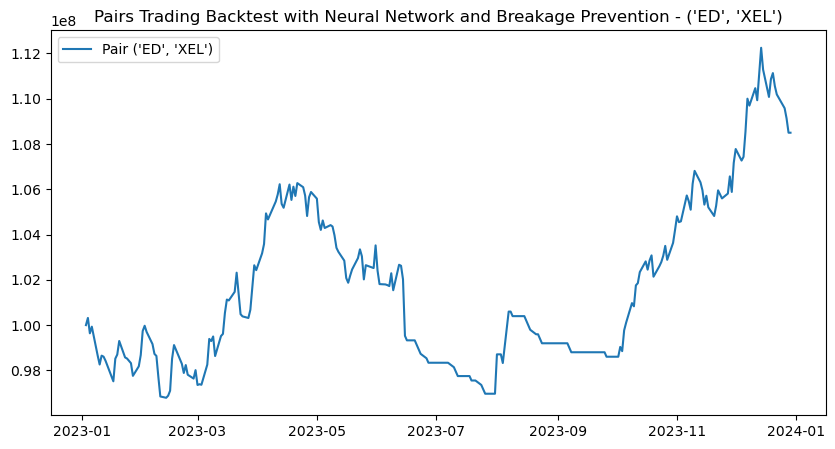

Performance for pair ('ED', 'XEL'):
Cumulative Return: 8.57%
Sharpe Ratio: 0.96
Sortino Ratio: 0.10
Max Drawdown: -8.75%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step


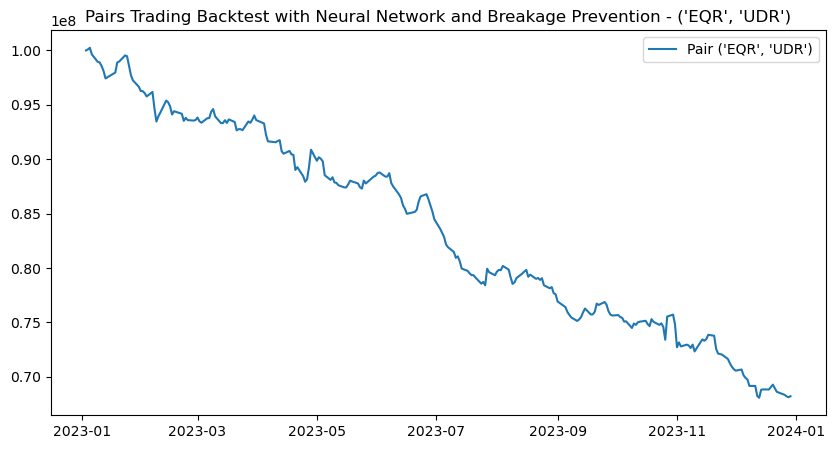

Performance for pair ('EQR', 'UDR'):
Cumulative Return: -32.00%
Sharpe Ratio: -3.95
Sortino Ratio: -0.30
Max Drawdown: -32.10%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step


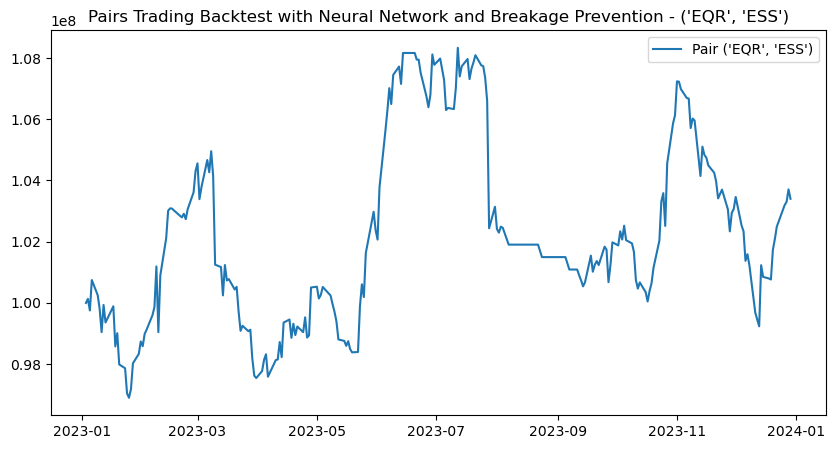

Performance for pair ('EQR', 'ESS'):
Cumulative Return: 3.43%
Sharpe Ratio: 0.36
Sortino Ratio: 0.03
Max Drawdown: -8.40%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 501us/step


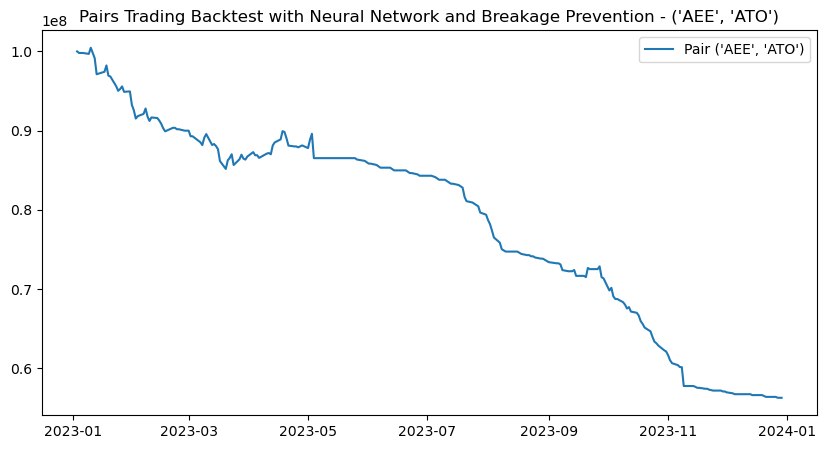

Performance for pair ('AEE', 'ATO'):
Cumulative Return: -44.00%
Sharpe Ratio: -5.82
Sortino Ratio: -0.38
Max Drawdown: -43.99%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 454us/step


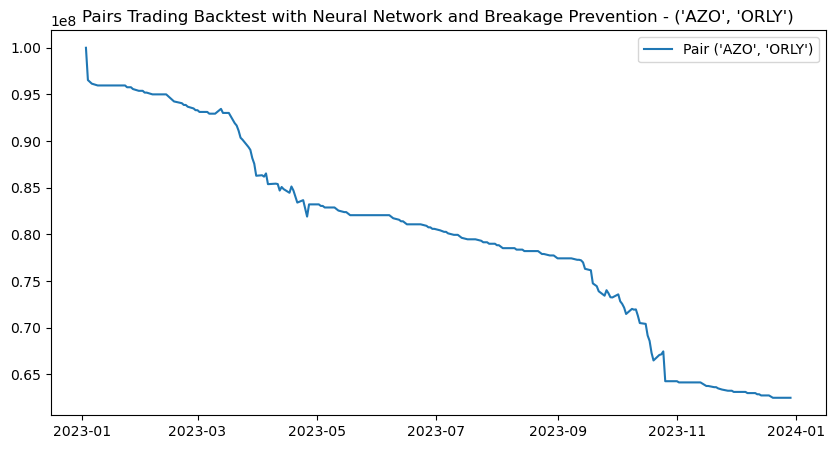

Performance for pair ('AZO', 'ORLY'):
Cumulative Return: -37.76%
Sharpe Ratio: -5.89
Sortino Ratio: -0.37
Max Drawdown: -36.87%


In [32]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import tensorflow as tf

# Function to get stock data
def get_stock_data(tickers, start_date, end_date):
    data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']
    return data

# Function to generate features for neural network
def generate_features(stock1, stock2, window=30):
    spread = stock1 - stock2
    features = pd.DataFrame(index=spread.index)
    features['spread'] = spread
    features['zscore'] = (spread - spread.rolling(window).mean()) / spread.rolling(window).std()
    features['spread_change'] = spread.diff()
    features = features.dropna()
    return features

# Function to calculate hedge ratio using linear regression
def calculate_hedge_ratio(stock1, stock2):
    model = LinearRegression()
    model.fit(stock2.values.reshape(-1, 1), stock1.values)
    hedge_ratio = model.coef_[0]
    return hedge_ratio

# Function to train neural network model
def train_nn_model(features, train_start, train_end):
    scaler = StandardScaler()
    X = scaler.fit_transform(features[['spread', 'zscore', 'spread_change']])
    y = np.sign(features['spread_change'].shift(-1)).dropna()
    X = X[:-1]  # Ensure X and y have the same length

    train_mask = (features.index[:-1] >= train_start) & (features.index[:-1] <= train_end)
    X_train, y_train = X[train_mask], y[train_mask]

    model = Sequential()
    model.add(Dense(64, input_dim=X.shape[1], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))

    model.compile(loss='mse', optimizer='adam')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)
    
    return model, scaler

# Function to generate trading signals using the trained neural network model
def generate_signals(model, scaler, features):
    X = scaler.transform(features[['spread', 'zscore', 'spread_change']])
    predictions = model.predict(X)
    signals = pd.DataFrame(index=features.index)
    signals['signal'] = predictions
    signals['long'] = (signals['signal'] > 0).astype(int)
    signals['short'] = (signals['signal'] < 0).astype(int)
    return signals

# Function to calculate PnL and cumulative PnL using signals and hedge ratio with trading cost
def calculate_pnl(data, signals, hedge_ratio, initial_capital=10000, trading_cost_bps=5):
    returns = data.pct_change().dropna()
    positions = pd.DataFrame(index=signals.index).fillna(0.0)

    # Apply the signals to calculate the long and short positions
    positions[data.columns[0]] = signals['long'] - signals['short'] * hedge_ratio
    positions[data.columns[1]] = -positions[data.columns[0]] * hedge_ratio

    # Calculate the returns based on the positions
    pnl = positions.shift(1) * returns
    pnl['total'] = pnl.sum(axis=1)

    # Apply trading costs
    trade_costs = positions.diff().abs().sum(axis=1) * (trading_cost_bps / 10000)
    pnl['total'] -= trade_costs

    # Calculate the cumulative PnL
    cumulative_pnl = (1 + pnl['total']).cumprod() * initial_capital
    cumulative_pnl.iloc[0] = initial_capital  # Ensure the starting value is the initial capital

    return pnl['total'], cumulative_pnl

# Performance metrics calculation functions
def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = np.prod(returns + 1)
    return cum_ret_final ** (1 / num_years) - 1

def Sharpe(returns, risk_free=0):
    adj_returns = returns - risk_free
    return (np.nanmean(adj_returns) * np.sqrt(252)) / np.nanstd(adj_returns, ddof=1)

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, None, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def max_drawdown(returns):
    wealth_index = 10000 * (1 + returns).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdown = (wealth_index - previous_peaks) / previous_peaks
    return drawdown.min()

# Simplified function to calculate performance metrics
def calculate_performance_metrics(cumulative_pnl, returns):
    cumulative_return = annual_returns(returns) * 100
    sharpe_ratio = Sharpe(returns)
    sortino_ratio = sortino(returns)
    max_drawdown_value = max_drawdown(returns) * 100

    return cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value

# Fetch stock data for all pairs
# pair_df = pd.DataFrame([['ETR', 'NI'], ['DUK', 'ED']], columns=['Stock1', 'Stock2'])

start_date = '2018-01-01'
end_date = '2023-12-31'
all_stock_data = {}
for index, row in pair_df.iterrows():
    pair = [row['Stock1'], row['Stock2']]
    data = get_stock_data(pair, start_date, end_date)
    all_stock_data[tuple(pair)] = data

# Define training and testing periods
train_start = '2018-01-01'
train_end = '2022-12-31'
test_start = '2023-01-01'
test_end = '2023-12-31'

# Function to backtest pairs with breakage prevention
def backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end, correlation_threshold=0.8, window=30, initial_capital=10000, trading_cost_bps=5):
    positions = pd.DataFrame(index=signals.index).fillna(0.0)
    positions[stock1.name] = signals['long'] - signals['short']
    positions[stock2.name] = -positions[stock1.name]

    stock1_returns = stock1.pct_change().fillna(0)
    stock2_returns = stock2.pct_change().fillna(0)

    portfolio = pd.DataFrame(index=positions.index)
    portfolio['stock1'] = positions[stock1.name] * stock1_returns
    portfolio['stock2'] = positions[stock2.name] * stock2_returns
    portfolio['total'] = portfolio['stock1'] + portfolio['stock2']

    portfolio['returns'] = portfolio['total']

    rolling_corr = stock1_returns.rolling(window=window).corr(stock2_returns)

    portfolio['exit'] = (rolling_corr < correlation_threshold).astype(int).shift(1).fillna(0)
    portfolio.loc[portfolio['exit'] == 1, 'returns'] = 0

    test_mask = (portfolio.index >= test_start) & (portfolio.index <= test_end)
    test_portfolio = portfolio[test_mask].copy()

    # Apply trading costs
    trade_costs = positions.diff().abs().sum(axis=1) * (trading_cost_bps / 10000)
    test_portfolio['returns'] -= trade_costs[test_mask]

    # Reset cumulative returns for the test period
    test_portfolio['cumulative'] = (test_portfolio['returns'] + 1).cumprod() * initial_capital
    test_portfolio.iloc[0, test_portfolio.columns.get_loc('cumulative')] = initial_capital

    return test_portfolio

# Loop through each pair and backtest using Neural Network with pair breakage prevention
results = {}
performance_metrics = {}

for pair, data in all_stock_data.items():
    stock1, stock2 = data[pair[0]], data[pair[1]]
    features = generate_features(stock1, stock2)
    if features.empty:
        continue
    hedge_ratio = calculate_hedge_ratio(stock1, stock2)
    model, scaler = train_nn_model(features, train_start, train_end)
    signals = generate_signals(model, scaler, features)
    if signals.empty:
        continue
    portfolio = backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end)
    results[pair] = portfolio
    cumulative_pnl = portfolio['cumulative']
    pnl = portfolio['returns']
    performance_metrics[pair] = calculate_performance_metrics(cumulative_pnl, pnl)
    
    # Plot the results
    initial_capital = 10000  # Set the initial capital
    cumulative_pnl_dollars = cumulative_pnl * initial_capital

    plt.figure(figsize=(10, 5))
    plt.plot(cumulative_pnl_dollars, label=f"Pair {pair}")
    plt.title(f"Pairs Trading Backtest with Neural Network and Breakage Prevention - {pair}")
    plt.legend()
    plt.show()

    # Print performance metrics
    cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value = performance_metrics[pair]
    print(f"Performance for pair {pair}:")
    print(f"Cumulative Return: {cumulative_return:.2f}%")
    print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Sortino Ratio: {sortino_ratio:.2f}")
    print(f"Max Drawdown: {max_drawdown_value:.2f}%")

CORRECT LE

[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%*******

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 514us/step


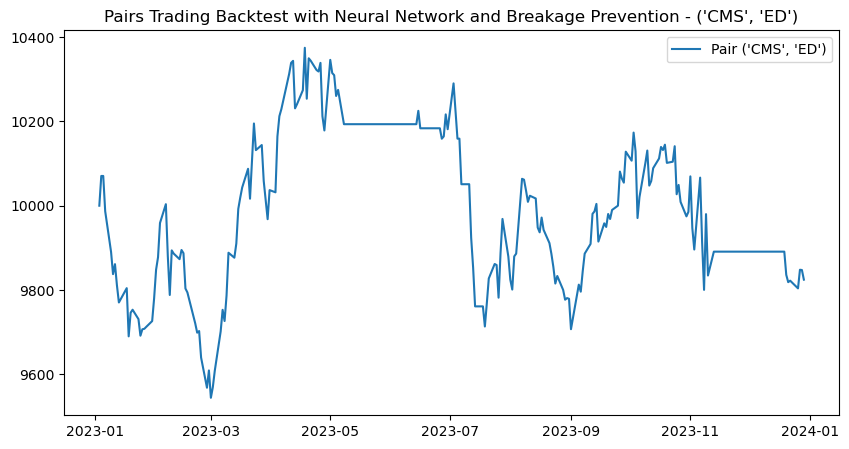

Performance for pair ('CMS', 'ED'):
Cumulative Return: -1.77%
Sharpe Ratio: -0.15
Sortino Ratio: -0.01
Max Drawdown: -6.44%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 459us/step


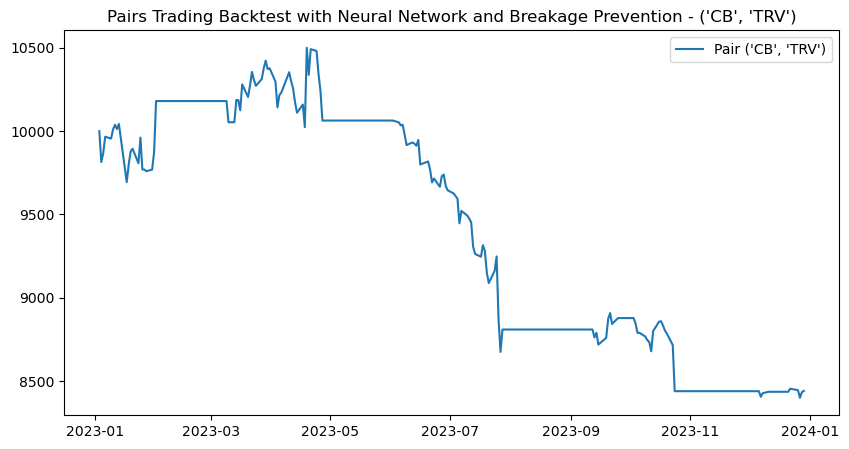

Performance for pair ('CB', 'TRV'):
Cumulative Return: -15.71%
Sharpe Ratio: -1.35
Sortino Ratio: -0.11
Max Drawdown: -20.01%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step


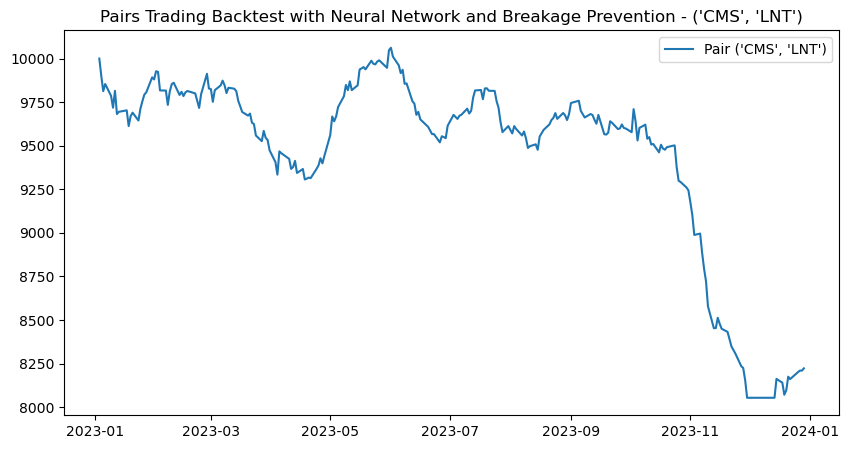

Performance for pair ('CMS', 'LNT'):
Cumulative Return: -17.91%
Sharpe Ratio: -2.25
Sortino Ratio: -0.18
Max Drawdown: -19.96%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 533us/step


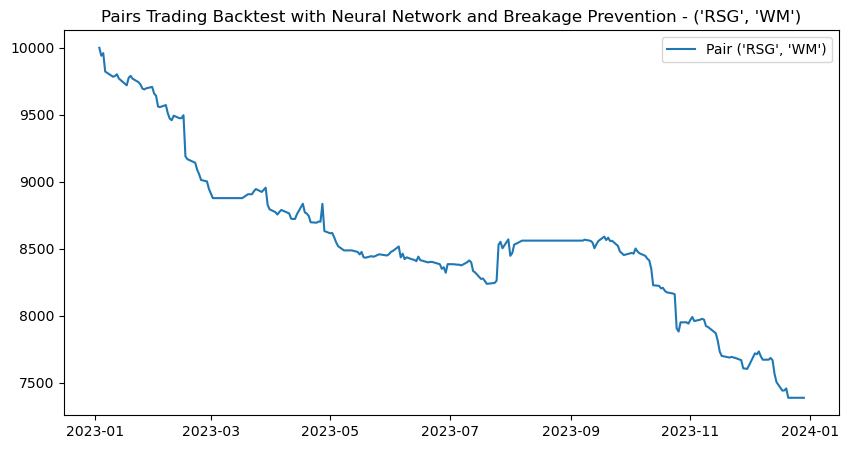

Performance for pair ('RSG', 'WM'):
Cumulative Return: -26.30%
Sharpe Ratio: -3.58
Sortino Ratio: -0.26
Max Drawdown: -25.87%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 508us/step


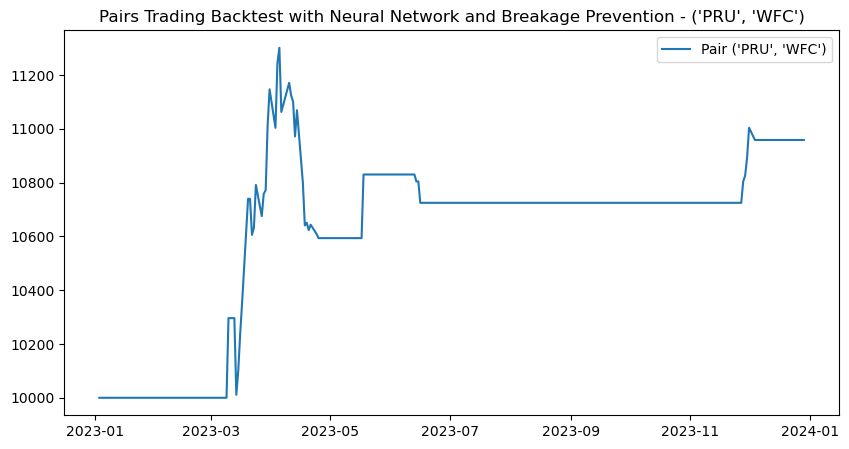

Performance for pair ('PRU', 'WFC'):
Cumulative Return: 9.67%
Sharpe Ratio: 1.09
Sortino Ratio: 0.12
Max Drawdown: -6.26%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 567us/step


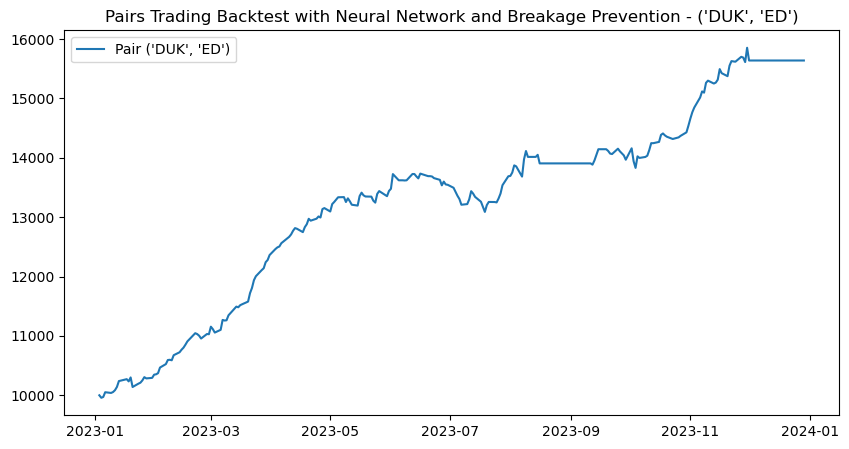

Performance for pair ('DUK', 'ED'):
Cumulative Return: 56.95%
Sharpe Ratio: 5.19
Sortino Ratio: 0.64
Max Drawdown: -4.70%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 458us/step


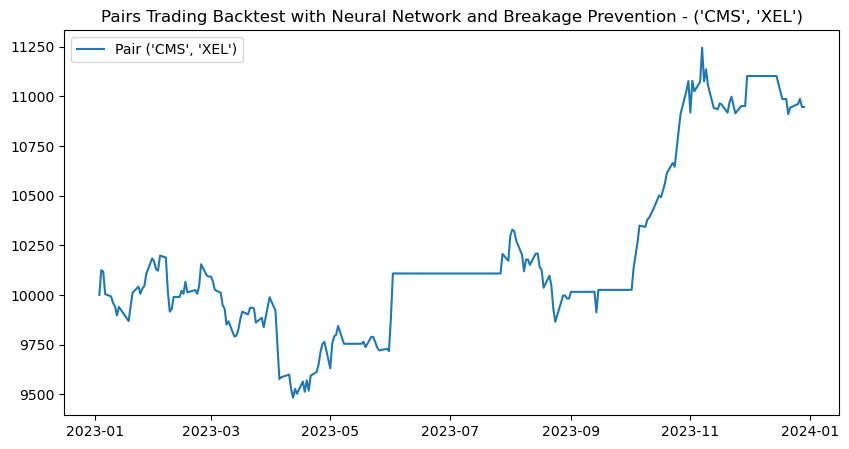

Performance for pair ('CMS', 'XEL'):
Cumulative Return: 9.55%
Sharpe Ratio: 1.08
Sortino Ratio: 0.10
Max Drawdown: -7.02%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step


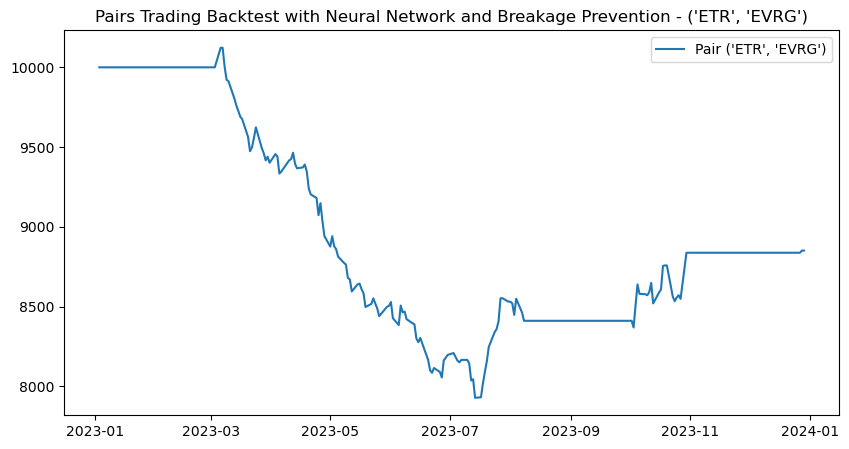

Performance for pair ('ETR', 'EVRG'):
Cumulative Return: -11.57%
Sharpe Ratio: -1.30
Sortino Ratio: -0.11
Max Drawdown: -21.67%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 456us/step


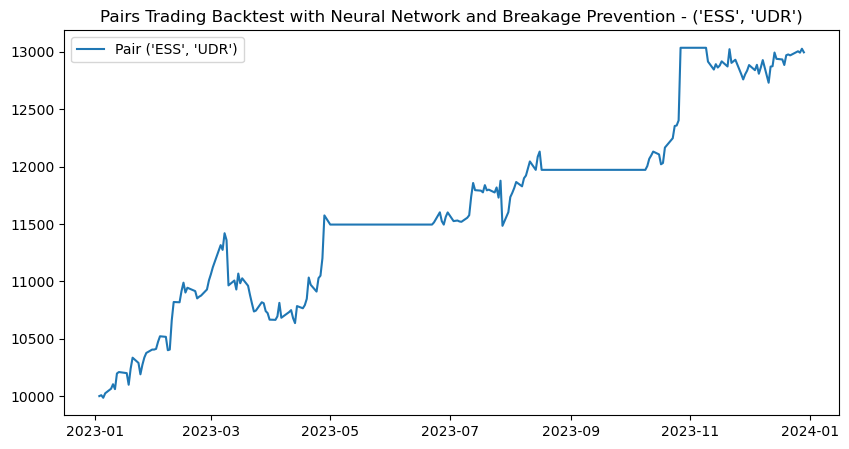

Performance for pair ('ESS', 'UDR'):
Cumulative Return: 30.23%
Sharpe Ratio: 2.34
Sortino Ratio: 0.25
Max Drawdown: -6.86%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step


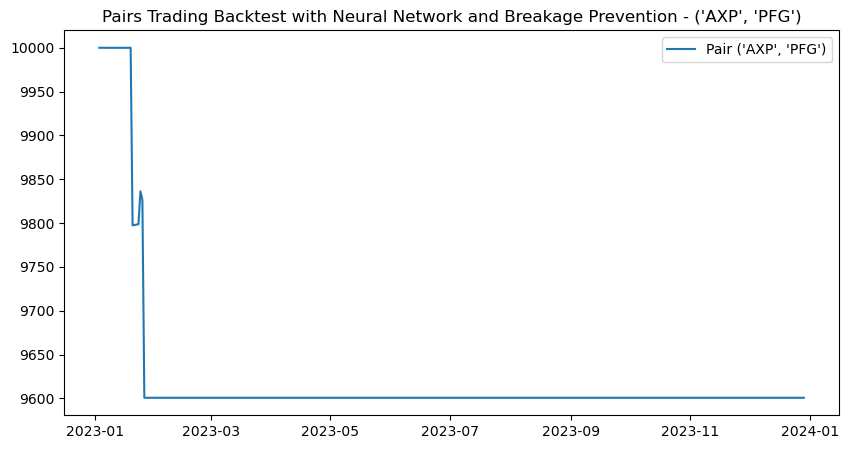

Performance for pair ('AXP', 'PFG'):
Cumulative Return: -4.02%
Sharpe Ratio: -1.31
Sortino Ratio: -0.08
Max Drawdown: -3.99%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 452us/step


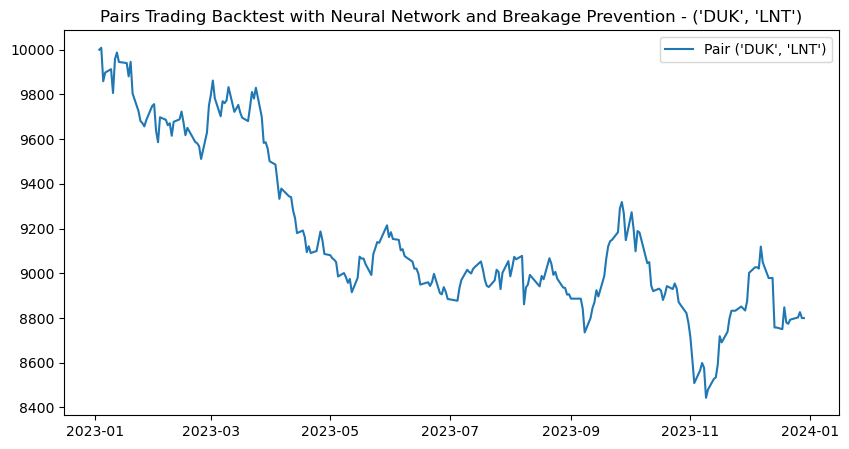

Performance for pair ('DUK', 'LNT'):
Cumulative Return: -12.09%
Sharpe Ratio: -1.26
Sortino Ratio: -0.10
Max Drawdown: -15.90%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 465us/step


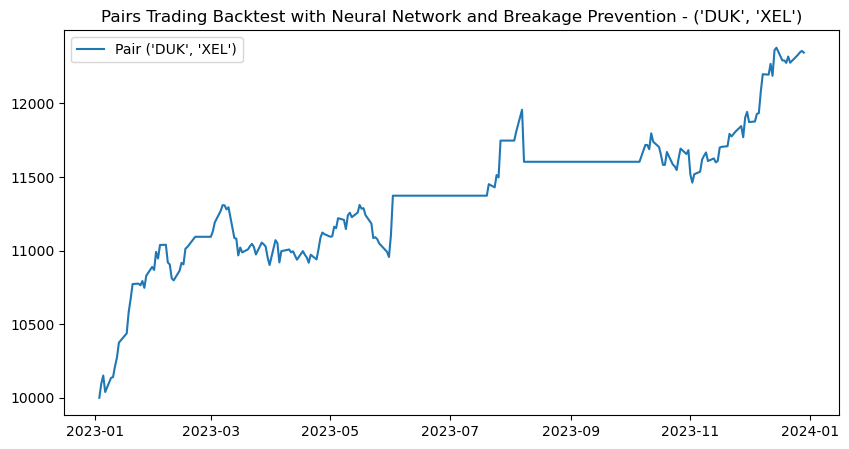

Performance for pair ('DUK', 'XEL'):
Cumulative Return: 23.66%
Sharpe Ratio: 2.49
Sortino Ratio: 0.26
Max Drawdown: -4.14%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 473us/step


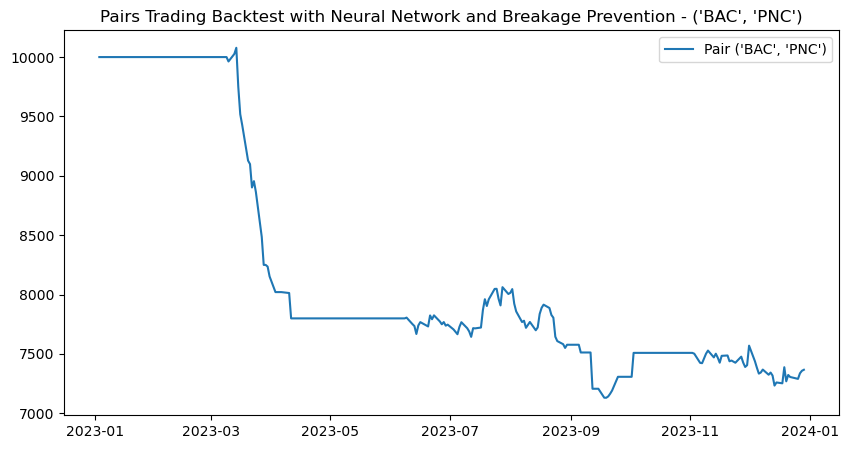

Performance for pair ('BAC', 'PNC'):
Cumulative Return: -26.52%
Sharpe Ratio: -2.39
Sortino Ratio: -0.17
Max Drawdown: -29.25%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 455us/step


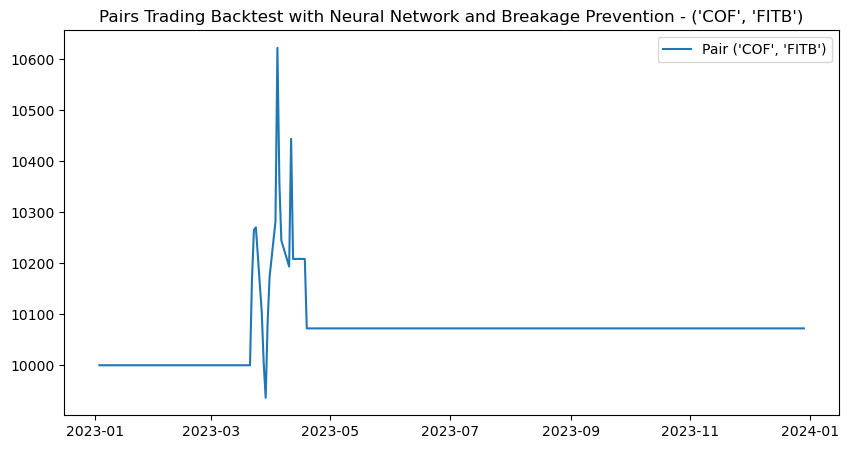

Performance for pair ('COF', 'FITB'):
Cumulative Return: 0.73%
Sharpe Ratio: 0.14
Sortino Ratio: 0.01
Max Drawdown: -5.18%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 538us/step


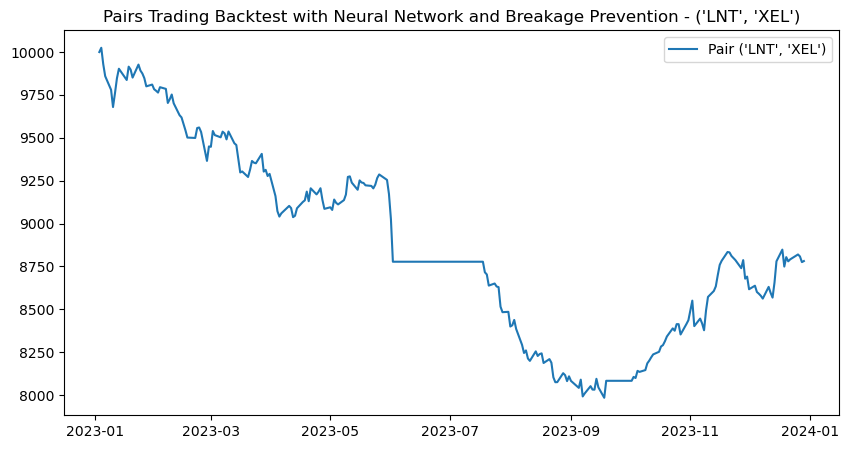

Performance for pair ('LNT', 'XEL'):
Cumulative Return: -12.28%
Sharpe Ratio: -1.44
Sortino Ratio: -0.11
Max Drawdown: -20.44%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 618us/step


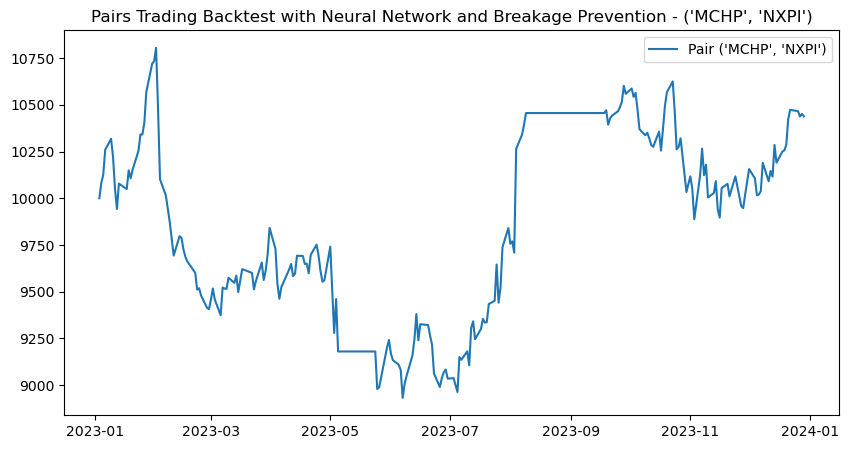

Performance for pair ('MCHP', 'NXPI'):
Cumulative Return: 4.42%
Sharpe Ratio: 0.35
Sortino Ratio: 0.03
Max Drawdown: -17.34%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 485us/step


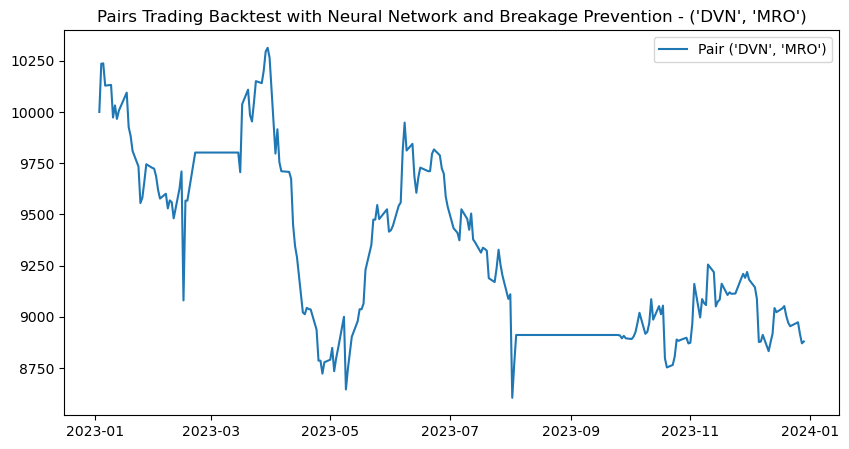

Performance for pair ('DVN', 'MRO'):
Cumulative Return: -11.28%
Sharpe Ratio: -0.58
Sortino Ratio: -0.05
Max Drawdown: -16.56%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step


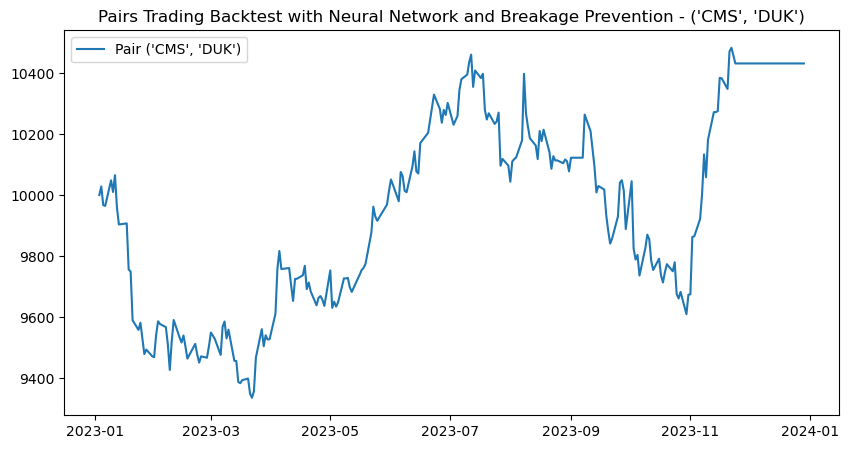

Performance for pair ('CMS', 'DUK'):
Cumulative Return: 4.36%
Sharpe Ratio: 0.49
Sortino Ratio: 0.05
Max Drawdown: -8.14%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 483us/step


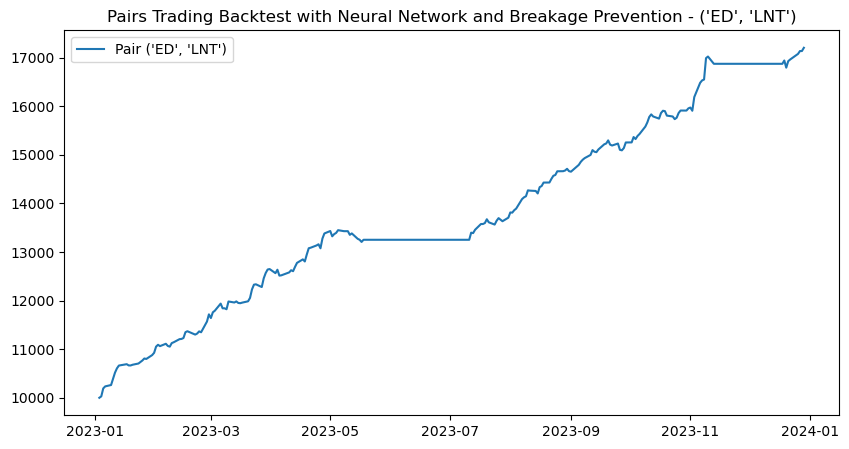

Performance for pair ('ED', 'LNT'):
Cumulative Return: 72.80%
Sharpe Ratio: 6.75
Sortino Ratio: 1.09
Max Drawdown: -1.80%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 477us/step


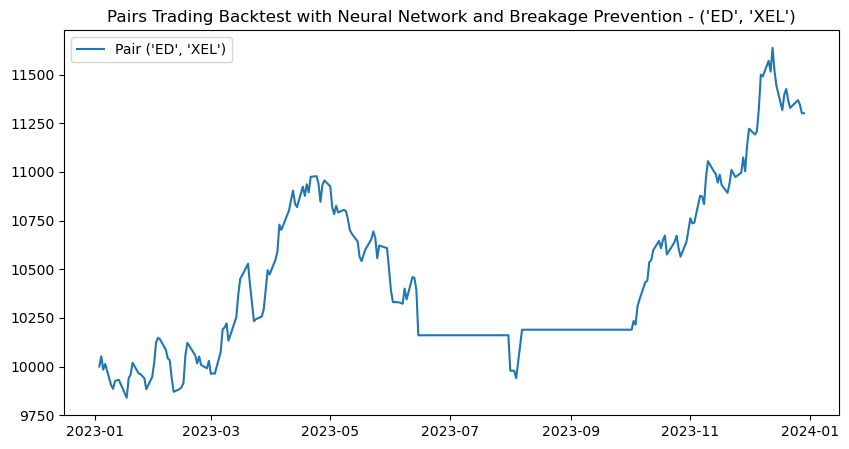

Performance for pair ('ED', 'XEL'):
Cumulative Return: 13.13%
Sharpe Ratio: 1.41
Sortino Ratio: 0.14
Max Drawdown: -9.46%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 462us/step


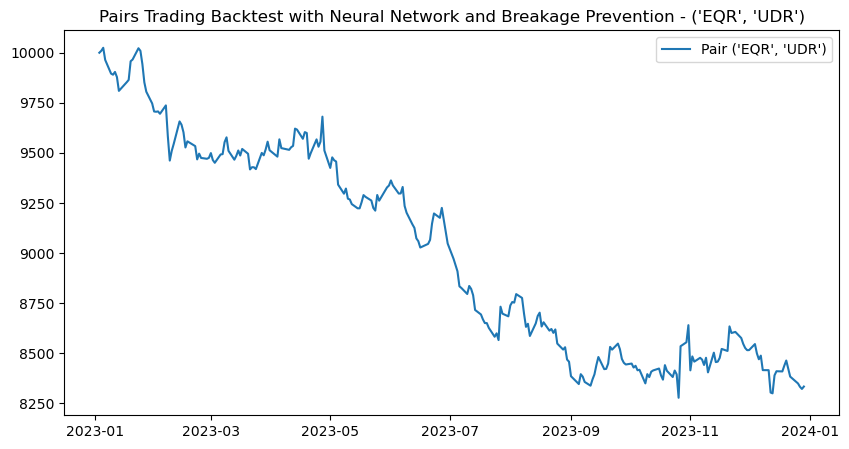

Performance for pair ('EQR', 'UDR'):
Cumulative Return: -16.79%
Sharpe Ratio: -1.91
Sortino Ratio: -0.16
Max Drawdown: -17.43%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 485us/step


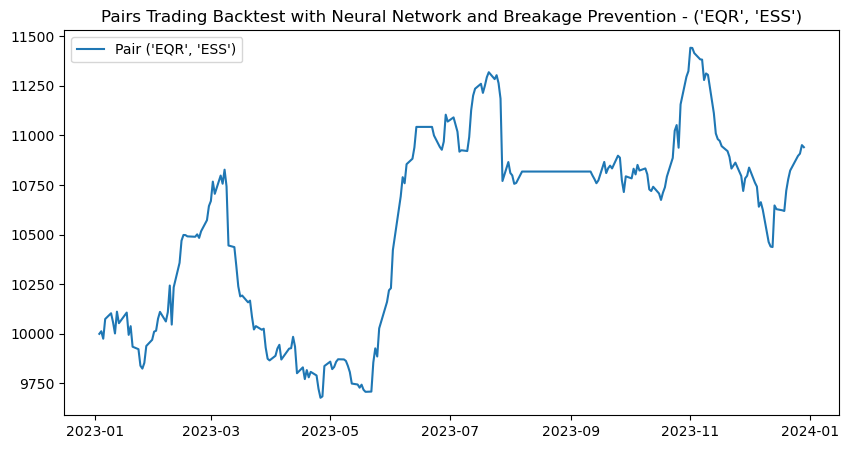

Performance for pair ('EQR', 'ESS'):
Cumulative Return: 9.49%
Sharpe Ratio: 0.89
Sortino Ratio: 0.08
Max Drawdown: -10.62%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 494us/step


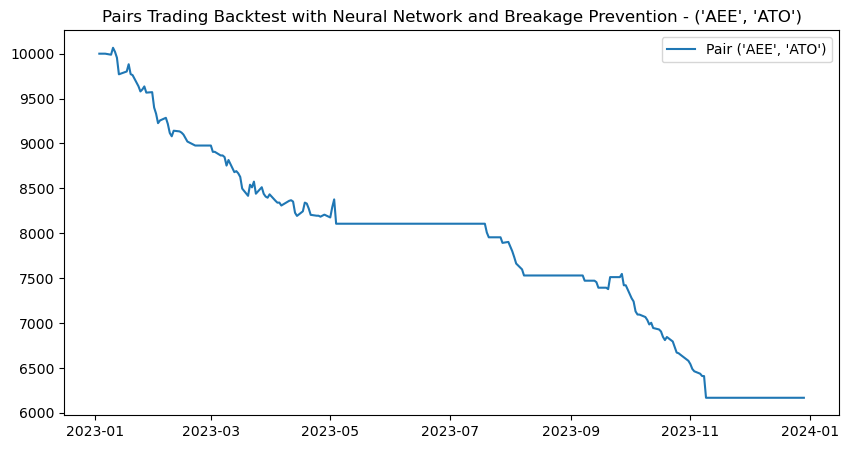

Performance for pair ('AEE', 'ATO'):
Cumulative Return: -38.56%
Sharpe Ratio: -5.14
Sortino Ratio: -0.34
Max Drawdown: -38.72%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 682us/step


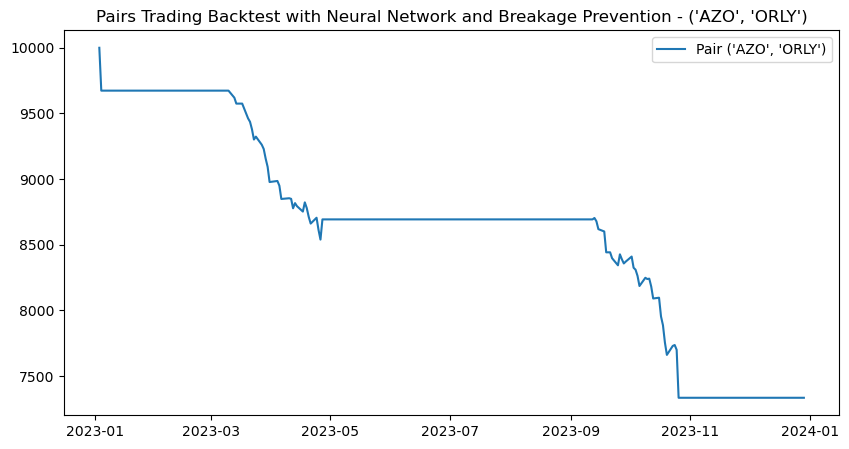

Performance for pair ('AZO', 'ORLY'):
Cumulative Return: -26.83%
Sharpe Ratio: -3.93
Sortino Ratio: -0.26
Max Drawdown: -25.89%


In [31]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import tensorflow as tf

# Function to get stock data
def get_stock_data(tickers, start_date, end_date):
    data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']
    return data

# Function to generate features for neural network
def generate_features(stock1, stock2, window=30):
    spread = stock1 - stock2
    features = pd.DataFrame(index=spread.index)
    features['spread'] = spread
    features['zscore'] = (spread - spread.rolling(window).mean()) / spread.rolling(window).std()
    features['spread_change'] = spread.diff()
    features = features.dropna()
    return features

# Function to calculate hedge ratio using linear regression
def calculate_hedge_ratio(stock1, stock2):
    model = LinearRegression()
    model.fit(stock2.values.reshape(-1, 1), stock1.values)
    hedge_ratio = model.coef_[0]
    return hedge_ratio

# Function to train neural network model
def train_nn_model(features, train_start, train_end):
    scaler = StandardScaler()
    X = scaler.fit_transform(features[['spread', 'zscore', 'spread_change']])
    y = np.sign(features['spread_change'].shift(-1)).dropna()
    X = X[:-1]  # Ensure X and y have the same length

    train_mask = (features.index[:-1] >= train_start) & (features.index[:-1] <= train_end)
    X_train, y_train = X[train_mask], y[train_mask]

    model = Sequential()
    model.add(Dense(64, input_dim=X.shape[1], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))

    model.compile(loss='mse', optimizer='adam')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)
    
    return model, scaler

# Function to generate trading signals using the trained neural network model
def generate_signals(model, scaler, features):
    X = scaler.transform(features[['spread', 'zscore', 'spread_change']])
    predictions = model.predict(X)
    signals = pd.DataFrame(index=features.index)
    signals['signal'] = predictions
    signals['long'] = (signals['signal'] > 0).astype(int)
    signals['short'] = (signals['signal'] < 0).astype(int)
    return signals

# Function to calculate PnL and cumulative PnL using signals and hedge ratio
def calculate_pnl(data, signals, hedge_ratio, initial_capital=10000):
    returns = data.pct_change().dropna()
    positions = pd.DataFrame(index=signals.index).fillna(0.0)

    # Apply the signals to calculate the long and short positions
    positions[data.columns[0]] = signals['long'] - signals['short'] * hedge_ratio
    positions[data.columns[1]] = -positions[data.columns[0]] * hedge_ratio

    # Calculate the returns based on the positions
    pnl = positions.shift(1) * returns
    pnl['total'] = pnl.sum(axis=1)

    # Calculate the cumulative PnL
    cumulative_pnl = (1 + pnl['total']).cumprod() * initial_capital
    cumulative_pnl.iloc[0] = initial_capital  # Ensure the starting value is the initial capital

    return pnl['total'], cumulative_pnl

# Performance metrics calculation functions
def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = np.prod(returns + 1)
    return cum_ret_final ** (1 / num_years) - 1

def Sharpe(returns, risk_free=0):
    adj_returns = returns - risk_free
    return (np.nanmean(adj_returns) * np.sqrt(252)) / np.nanstd(adj_returns, ddof=1)

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, None, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def max_drawdown(returns):
    wealth_index = 10000 * (1 + returns).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdown = (wealth_index - previous_peaks) / previous_peaks
    return drawdown.min()

# Simplified function to calculate performance metrics
def calculate_performance_metrics(cumulative_pnl, returns):
    cumulative_return = annual_returns(returns) * 100
    sharpe_ratio = Sharpe(returns)
    sortino_ratio = sortino(returns)
    max_drawdown_value = max_drawdown(returns) * 100

    return cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value

# Fetch stock data for all pairs
# pair_df = pd.DataFrame([['ETR', 'NI'], ['DUK', 'ED']], columns=['Stock1', 'Stock2'])

start_date = '2018-01-01'
end_date = '2023-12-31'
all_stock_data = {}
for index, row in pair_df.iterrows():
    pair = [row['Stock1'], row['Stock2']]
    data = get_stock_data(pair, start_date, end_date)
    all_stock_data[tuple(pair)] = data

# Define training and testing periods
train_start = '2018-01-01'
train_end = '2022-12-31'
test_start = '2023-01-01'
test_end = '2023-12-31'

# Function to backtest pairs with breakage prevention
def backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end, correlation_threshold=0.8, window=30, initial_capital=10000):
    positions = pd.DataFrame(index=signals.index).fillna(0.0)
    positions[stock1.name] = signals['long'] - signals['short']
    positions[stock2.name] = -positions[stock1.name]

    stock1_returns = stock1.pct_change().fillna(0)
    stock2_returns = stock2.pct_change().fillna(0)

    portfolio = pd.DataFrame(index=positions.index)
    portfolio['stock1'] = positions[stock1.name] * stock1_returns
    portfolio['stock2'] = positions[stock2.name] * stock2_returns
    portfolio['total'] = portfolio['stock1'] + portfolio['stock2']

    portfolio['returns'] = portfolio['total']

    rolling_corr = stock1_returns.rolling(window=window).corr(stock2_returns)

    portfolio['exit'] = (rolling_corr < correlation_threshold).astype(int).shift(1).fillna(0)
    portfolio.loc[portfolio['exit'] == 1, 'returns'] = 0

    test_mask = (portfolio.index >= test_start) & (portfolio.index <= test_end)
    test_portfolio = portfolio[test_mask].copy()

    # Reset cumulative returns for the test period
    test_portfolio['cumulative'] = (test_portfolio['returns'] + 1).cumprod()
    test_portfolio['cumulative'] = test_portfolio['cumulative'] * initial_capital
    test_portfolio.iloc[0, test_portfolio.columns.get_loc('cumulative')] = initial_capital

    return test_portfolio

# Loop through each pair and backtest using Neural Network with pair breakage prevention
results = {}
performance_metrics = {}

for pair, data in all_stock_data.items():
    stock1, stock2 = data[pair[0]], data[pair[1]]
    features = generate_features(stock1, stock2)
    if features.empty:
        continue
    hedge_ratio = calculate_hedge_ratio(stock1, stock2)
    model, scaler = train_nn_model(features, train_start, train_end)
    signals = generate_signals(model, scaler, features)
    if signals.empty:
        continue
    portfolio = backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end)
    results[pair] = portfolio
    cumulative_pnl = portfolio['cumulative']
    pnl = portfolio['returns']
    performance_metrics[pair] = calculate_performance_metrics(cumulative_pnl, pnl)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(cumulative_pnl, label=f"Pair {pair}")
    plt.title(f"Pairs Trading Backtest with Neural Network and Breakage Prevention - {pair}")
    plt.legend()
    plt.show()

    # Print performance metrics  
    cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value = performance_metrics[pair]
    print(f"Performance for pair {pair}:")
    print(f"Cumulative Return: {cumulative_return:.2f}%")
    print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Sortino Ratio: {sortino_ratio:.2f}")
    print(f"Max Drawdown: {max_drawdown_value:.2f}%")

In [ ]:
pair_df = pd.DataFrame(pair_list, columns=['Stock1', 'Stock2'])

In [38]:
pair_df

,stock1,stock2
0,MDLZ,PEP
1,ESS,UDR
2,LNT,XEL
3,AEP,CMS
4,DUK,XEL
5,BAC,PNC
6,RSG,WM
7,ED,LNT
8,MCHP,NXPI
9,COF,FITB


In [41]:
# Load the final_pairs from the CSV file
pair_df = pd.read_csv('filtered_pairs.csv')

# Verify the imported final_pairs
pair_df.columns = ['Stock1', 'Stock2']

[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%**********************]  2 of 2 completed
[*********************100%%*******

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 474us/step


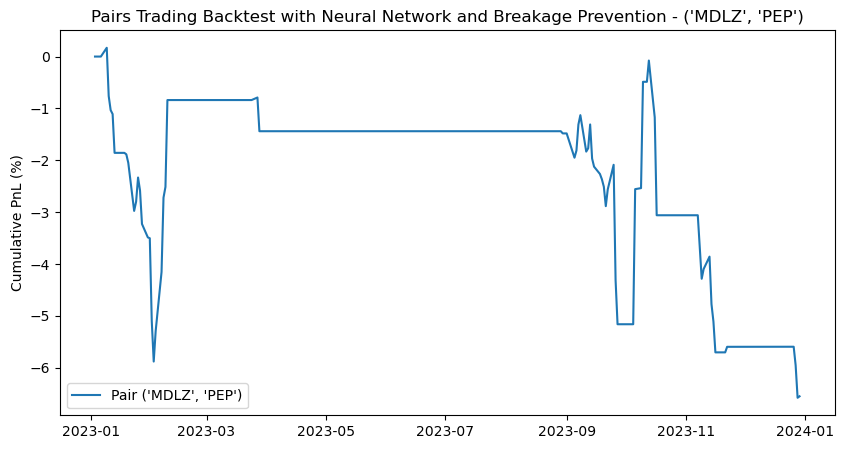

Performance for pair ('MDLZ', 'PEP'):
Cumulative Return: -6.60%
Sharpe Ratio: -1.01
Sortino Ratio: -0.09
Max Drawdown: -6.74%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 497us/step


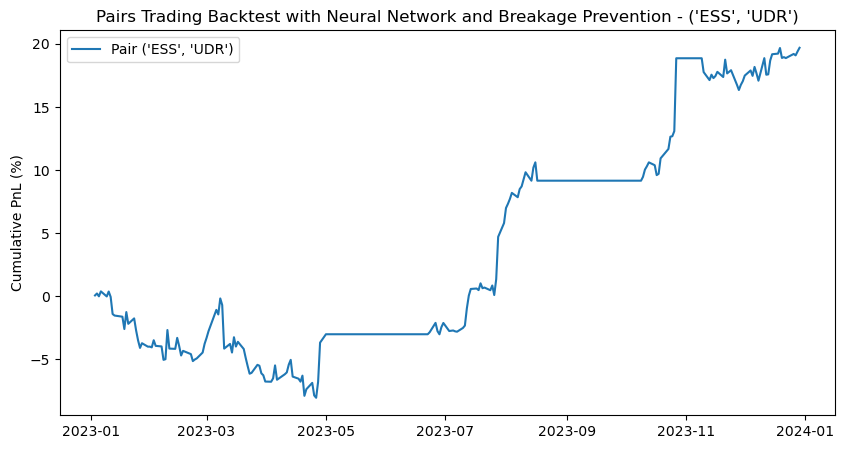

Performance for pair ('ESS', 'UDR'):
Cumulative Return: 19.87%
Sharpe Ratio: 1.61
Sortino Ratio: 0.18
Max Drawdown: -8.40%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 496us/step


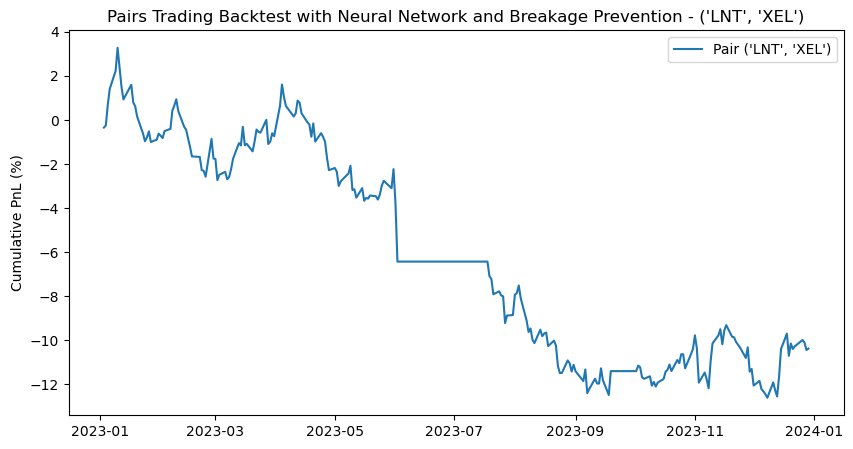

Performance for pair ('LNT', 'XEL'):
Cumulative Return: -10.47%
Sharpe Ratio: -1.20
Sortino Ratio: -0.10
Max Drawdown: -15.40%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step


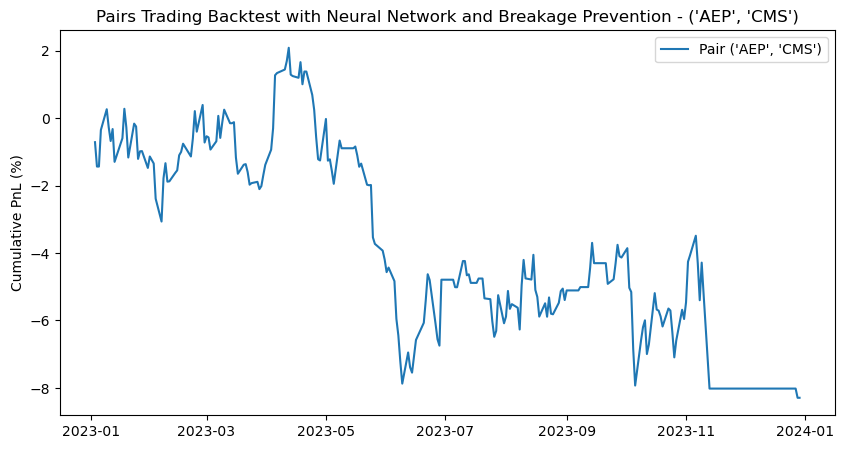

Performance for pair ('AEP', 'CMS'):
Cumulative Return: -8.35%
Sharpe Ratio: -0.85
Sortino Ratio: -0.07
Max Drawdown: -10.16%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 475us/step


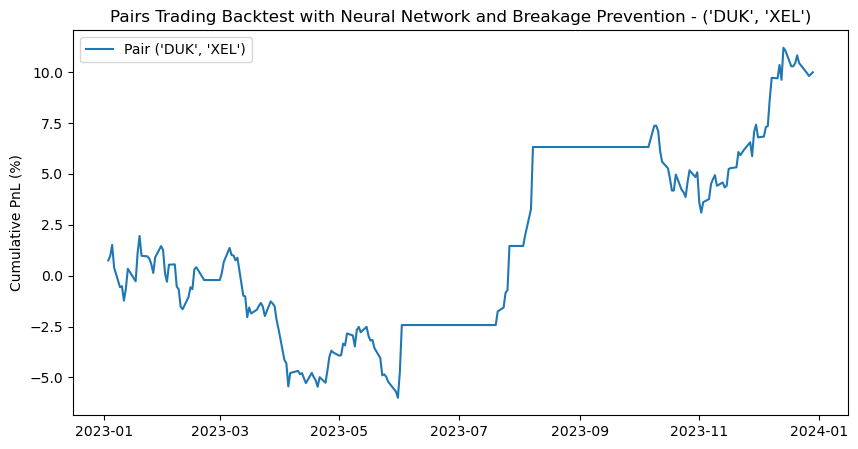

Performance for pair ('DUK', 'XEL'):
Cumulative Return: 10.08%
Sharpe Ratio: 1.14
Sortino Ratio: 0.12
Max Drawdown: -7.80%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 478us/step


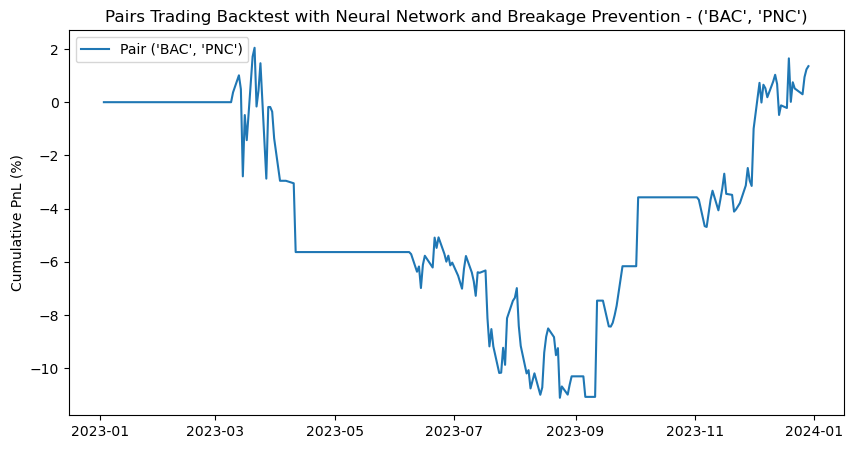

Performance for pair ('BAC', 'PNC'):
Cumulative Return: 1.36%
Sharpe Ratio: 0.17
Sortino Ratio: 0.02
Max Drawdown: -12.89%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 544us/step


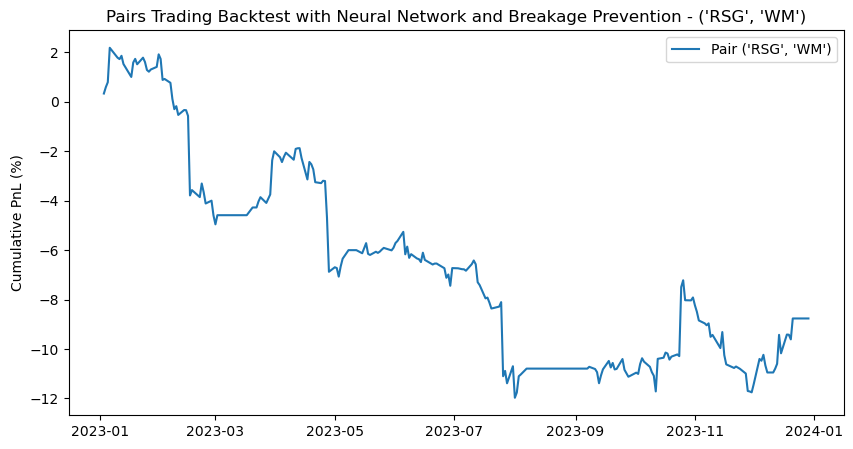

Performance for pair ('RSG', 'WM'):
Cumulative Return: -8.83%
Sharpe Ratio: -1.03
Sortino Ratio: -0.08
Max Drawdown: -13.86%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 472us/step


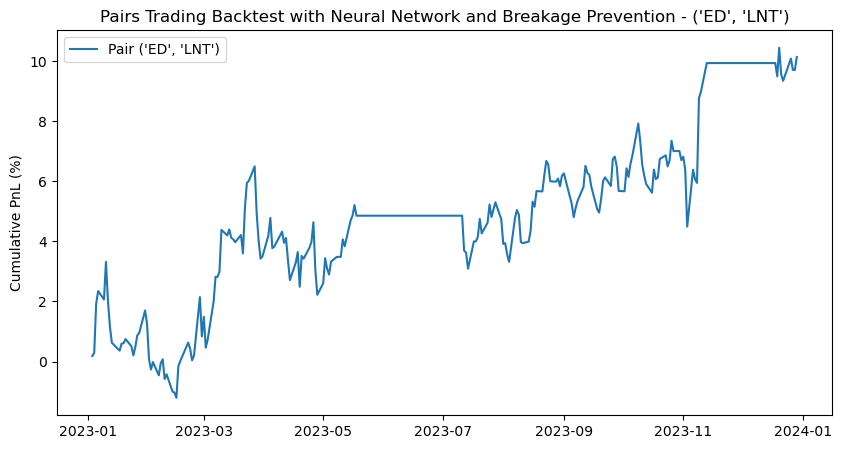

Performance for pair ('ED', 'LNT'):
Cumulative Return: 10.22%
Sharpe Ratio: 1.14
Sortino Ratio: 0.11
Max Drawdown: -4.38%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 476us/step


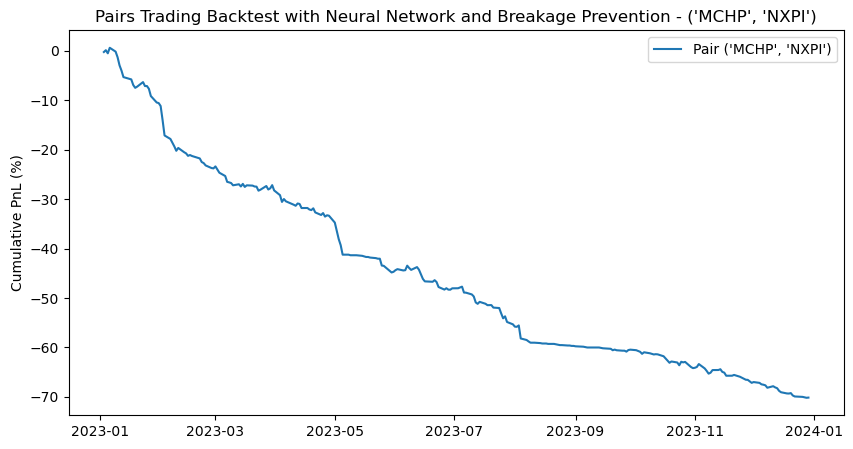

Performance for pair ('MCHP', 'NXPI'):
Cumulative Return: -70.43%
Sharpe Ratio: -8.07
Sortino Ratio: -0.48
Max Drawdown: -70.36%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 553us/step


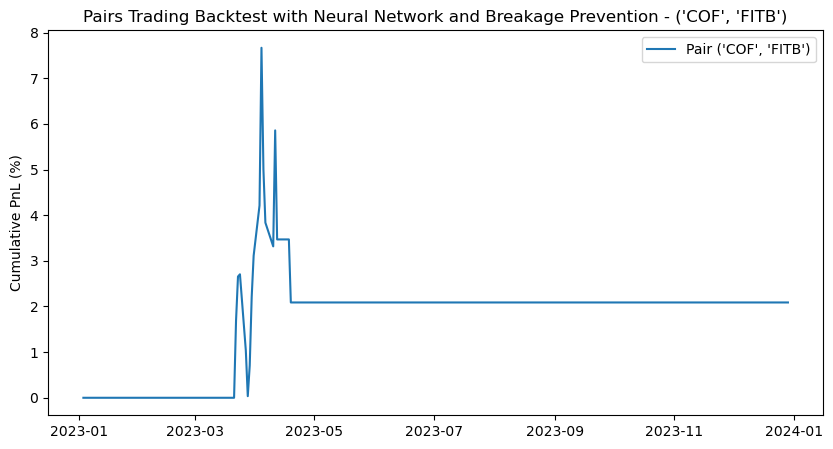

Performance for pair ('COF', 'FITB'):
Cumulative Return: 2.10%
Sharpe Ratio: 0.35
Sortino Ratio: 0.03
Max Drawdown: -5.18%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step


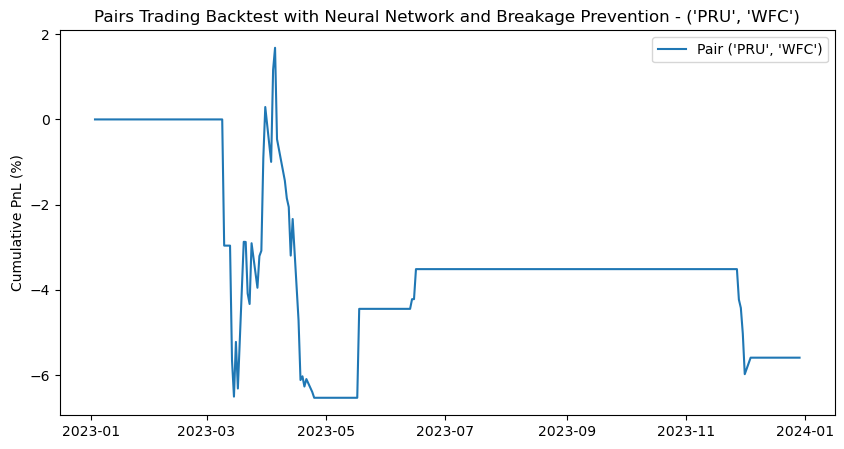

Performance for pair ('PRU', 'WFC'):
Cumulative Return: -5.64%
Sharpe Ratio: -0.62
Sortino Ratio: -0.05
Max Drawdown: -8.08%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 514us/step


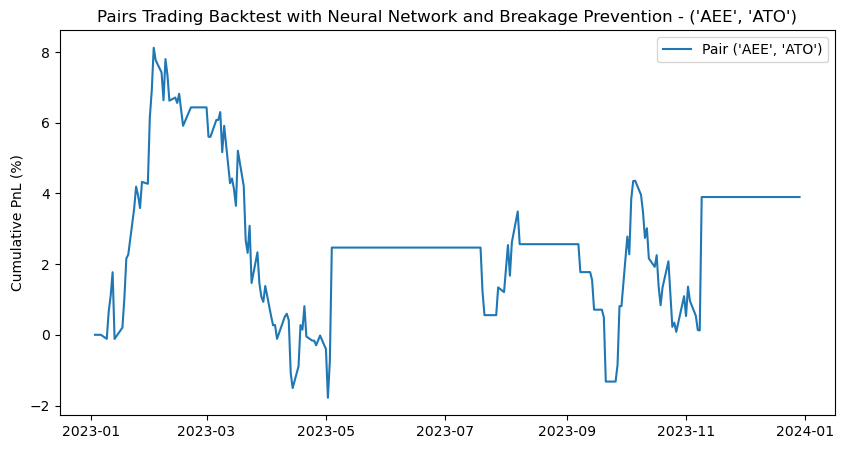

Performance for pair ('AEE', 'ATO'):
Cumulative Return: 3.93%
Sharpe Ratio: 0.44
Sortino Ratio: 0.05
Max Drawdown: -9.16%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 509us/step


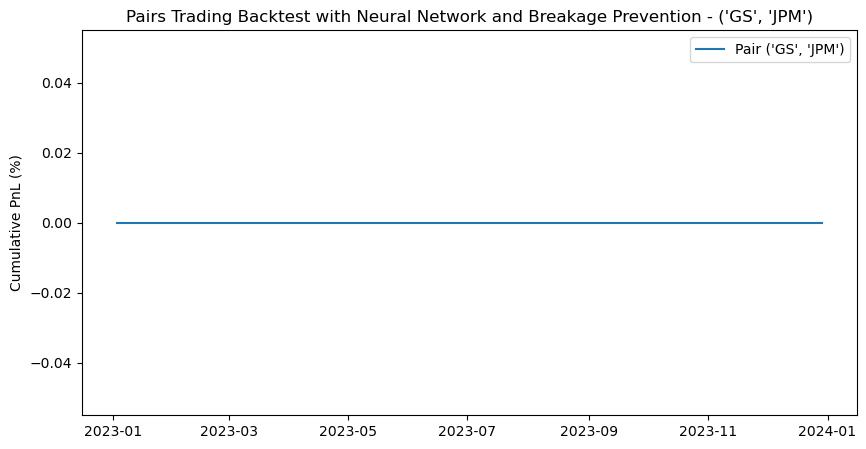

Performance for pair ('GS', 'JPM'):
Cumulative Return: 0.00%
Sharpe Ratio: nan
Sortino Ratio: nan
Max Drawdown: 0.00%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 466us/step


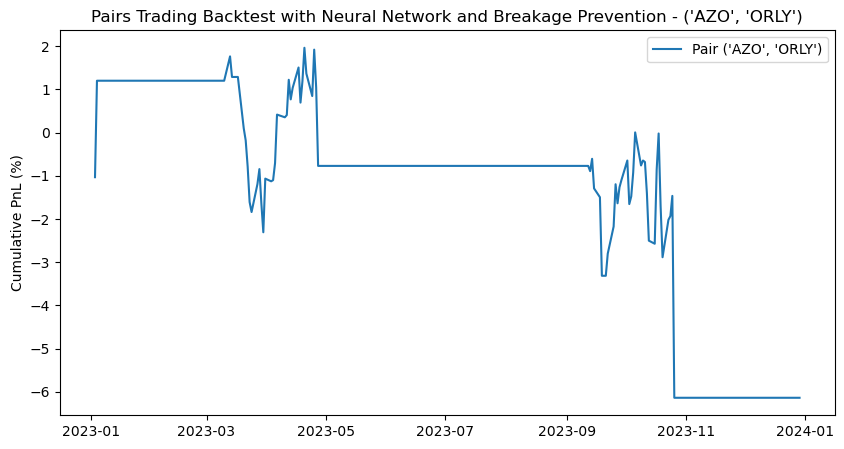

Performance for pair ('AZO', 'ORLY'):
Cumulative Return: -6.18%
Sharpe Ratio: -0.75
Sortino Ratio: -0.06
Max Drawdown: -7.94%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 464us/step


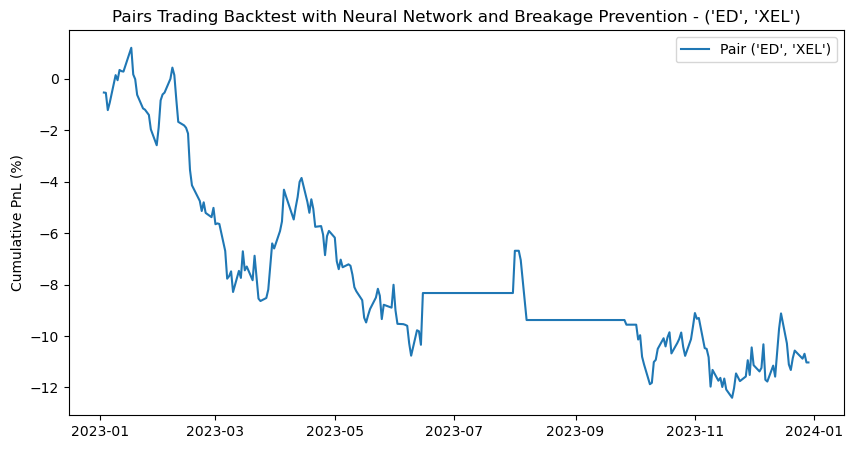

Performance for pair ('ED', 'XEL'):
Cumulative Return: -11.11%
Sharpe Ratio: -1.25
Sortino Ratio: -0.11
Max Drawdown: -13.45%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 490us/step


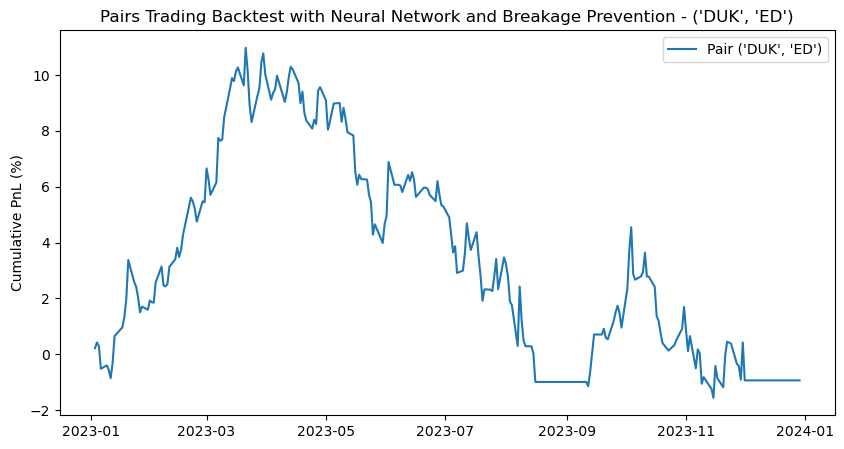

Performance for pair ('DUK', 'ED'):
Cumulative Return: -0.95%
Sharpe Ratio: -0.06
Sortino Ratio: -0.01
Max Drawdown: -11.30%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 511us/step


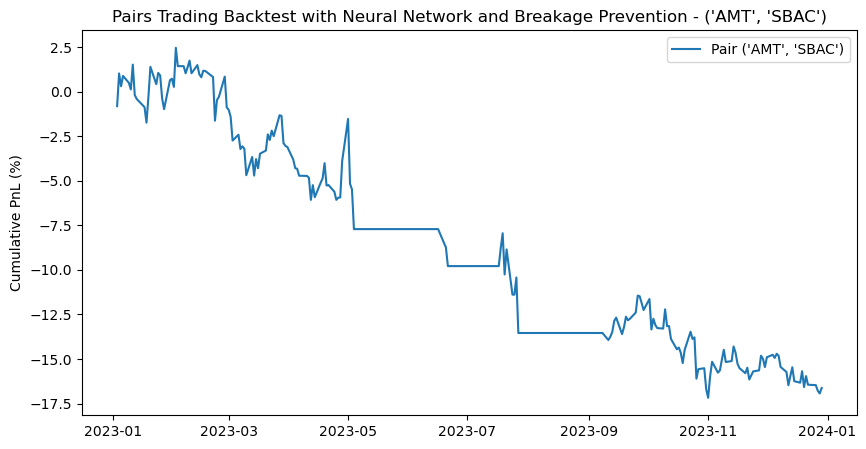

Performance for pair ('AMT', 'SBAC'):
Cumulative Return: -16.75%
Sharpe Ratio: -1.34
Sortino Ratio: -0.11
Max Drawdown: -19.16%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 468us/step


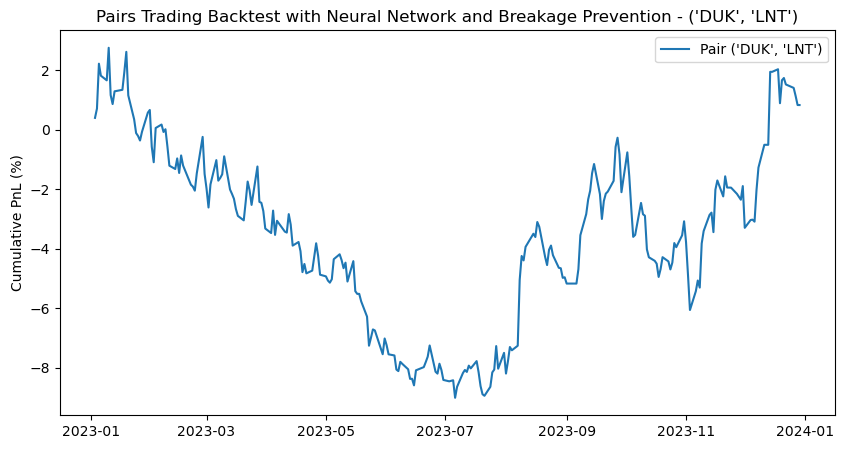

Performance for pair ('DUK', 'LNT'):
Cumulative Return: 0.84%
Sharpe Ratio: 0.13
Sortino Ratio: 0.01
Max Drawdown: -11.44%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 471us/step


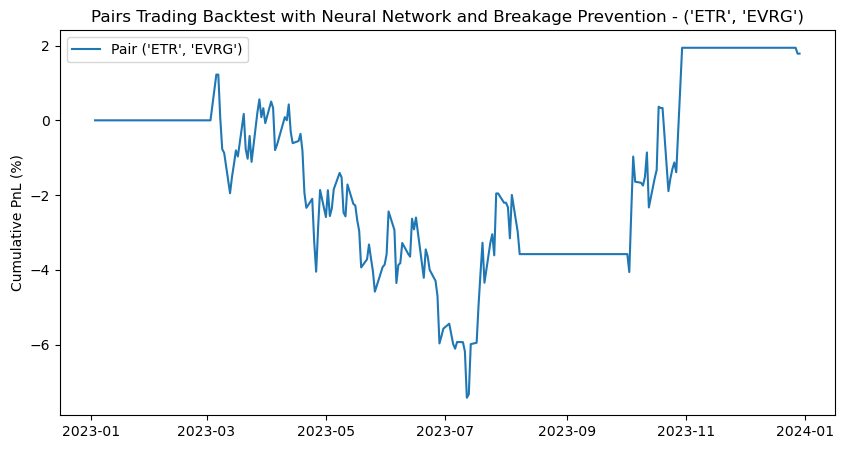

Performance for pair ('ETR', 'EVRG'):
Cumulative Return: 1.80%
Sharpe Ratio: 0.24
Sortino Ratio: 0.02
Max Drawdown: -8.55%
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 497us/step


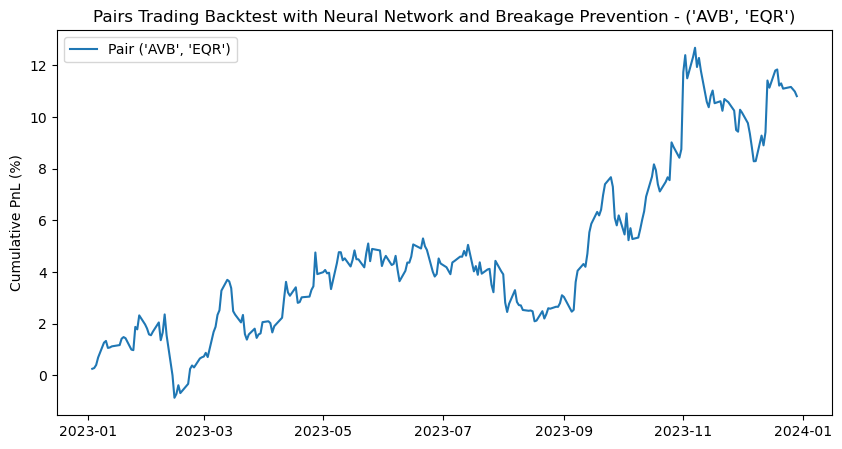

Performance for pair ('AVB', 'EQR'):
Cumulative Return: 10.90%
Sharpe Ratio: 1.39
Sortino Ratio: 0.14
Max Drawdown: -3.90%


In [42]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Function to get stock data
def get_stock_data(tickers, start_date, end_date):
    data = yf.download(tickers, start=start_date, end=end_date)['Adj Close']
    return data

# Function to generate features for neural network
def generate_features(stock1, stock2, window=30):
    spread = stock1 - stock2
    features = pd.DataFrame(index=spread.index)
    features['spread'] = spread
    features['zscore'] = (spread - spread.rolling(window).mean()) / spread.rolling(window).std()
    features['spread_change'] = spread.diff()
    features = features.dropna()
    return features

# Function to calculate hedge ratio using linear regression
def calculate_hedge_ratio(stock1, stock2):
    model = LinearRegression()
    model.fit(stock2.values.reshape(-1, 1), stock1.values)
    hedge_ratio = model.coef_[0]
    return hedge_ratio

# Function to train neural network model
def train_nn_model(features, train_start, train_end):
    X = features[['spread', 'zscore', 'spread_change']].values
    y = np.sign(features['spread_change'].shift(-1)).dropna().values
    X = X[:-1]  # Ensure X and y have the same length

    train_mask = (features.index[:-1] >= train_start) & (features.index[:-1] <= train_end)
    X_train, y_train = X[train_mask], y[train_mask]

    model = Sequential()
    model.add(Dense(64, input_dim=X.shape[1], activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='tanh'))

    model.compile(loss='mse', optimizer='adam')
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)
    
    return model

# Function to generate trading signals using the trained neural network model
def generate_signals(model, features):
    X = features[['spread', 'zscore', 'spread_change']].values
    predictions = model.predict(X)
    signals = pd.DataFrame(index=features.index)
    signals['signal'] = predictions
    signals['long'] = (signals['signal'] > 0).astype(int)
    signals['short'] = (signals['signal'] < 0).astype(int)
    return signals

# Function to calculate PnL and cumulative PnL using signals and hedge ratio with trading cost
def calculate_pnl(data, signals, hedge_ratio, initial_capital=10000, trading_cost_bps=5):
    returns = data.pct_change().dropna()
    positions = pd.DataFrame(index=signals.index).fillna(0.0)

    # Apply the signals to calculate the long and short positions
    positions[data.columns[0]] = signals['long'] - signals['short'] * hedge_ratio
    positions[data.columns[1]] = -positions[data.columns[0]] * hedge_ratio

    # Calculate the returns based on the positions
    pnl = positions.shift(1) * returns
    pnl['total'] = pnl.sum(axis=1)

    # Apply trading costs
    trade_costs = positions.diff().abs().sum(axis=1) * (trading_cost_bps / 10000)
    pnl['total'] -= trade_costs

    # Calculate the cumulative PnL in percentage terms
    cumulative_pnl = (1 + pnl['total']).cumprod() - 1

    return pnl['total'], cumulative_pnl

# Performance metrics calculation functions
def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = np.prod(returns + 1)
    return cum_ret_final ** (1 / num_years) - 1

def Sharpe(returns, risk_free=0):
    adj_returns = returns - risk_free
    return (np.nanmean(adj_returns) * np.sqrt(252)) / np.nanstd(adj_returns, ddof=1)

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, None, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def max_drawdown(returns):
    wealth_index = 10000 * (1 + returns).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdown = (wealth_index - previous_peaks) / previous_peaks
    return drawdown.min()

# Simplified function to calculate performance metrics
def calculate_performance_metrics(cumulative_pnl, returns):
    cumulative_return = annual_returns(returns) * 100
    sharpe_ratio = Sharpe(returns)
    sortino_ratio = sortino(returns)
    max_drawdown_value = max_drawdown(returns) * 100

    return cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value

# Fetch stock data for all pairs
# pair_df = pd.DataFrame([['ETR', 'NI'], ['DUK', 'ED']], columns=['Stock1', 'Stock2'])

start_date = '2018-01-01'
end_date = '2023-12-31'
all_stock_data = {}
for index, row in pair_df.iterrows():
    pair = [row['Stock1'], row['Stock2']]
    data = get_stock_data(pair, start_date, end_date)
    all_stock_data[tuple(pair)] = data

# Define training and testing periods
train_start = '2018-01-01'
train_end = '2022-12-31'
test_start = '2023-01-01'
test_end = '2023-12-31'

# Function to backtest pairs with breakage prevention
def backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end, correlation_threshold=0.8, window=30, initial_capital=10000, trading_cost_bps=5):
    positions = pd.DataFrame(index=signals.index).fillna(0.0)
    positions[stock1.name] = signals['long'] - signals['short']
    positions[stock2.name] = -positions[stock1.name]

    stock1_returns = stock1.pct_change().fillna(0)
    stock2_returns = stock2.pct_change().fillna(0)

    portfolio = pd.DataFrame(index=positions.index)
    portfolio['stock1'] = positions[stock1.name] * stock1_returns
    portfolio['stock2'] = positions[stock2.name] * stock2_returns
    portfolio['total'] = portfolio['stock1'] + portfolio['stock2']

    portfolio['returns'] = portfolio['total']

    rolling_corr = stock1_returns.rolling(window=window).corr(stock2_returns)

    portfolio['exit'] = (rolling_corr < correlation_threshold).astype(int).shift(1).fillna(0)
    portfolio.loc[portfolio['exit'] == 1, 'returns'] = 0

    test_mask = (portfolio.index >= test_start) & (portfolio.index <= test_end)
    test_portfolio = portfolio[test_mask].copy()

    # Apply trading costs
    trade_costs = positions.diff().abs().sum(axis=1) * (trading_cost_bps / 10000)
    test_portfolio['returns'] -= trade_costs[test_mask]

    # Reset cumulative returns for the test period
    test_portfolio['cumulative'] = (test_portfolio['returns'] + 1).cumprod() - 1

    return test_portfolio

# Loop through each pair and backtest using Neural Network with pair breakage prevention
results = {}
performance_metrics = {}

for pair, data in all_stock_data.items():
    stock1, stock2 = data[pair[0]], data[pair[1]]
    features = generate_features(stock1, stock2)
    if features.empty:
        continue
    hedge_ratio = calculate_hedge_ratio(stock1, stock2)
    model = train_nn_model(features, train_start, train_end)
    signals = generate_signals(model, features)
    if signals.empty:
        continue
    portfolio = backtest_pairs_with_breakage(stock1, stock2, signals, test_start, test_end)
    results[pair] = portfolio
    cumulative_pnl = portfolio['cumulative']
    pnl = portfolio['returns']
    performance_metrics[pair] = calculate_performance_metrics(cumulative_pnl, pnl)

    # Plot the results
    plt.figure(figsize=(10, 5))
    plt.plot(cumulative_pnl * 100, label=f"Pair {pair}")  # Display cumulative PnL in percentage terms
    plt.title(f"Pairs Trading Backtest with Neural Network and Breakage Prevention - {pair}")
    plt.ylabel(f"Cumulative PnL (%)")
    plt.legend()
    plt.show()

    # Print performance metrics
    cumulative_return, sharpe_ratio, sortino_ratio, max_drawdown_value = performance_metrics[pair]
    print(f"Performance for pair {pair}:")
    print(f"Cumulative Return: {cumulative_return:.2f}%")
    print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
    print(f"Sortino Ratio: {sortino_ratio:.2f}")
    print(f"Max Drawdown: {max_drawdown_value:.2f}%")